In [1]:
#pip install ethnicolr

In [2]:
#pip install ethnicolr

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, date

from ethnicolr import census_ln, pred_census_ln

In [3]:
canvas_report_2020_president = pd.read_excel('2020_November_Joint_Canvass_Report.xlsx', sheet_name='president')
canvas_report_2020_us_senator = pd.read_excel('2020_November_Joint_Canvass_Report.xlsx', sheet_name='us senator')
canvas_report_2020_us_rep_d8 = pd.read_excel('2020_November_Joint_Canvass_Report.xlsx', sheet_name='us rep d8')

canvas_report_2020_president['Early Ballots Cast'] = canvas_report_2020_president['Unnamed: 1']
del canvas_report_2020_president['Unnamed: 1']
canvas_report_2020_president['Total Ballots Cast'] = canvas_report_2020_president['Unnamed: 5']
del canvas_report_2020_president['Unnamed: 5']
canvas_report_2020_president['REP\nDonald J. Trump / Michael R. Pence'] = canvas_report_2020_president['Unnamed: 9']
del canvas_report_2020_president['Unnamed: 9']
del canvas_report_2020_president['Unnamed: 11']
canvas_report_2020_president['DEM\nJoseph R. Biden\n/ Kamala D. Harris'] = canvas_report_2020_president['Unnamed: 12']
del canvas_report_2020_president['Unnamed: 12']
canvas_report_2020_president['GRN\nHowie Hawkins / Angela Walker'] = canvas_report_2020_president['Unnamed: 15']
del canvas_report_2020_president['Unnamed: 15']
canvas_report_2020_president['President R. Boddie / Eric C. Stoneham'] = canvas_report_2020_president['Unnamed: 17']
del canvas_report_2020_president['Unnamed: 17']
canvas_report_2020_president['Brian Carroll / Amar Patel'] = canvas_report_2020_president['Unnamed: 19']
del canvas_report_2020_president['Unnamed: 19']
canvas_report_2020_president['Todd Cella / Tim Cella'] = canvas_report_2020_president['Unnamed: 21']
del canvas_report_2020_president['Unnamed: 21']
canvas_report_2020_president['Jesse Cuellar / Jimmy Monreal'] = canvas_report_2020_president['Unnamed: 23']
del canvas_report_2020_president['Unnamed: 23']
del canvas_report_2020_president['Unnamed: 24']
del canvas_report_2020_president['Unnamed: 26']
canvas_report_2020_president['Gloria La Riva / Leonard Peltier'] = canvas_report_2020_president['Unnamed: 28']
del canvas_report_2020_president['Unnamed: 28']
canvas_report_2020_president['Abram Loeb / Jennifer Jairala'] = canvas_report_2020_president['Unnamed: 29']
del canvas_report_2020_president['Unnamed: 29']
del canvas_report_2020_president['Unnamed: 32']
del canvas_report_2020_president['Unnamed: 34']
canvas_report_2020_president.drop(index=canvas_report_2020_president.index[-1], axis=0, inplace=True)



canvas_report_2020_us_senator['Early Ballots Cast'] = canvas_report_2020_us_senator['Unnamed: 1']
del canvas_report_2020_us_senator['Unnamed: 1']
canvas_report_2020_us_senator['Total Ballots Cast'] = canvas_report_2020_us_senator['Unnamed: 5']
del canvas_report_2020_us_senator['Unnamed: 5']
canvas_report_2020_us_senator['REP\nJohn Cornyn'] = canvas_report_2020_us_senator['Unnamed: 9']
del canvas_report_2020_us_senator['Unnamed: 9']
del canvas_report_2020_us_senator['Unnamed: 11']
canvas_report_2020_us_senator['DEM\nMary "MJ" Hegar'] = canvas_report_2020_us_senator['Unnamed: 12']
del canvas_report_2020_us_senator['Unnamed: 12']
canvas_report_2020_us_senator['GRN\nDavid B. Collins'] = canvas_report_2020_us_senator['Unnamed: 15']
del canvas_report_2020_us_senator['Unnamed: 15']
canvas_report_2020_us_senator['Ricardo Turullols-Bonilla'] = canvas_report_2020_us_senator['Unnamed: 17']
del canvas_report_2020_us_senator['Unnamed: 17']
canvas_report_2020_us_senator['Totals'] = canvas_report_2020_us_senator['Unnamed: 19']
del canvas_report_2020_us_senator['Unnamed: 19']
canvas_report_2020_us_senator.drop(index=canvas_report_2020_us_senator.index[-1], axis=0, inplace=True)


canvas_report_2020_us_rep_d8['Early Ballots Cast'] = canvas_report_2020_us_rep_d8['Unnamed: 1']
del canvas_report_2020_us_rep_d8['Unnamed: 1']
canvas_report_2020_us_rep_d8['Total Ballots Cast'] = canvas_report_2020_us_rep_d8['Unnamed: 5']
del canvas_report_2020_us_rep_d8['Unnamed: 5']
canvas_report_2020_us_rep_d8['REP\nKevin Brady'] = canvas_report_2020_us_rep_d8['Unnamed: 9']
del canvas_report_2020_us_rep_d8['Unnamed: 9']
del canvas_report_2020_us_rep_d8['Unnamed: 11']
canvas_report_2020_us_rep_d8['DEM\nElizabeth Hernandez'] = canvas_report_2020_us_rep_d8['Unnamed: 12']
del canvas_report_2020_us_rep_d8['Unnamed: 12']
canvas_report_2020_us_rep_d8['Totals'] = canvas_report_2020_us_rep_d8['Unnamed: 15']
del canvas_report_2020_us_rep_d8['Unnamed: 15']
canvas_report_2020_us_rep_d8.drop(index=canvas_report_2020_us_rep_d8.index[-1], axis=0, inplace=True)


In [4]:
display(canvas_report_2020_president.head())
display(canvas_report_2020_us_senator.head())
display(canvas_report_2020_us_rep_d8.head())

,Precinct,Early Ballots Cast,Election Ballots Cast,Total Ballots Cast,Registered Voters,Percent Turnout,REP\nDonald J. Trump / Michael R. Pence,DEM\nJoseph R. Biden\n/ Kamala D. Harris,"LIB\nJo Jorgensen / Jeremy ""Spike"" Cohen",GRN\nHowie Hawkins / Angela Walker,President R. Boddie / Eric C. Stoneham,Brian Carroll / Amar Patel,Todd Cella / Tim Cella,Jesse Cuellar / Jimmy Monreal,Tom Hoefling / Andy Prior,Gloria La Riva / Leonard Peltier,Abram Loeb / Jennifer Jairala,Robert Morrow / Anne Beckett,Kasey Wells / Rachel Wells,Totals
0,1,2457,215,2672,2123,1.2586,1834,791,23,8,0,2,0,0,2,0,0,0,0,2660
1,2,1665,293,1958,2630,0.7445,1365,549,20,6,0,0,0,0,0,0,0,0,0,1940
2,3,4298,421,4719,6294,0.7498,2791,1832,49,12,0,0,0,0,0,0,0,0,0,4684
3,4,1200,179,1379,2062,0.6688,743,601,18,4,0,2,0,0,0,0,0,0,0,1368
4,5,135,113,248,303,0.8185,217,26,3,0,0,0,0,0,0,0,0,0,0,246


,Precinct,Early Ballots Cast,Election Ballots Cast,Total Ballots Cast,Registered Voters,Percent Turnout,REP\nJohn Cornyn,"DEM\nMary ""MJ"" Hegar",LIB\nKerry Douglas McKennon,GRN\nDavid B. Collins,Ricardo Turullols-Bonilla,Totals
0,1,2457,215,2672,2123,1.2586,1797,722,73,16,0,2608
1,2,1665,293,1958,2630,0.7445,1365,513,37,5,0,1920
2,3,4298,421,4719,6294,0.7498,2871,1705,72,14,0,4662
3,4,1200,179,1379,2062,0.6688,743,564,28,11,0,1346
4,5,135,113,248,303,0.8185,214,27,4,0,0,245


,Precinct,Early Ballots Cast,Election Ballots Cast,Total Ballots Cast,Registered Voters,Percent Turnout,REP\nKevin Brady,DEM\nElizabeth Hernandez,LIB\nChris Duncan,Totals
0,1,1259,215,1474,2123,0.6943,963,430,31,1424
1,2,1579,293,1872,2630,0.7118,1307,487,38,1832
2,3,4298,421,4719,6294,0.7498,2920,1651,83,4654
3,4,1200,179,1379,2062,0.6688,761,543,36,1340
4,5,135,113,248,303,0.8185,221,22,2,245


In [5]:
canvas_report_2022_us_house_d2 = pd.read_excel('2022_November_Canvass_Report.xlsx', sheet_name='us rep d2')
canvas_report_2022_us_house_d8 = pd.read_excel('2022_November_Canvass_Report.xlsx', sheet_name='us rep d8')
canvas_report_2022_governor = pd.read_excel('2022_November_Canvass_Report.xlsx', sheet_name='governor')
canvas_report_2022_lt_governor = pd.read_excel('2022_November_Canvass_Report.xlsx', sheet_name='lt governor')
canvas_report_2022_attorney_general = pd.read_excel('2022_November_Canvass_Report.xlsx', sheet_name='attorney general')

del canvas_report_2022_us_house_d2['Unnamed: 2']
del canvas_report_2022_us_house_d2['Unnamed: 4']
del canvas_report_2022_us_house_d2['Unnamed: 5']
del canvas_report_2022_us_house_d2['Unnamed: 7']
del canvas_report_2022_us_house_d2['Unnamed: 9']
del canvas_report_2022_us_house_d2['Unnamed: 10']
del canvas_report_2022_us_house_d2['Unnamed: 12']
del canvas_report_2022_us_house_d2['Unnamed: 13']
del canvas_report_2022_us_house_d2['Unnamed: 14']
del canvas_report_2022_us_house_d2['Unnamed: 16']
del canvas_report_2022_us_house_d2['Unnamed: 17']
del canvas_report_2022_us_house_d2['Unnamed: 18']
del canvas_report_2022_us_house_d2['Unnamed: 19']
del canvas_report_2022_us_house_d2['Unnamed: 21']
del canvas_report_2022_us_house_d2['Unnamed: 22']
del canvas_report_2022_us_house_d2['Unnamed: 23']
del canvas_report_2022_us_house_d2['Unnamed: 24']
del canvas_report_2022_us_house_d2['Unnamed: 26']
del canvas_report_2022_us_house_d2['Unnamed: 27']
del canvas_report_2022_us_house_d2['Unnamed: 28']
del canvas_report_2022_us_house_d2['Unnamed: 29']
del canvas_report_2022_us_house_d2['Unnamed: 30']
del canvas_report_2022_us_house_d2['Unnamed: 32']
del canvas_report_2022_us_house_d2['Unnamed: 33']
del canvas_report_2022_us_house_d2['Unnamed: 34']
del canvas_report_2022_us_house_d2['Unnamed: 35']
del canvas_report_2022_us_house_d2['Unnamed: 37']
del canvas_report_2022_us_house_d2['Unnamed: 38']
del canvas_report_2022_us_house_d2['Unnamed: 39']
del canvas_report_2022_us_house_d2['Unnamed: 40']
canvas_report_2022_us_house_d2.drop(index=canvas_report_2022_us_house_d2.index[-1], axis=0, inplace=True)


del canvas_report_2022_us_house_d8['Unnamed: 2']
del canvas_report_2022_us_house_d8['Unnamed: 4']
del canvas_report_2022_us_house_d8['Unnamed: 5']
del canvas_report_2022_us_house_d8['Unnamed: 7']
del canvas_report_2022_us_house_d8['Unnamed: 8']
del canvas_report_2022_us_house_d8['Unnamed: 10']
del canvas_report_2022_us_house_d8['Unnamed: 11']
del canvas_report_2022_us_house_d8['Unnamed: 13']
del canvas_report_2022_us_house_d8['Unnamed: 14']
del canvas_report_2022_us_house_d8['Unnamed: 15']
del canvas_report_2022_us_house_d8['Unnamed: 17']
del canvas_report_2022_us_house_d8['Unnamed: 18']
del canvas_report_2022_us_house_d8['Unnamed: 19']
del canvas_report_2022_us_house_d8['Unnamed: 20']
del canvas_report_2022_us_house_d8['Unnamed: 22']
del canvas_report_2022_us_house_d8['Unnamed: 23']
del canvas_report_2022_us_house_d8['Unnamed: 24']
del canvas_report_2022_us_house_d8['Unnamed: 25']
del canvas_report_2022_us_house_d8['Unnamed: 27']
del canvas_report_2022_us_house_d8['Unnamed: 28']
del canvas_report_2022_us_house_d8['Unnamed: 29']
del canvas_report_2022_us_house_d8['Unnamed: 30']
del canvas_report_2022_us_house_d8['Unnamed: 32']
del canvas_report_2022_us_house_d8['Unnamed: 33']
del canvas_report_2022_us_house_d8['Unnamed: 34']
del canvas_report_2022_us_house_d8['Unnamed: 35']
del canvas_report_2022_us_house_d8['Unnamed: 36']
del canvas_report_2022_us_house_d8['Unnamed: 38']
del canvas_report_2022_us_house_d8['Unnamed: 39']
del canvas_report_2022_us_house_d8['Unnamed: 40']
del canvas_report_2022_us_house_d8['Unnamed: 41']
canvas_report_2022_us_house_d8.drop(index=canvas_report_2022_us_house_d8.index[-1], axis=0, inplace=True)


del canvas_report_2022_governor['Unnamed: 2']
del canvas_report_2022_governor['Unnamed: 4']
del canvas_report_2022_governor['Unnamed: 5']
del canvas_report_2022_governor['Unnamed: 7']
del canvas_report_2022_governor['Unnamed: 8']
del canvas_report_2022_governor['Unnamed: 10']
del canvas_report_2022_governor['Unnamed: 11']
del canvas_report_2022_governor['Unnamed: 12']
del canvas_report_2022_governor['Unnamed: 14']
del canvas_report_2022_governor['Unnamed: 15']
del canvas_report_2022_governor['Unnamed: 17']
del canvas_report_2022_governor['Unnamed: 16']
del canvas_report_2022_governor['Unnamed: 19']
del canvas_report_2022_governor['Unnamed: 20']
del canvas_report_2022_governor['Unnamed: 21']
del canvas_report_2022_governor['Unnamed: 22']
del canvas_report_2022_governor['Unnamed: 23']
del canvas_report_2022_governor['Unnamed: 25']
del canvas_report_2022_governor['Unnamed: 26']
del canvas_report_2022_governor['Unnamed: 27']
del canvas_report_2022_governor['Unnamed: 28']
del canvas_report_2022_governor['Unnamed: 30']
del canvas_report_2022_governor['Unnamed: 31']
del canvas_report_2022_governor['Unnamed: 32']
del canvas_report_2022_governor['Unnamed: 33']
del canvas_report_2022_governor['Unnamed: 35']
del canvas_report_2022_governor['Unnamed: 36']
del canvas_report_2022_governor['Unnamed: 37']
del canvas_report_2022_governor['Unnamed: 38']
del canvas_report_2022_governor['Unnamed: 40']
del canvas_report_2022_governor['Unnamed: 41']
del canvas_report_2022_governor['Unnamed: 42']
del canvas_report_2022_governor['Unnamed: 43']
del canvas_report_2022_governor['Unnamed: 45']
del canvas_report_2022_governor['Unnamed: 46']
del canvas_report_2022_governor['Unnamed: 47']
del canvas_report_2022_governor['Unnamed: 48']
del canvas_report_2022_governor['Unnamed: 50']
del canvas_report_2022_governor['Unnamed: 51']
del canvas_report_2022_governor['Unnamed: 53']
canvas_report_2022_governor.drop(index=canvas_report_2022_governor.index[-1], axis=0, inplace=True)


del canvas_report_2022_lt_governor['Unnamed: 2']
del canvas_report_2022_lt_governor['Unnamed: 4']
del canvas_report_2022_lt_governor['Unnamed: 5']
del canvas_report_2022_lt_governor['Unnamed: 7']
del canvas_report_2022_lt_governor['Unnamed: 8']
del canvas_report_2022_lt_governor['Unnamed: 10']
del canvas_report_2022_lt_governor['Unnamed: 11']
del canvas_report_2022_lt_governor['Unnamed: 13']
del canvas_report_2022_lt_governor['Unnamed: 14']
del canvas_report_2022_lt_governor['Unnamed: 15']
del canvas_report_2022_lt_governor['Unnamed: 17']
del canvas_report_2022_lt_governor['Unnamed: 18']
del canvas_report_2022_lt_governor['Unnamed: 19']
del canvas_report_2022_lt_governor['Unnamed: 20']
del canvas_report_2022_lt_governor['Unnamed: 22']
del canvas_report_2022_lt_governor['Unnamed: 23']
del canvas_report_2022_lt_governor['Unnamed: 24']
del canvas_report_2022_lt_governor['Unnamed: 25']
del canvas_report_2022_lt_governor['Unnamed: 27']
del canvas_report_2022_lt_governor['Unnamed: 28']
del canvas_report_2022_lt_governor['Unnamed: 29']
del canvas_report_2022_lt_governor['Unnamed: 30']
del canvas_report_2022_lt_governor['Unnamed: 32']
del canvas_report_2022_lt_governor['Unnamed: 33']
del canvas_report_2022_lt_governor['Unnamed: 34']
del canvas_report_2022_lt_governor['Unnamed: 35']
del canvas_report_2022_lt_governor['Unnamed: 36']
del canvas_report_2022_lt_governor['Unnamed: 38']
del canvas_report_2022_lt_governor['Unnamed: 39']
del canvas_report_2022_lt_governor['Unnamed: 40']
del canvas_report_2022_lt_governor['Unnamed: 41']
del canvas_report_2022_lt_governor['Unnamed: 43']
del canvas_report_2022_lt_governor['Unnamed: 44']
del canvas_report_2022_lt_governor['Unnamed: 45']
canvas_report_2022_lt_governor.drop(index=canvas_report_2022_lt_governor.index[-1], axis=0, inplace=True)


del canvas_report_2022_attorney_general['Unnamed: 2']
del canvas_report_2022_attorney_general['Unnamed: 4']
del canvas_report_2022_attorney_general['Unnamed: 5']
del canvas_report_2022_attorney_general['Unnamed: 7']
del canvas_report_2022_attorney_general['Unnamed: 8']
del canvas_report_2022_attorney_general['Unnamed: 10']
del canvas_report_2022_attorney_general['Unnamed: 11']
del canvas_report_2022_attorney_general['Unnamed: 13']
del canvas_report_2022_attorney_general['Unnamed: 14']
del canvas_report_2022_attorney_general['Unnamed: 15']
del canvas_report_2022_attorney_general['Unnamed: 17']
del canvas_report_2022_attorney_general['Unnamed: 18']
del canvas_report_2022_attorney_general['Unnamed: 19']
del canvas_report_2022_attorney_general['Unnamed: 20']
del canvas_report_2022_attorney_general['Unnamed: 22']
del canvas_report_2022_attorney_general['Unnamed: 23']
del canvas_report_2022_attorney_general['Unnamed: 24']
del canvas_report_2022_attorney_general['Unnamed: 25']
del canvas_report_2022_attorney_general['Unnamed: 27']
del canvas_report_2022_attorney_general['Unnamed: 28']
del canvas_report_2022_attorney_general['Unnamed: 29']
del canvas_report_2022_attorney_general['Unnamed: 30']
del canvas_report_2022_attorney_general['Unnamed: 32']
del canvas_report_2022_attorney_general['Unnamed: 33']
del canvas_report_2022_attorney_general['Unnamed: 34']
del canvas_report_2022_attorney_general['Unnamed: 35']
del canvas_report_2022_attorney_general['Unnamed: 36']
del canvas_report_2022_attorney_general['Unnamed: 38']
del canvas_report_2022_attorney_general['Unnamed: 39']
del canvas_report_2022_attorney_general['Unnamed: 40']
del canvas_report_2022_attorney_general['Unnamed: 41']
del canvas_report_2022_attorney_general['Unnamed: 43']
del canvas_report_2022_attorney_general['Unnamed: 44']
del canvas_report_2022_attorney_general['Unnamed: 45']
canvas_report_2022_attorney_general.drop(index=canvas_report_2022_attorney_general.index[-1], axis=0, inplace=True)

In [6]:
display(canvas_report_2022_us_house_d2.head())
display(canvas_report_2022_us_house_d8.head())
display(canvas_report_2022_governor.head())
display(canvas_report_2022_lt_governor.head())
display(canvas_report_2022_attorney_general.head())

,Precinct,"Dan Crenshaw, REP","Robin Fulford, DEM",Cast Votes,Undervotes,Overvotes,Early Voting Ballots Cast,Absentee Ballots Cast,Election Day Ballots Cast,Total Ballots Cast,Registered Voters,Turnout Percentage
0,3,1615,673,2288,33,0,1574,83,664,2321,4280,0.5423
1,4,543,374,917,25,0,559,69,314,942,1976,0.4767
2,6,1576,625,2201,25,0,1545,97,584,2226,4214,0.5282
3,7,907,182,1089,16,0,762,47,296,1105,2241,0.4931
4,12,679,164,843,9,0,369,29,454,852,2644,0.3222


,Precinct,"Morgan Luttrell, REP","Laura Jones, DEM","Roy Eriksen, LIB",Cast Votes,Undervotes,Overvotes,Early Voting Ballots Cast,Absentee Ballots Cast,Election Day Ballots Cast,Total Ballots Cast,Registered Voters,Turnout Percentage
0,1,523,215,9,747,14,0,447,25,289,761,2110,0.3607
1,2,961,326,21,1308,30,0,747,77,514,1338,2991,0.4473
2,5,200,25,2,227,4,0,80,3,148,231,331,0.6979
3,8,1561,206,18,1785,22,0,1012,60,735,1807,3452,0.5235
4,9,970,161,5,1136,10,0,683,32,431,1146,2052,0.5585


,Precinct,"Greg Abbott, REP","Beto O'Rourke, DEM","Mark Tippetts, LIB","Delilah Barrios, GRN",Jacqueline Abernathy (W),Mark V Goloby (W),Cast Votes,Undervotes,Overvotes,Early Voting Ballots Cast,Absentee Ballots Cast,Election Day Ballots Cast,Total Ballots Cast,Registered Voters,Turnout Percentage
0,1,680,366,7,2,0,0,1055,3,0,744,25,289,1058,2110,0.5014
1,2,1008,388,13,1,1,1,1412,5,0,826,77,514,1417,2991,0.4738
2,3,1556,725,23,5,0,0,2309,12,0,1574,83,664,2321,4280,0.5423
3,4,506,408,20,2,0,0,936,6,0,559,69,314,942,1976,0.4767
4,5,201,24,4,1,0,0,230,1,0,80,3,148,231,331,0.6979


,Precinct,"Dan Patrick, REP","Mike Collier, DEM","Shanna Steele, LIB",Cast Votes,Undervotes,Overvotes,Early Voting Ballots Cast,Absentee Ballots Cast,Election Day Ballots Cast,Total Ballots Cast,Registered Voters,Turnout Percentage
0,1,665,353,30,1048,10,0,744,25,289,1058,2110,0.5014
1,2,991,378,34,1403,14,0,826,77,514,1417,2991,0.4738
2,3,1530,720,59,2309,12,0,1574,83,664,2321,4280,0.5423
3,4,498,392,41,931,11,0,559,69,314,942,1976,0.4767
4,5,197,28,5,230,1,0,80,3,148,231,331,0.6979


,Precinct,"Ken Paxton, REP","Rochelle Mercedes Garza, DEM","Mark Ash, LIB",Cast Votes,Undervotes,Overvotes,Early Voting Ballots Cast,Absentee Ballots Cast,Election Day Ballots Cast,Total Ballots Cast,Registered Voters,Turnout Percentage
0,1,676,351,18,1045,13,0,744,25,289,1058,2110,0.5014
1,2,991,380,33,1404,13,0,826,77,514,1417,2991,0.4738
2,3,1535,711,53,2299,22,0,1574,83,664,2321,4280,0.5423
3,4,497,396,35,928,14,0,559,69,314,942,1976,0.4767
4,5,198,26,6,230,1,0,80,3,148,231,331,0.6979


In [7]:
reg_voters_2020 = pd.read_csv('20-07-8962RegVoterFile.CSV', low_memory=False)
reg_voters_2022 = pd.read_csv('22-06-10439RegVoterFile.CSV', low_memory=False)

del reg_voters_2020['Certificate_Number']
del reg_voters_2020['Effective_Date_of_Registration']
del reg_voters_2020['Registration_Valid_Date']
del reg_voters_2020['Mailing_Address']
del reg_voters_2020['Mailing_City']
del reg_voters_2020['Mailing_State']
del reg_voters_2020['Mailing_ZipCode']
del reg_voters_2020['Residence_Address']
del reg_voters_2020['Senatorial_District']
del reg_voters_2020['State_Rep_District']
del reg_voters_2020['Commisioner_Precinct']
del reg_voters_2020['JP_Constable_Precinct']
del reg_voters_2020['School_District']
del reg_voters_2020['City']
del reg_voters_2020['VonSuspense']

del reg_voters_2022['Certificate_Number']
del reg_voters_2022['Effective_Date_of_Registration']
del reg_voters_2022['Registration_Valid_Date']
del reg_voters_2022['Mailing_Address']
del reg_voters_2022['Mailing_City']
del reg_voters_2022['Mailing_State']
del reg_voters_2022['Mailing_ZipCode']
del reg_voters_2022['Residence_Address']
del reg_voters_2022['Senatorial_District']
del reg_voters_2022['State_Rep_District']
del reg_voters_2022['Commisioner_Precinct']
del reg_voters_2022['JP_Constable_Precinct']
del reg_voters_2022['School_District']
del reg_voters_2022['City']
del reg_voters_2022['VonSuspense']

reg_voters_2020.drop(reg_voters_2020[reg_voters_2020['Voting_Precinct'] == -1].index, inplace=True)
reg_voters_2022.drop(reg_voters_2020[reg_voters_2022['Voting_Precinct'] == -1].index, inplace=True)

display(reg_voters_2020.head())
display(reg_voters_2022.head())

C:\Users\hisho\AppData\Local\Temp\ipykernel_15184\3358247431.py:37: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  reg_voters_2022.drop(reg_voters_2020[reg_voters_2022['Voting_Precinct'] == -1].index, inplace=True)


,VUID,LastName,FirstName,Middle_Name,House_Number,Residence_Street,Residence_City,Residence_State,Residence_ZipCode,Sex,Voting_Precinct,BirthDate,Congressional_District
0,2137050070,HUSKEY,MCKENZIE,LEE,41902.0,FM 1774,MAGNOLIA,TX,77354,M,91,12/24/1998,8.0
1,1205301627,AAB,LAMTIUR,TOBING,6.0,WATERTREE DR,THE WOODLANDS,TX,77380,F,45,02/12/1957,8.0
2,1217295870,AAB,LAURA,LEIGH,6.0,WATERTREE DR,THE WOODLANDS,TX,77380,F,45,01/06/1997,8.0
3,1166720378,AAB,RANDOLPH,JAMES,6.0,WATERTREE DR,THE WOODLANDS,TX,77380,M,45,01/25/1956,8.0
4,1126164519,AALUND,MARGARET,MACHELL,22885.0,FRASER DR,PORTER,TX,77365,F,14,11/04/1951,8.0


,VUID,LastName,FirstName,Middle_Name,House_Number,Residence_Street,Residence_City,Residence_State,Residence_ZipCode,Sex,Voting_Precinct,BirthDate,Congressional_District
0,2176069448,BOUTTE,JONATHAN,ALLEN,138.0,SPRING PINES DR,SPRING,TX,77386,M,35,01/15/1988,2
1,2157648312,HELMBRECHT,AMBER,NICOLE,18695.0,PINE SHADOWS CIR,CONROE,TX,77302,F,26,11/03/1998,2
2,2169781628,AAB,ADAM,GERDASH,6.0,WATERTREE DR,THE WOODLANDS,TX,77380,M,45,10/02/1995,2
3,1205301627,AAB,LAMTIUR,TOBING,6.0,WATERTREE DR,THE WOODLANDS,TX,77380,F,45,02/12/1957,2
4,1217295870,AAB,LAURA,LEIGH,6.0,WATERTREE DR,THE WOODLANDS,TX,77380,F,45,01/06/1997,2


Percent registered voters 2020 =  0.564022409160359
Percent registered voters 2022 =  0.6041923343582554


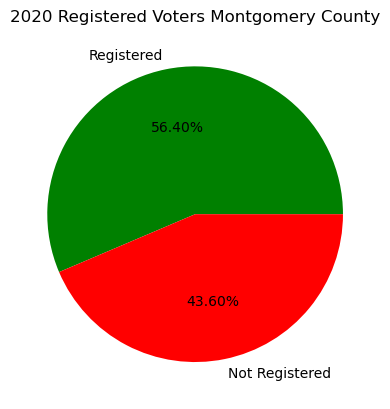

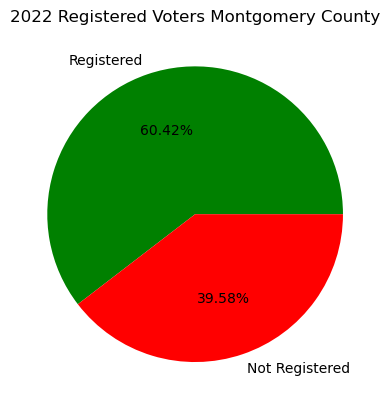

In [8]:
mont_count_tx_pop_2020 = 626351
mont_count_tx_pop_2022 = 653383


print('Percent registered voters 2020 = ', len(reg_voters_2020)/mont_count_tx_pop_2020)
print('Percent registered voters 2022 = ', len(reg_voters_2022)/mont_count_tx_pop_2022)


plt.title('2020 Registered Voters Montgomery County')
mylabels = ['Registered', 'Not Registered']
mycolors = ['g', 'r']
autopct = '%1.2f%%'
y = [len(reg_voters_2020)/mont_count_tx_pop_2020, 1-len(reg_voters_2020)/mont_count_tx_pop_2020]
plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2020 Registered Voters Montgomery County.png')
plt.show()


plt.title('2022 Registered Voters Montgomery County')
mylabels = ['Registered', 'Not Registered']
mycolors = ['g', 'r']
autopct = '%1.2f%%'
y = [len(reg_voters_2022)/mont_count_tx_pop_2022, 1-len(reg_voters_2022)/mont_count_tx_pop_2022]
plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2022 Registered Voters Montgomery County.png')
plt.show()

In [9]:
# chrome-extension://efaidnbmnnnibpcajpcglclefindmkaj/https://elections.mctx.org/pdf/rosterfileinstructions.pdf
# E = Voted Early In Person
# P = Voted on election day in person????
# A = Voted Absentee by Mail
# L = Voted Early Limited Ballot in person
# E1 = Late, Death in FamilyPerson 
# E3 = Late, Disabled Representative

general_election_2020 = pd.read_excel('2020_November_Montgomery_County_A-Z.xlsx', sheet_name='rptItSql2008VoterHistoryByAlpha')

del general_election_2020['Cert#']
del general_election_2020['Special Form']
del general_election_2020['Party']
del general_election_2020['Election']


In [10]:
general_election_2022 = pd.read_excel('2022_November_Montgomery_County.xlsx', header=1, sheet_name='rptItSql2008VoterHistoryByAlpha')
del general_election_2022['Cert#']
del general_election_2022['Special Form']
del general_election_2022['Party']
del general_election_2022['Election']
general_election_2022['VUID'] = general_election_2022['VUID'].fillna(0).astype(int)
general_election_2022['House '] = general_election_2022['House '].fillna(0).astype(int)



In [11]:
display(general_election_2020.head())
display(general_election_2022.head())

# print(general_election_2022['Precinct'].value_counts())
# display(reg_voters_2022['Voting_Precinct'].value_counts())

,Name,House,Residential Address,Mailing Address,Precinct,Cnty PCT,Date Voted,Type,VUID
0,"AAB, ADAM",6,WATERTREE DR,"6 WATERTREE DR THE WOODLANDS, TX 77380",45,45,10/17/2020,E,2169781628
1,"AAB, LAMTIUR",6,WATERTREE DR,"6 WATERTREE DR THE WOODLANDS, TX 77380",45,45,11/3/2020,P,1205301627
2,"AAB, LAURA",6,WATERTREE DR,"6 WATERTREE DR THE WOODLANDS, TX 77380",45,45,10/20/2020,A,1217295870
3,"AAB, RANDOLPH",6,WATERTREE DR,"6 WATERTREE DR THE WOODLANDS, TX 77380",45,45,11/3/2020,P,1166720378
4,"AALUND, MARGARET",22885,FRASER DR,"22885 FRASER DR PORTER, TX 77365",14,14,10/20/2020,E,1126164519


,Name,House,Residential Address,Mailing Address,Precinct,Cnty PCT,Date Voted,Type,VUID
0,"AAB, LAMTIUR",6,WATERTREE DR,"6 WATERTREE DR THE WOODLANDS, TX 77380",45,45,10/30/2022,E,1205301627
1,"AAB, LAURA",6,WATERTREE DR,"6 WATERTREE DR THE WOODLANDS, TX 77380",45,45,10/29/2022,E,1217295870
2,"AAB, RANDOLPH",6,WATERTREE DR,"6 WATERTREE DR THE WOODLANDS, TX 77380",45,45,10/31/2022,E,1166720378
3,"AALUND, MARGARET",22885,FRASER DR,"22885 FRASER DR PORTER, TX 77365",14,14,10/27/2022,E,1126164519
4,"AALUND, RITA",2755,CHESTNUT RIDGE DR #205,"2755 CHESTNUT RIDGE DR #205 KINGWOOD, TX 77339",95,95,11/1/2022,E,1036285284


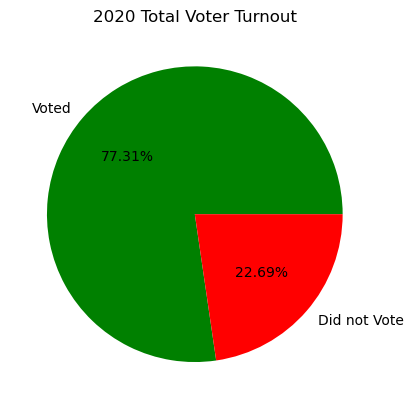

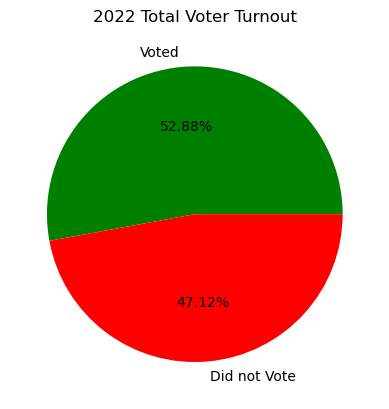

In [12]:
voter_turnout_2020 = len(general_election_2020)/len(reg_voters_2020)
did_not_show = 1-voter_turnout_2020


plt.title('2020 Total Voter Turnout')
mylabels = ['Voted', 'Did not Vote']
mycolors = ['g', 'r']
autopct = '%1.2f%%'
y = [voter_turnout_2020, did_not_show]
plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2020 Total Voter Turnout.png')
plt.show()


voter_turnout_2022 = len(general_election_2022)/len(reg_voters_2022)
did_not_show = 1-voter_turnout_2022

plt.title('2022 Total Voter Turnout')
mylabels = ['Voted', 'Did not Vote']
mycolors = ['g', 'r']
autopct = '%1.2f%%'
y = [voter_turnout_2022, did_not_show]
plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2022 Total Voter Turnout.png')
plt.show()

In [13]:
def age(born):
    born = datetime.strptime(born, "%m/%d/%Y").date()
    today = date.today()
    return today.year - born.year - ((today.month, today.day) < (born.month, born.day))
  
reg_voters_2020['Age'] = reg_voters_2020['BirthDate'].apply(age)
reg_voters_2022['Age'] = reg_voters_2022['BirthDate'].apply(age)

2020 mean reg voter age = 51.37066486260035 
2020 median reg voter age = 51.0
Females registered to vote in 2020: 179266
Males registered to vote in 2020: 161546


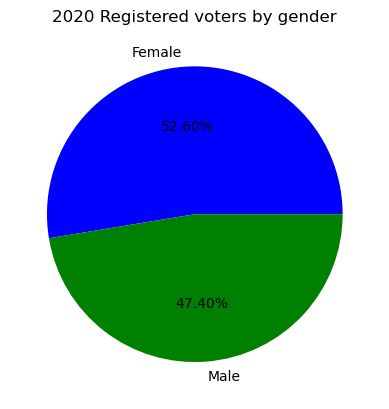



2022 mean reg voter age = 49.28415605075373 
2022 median reg voter age = 49.0
Females registered to vote in 2022: 200038
Males registered to vote in 2022: 182610


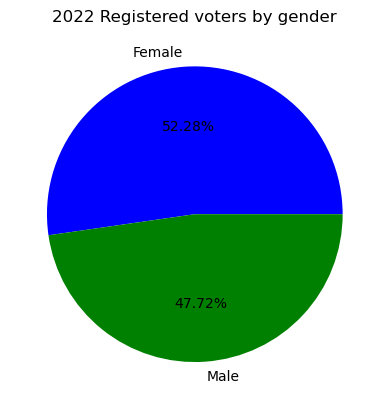

Difference females =  20772
Difference males =  21064


In [14]:
#display(reg_voters_2020.head())
#display(reg_voters_2022.head())

print('2020 mean reg voter age =', reg_voters_2020['Age'].mean(), '\n2020 median reg voter age =', reg_voters_2020['Age'].median())
print('Females registered to vote in 2020:', reg_voters_2020['Sex'].value_counts()[0])
print('Males registered to vote in 2020:', reg_voters_2020['Sex'].value_counts()[1])

plt.title('2020 Registered voters by gender')
mylabels = ['Female', 'Male']
mycolors = ['b', 'g']
autopct = '%1.2f%%'
y = [reg_voters_2020['Sex'].value_counts()[0], reg_voters_2020['Sex'].value_counts()[1]]
plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2020 Registered voters by gender.png')
plt.show()

print()
print()
print('2022 mean reg voter age =', reg_voters_2022['Age'].mean(), '\n2022 median reg voter age =', reg_voters_2022['Age'].median())
print('Females registered to vote in 2022:', reg_voters_2022['Sex'].value_counts()[0])
print('Males registered to vote in 2022:', reg_voters_2022['Sex'].value_counts()[1])

plt.title('2022 Registered voters by gender')
mylabels = ['Female', 'Male']
mycolors = ['b', 'g']
autopct = '%1.2f%%'
y = [reg_voters_2022['Sex'].value_counts()[0], reg_voters_2022['Sex'].value_counts()[1]]
plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2022 Registered voters by gender.png')
plt.show()

print("Difference females = ", reg_voters_2022['Sex'].value_counts()[0]-reg_voters_2020['Sex'].value_counts()[0])
print("Difference males = ", reg_voters_2022['Sex'].value_counts()[1]-reg_voters_2020['Sex'].value_counts()[1])



Average age of actual voters in 2020 = 53.98896745317084 
Median age of actual voters in 2020 = 55.0
Females who actually voted in 2020: 126529
Males who actually voted in 2020: 109857


Average age of actual voters in 2022 = 56.314630970547164 
Median age of actual voters in 2022 = 57.0
Females who actually voted in 2022: 86444
Males who actually voted in 2022: 78200




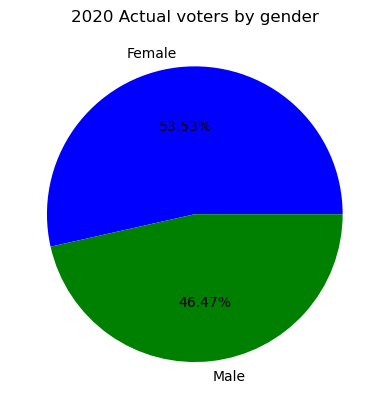

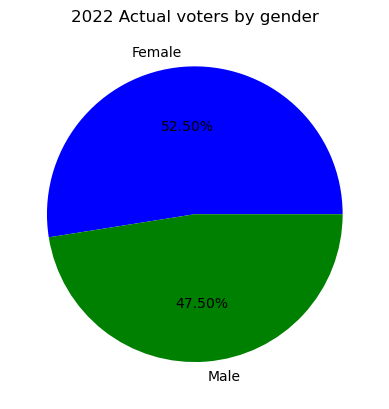

In [15]:
#print(len(general_election_2020))
#print(len(reg_voters_2020))

temp_voters_2020 = pd.merge(left=general_election_2020, right=reg_voters_2020, how='left', left_on='VUID', right_on='VUID')
temp_voters_2022 = pd.merge(left=general_election_2022, right=reg_voters_2022, how='left', left_on='VUID', right_on='VUID')

print('Average age of actual voters in 2020 =', temp_voters_2020['Age'].mean(), '\nMedian age of actual voters in 2020 =', temp_voters_2020['Age'].median())
print('Females who actually voted in 2020:', temp_voters_2020['Sex'].value_counts()[0])
print('Males who actually voted in 2020:', temp_voters_2020['Sex'].value_counts()[1])

print()
print()
print('Average age of actual voters in 2022 =', temp_voters_2022['Age'].mean(), '\nMedian age of actual voters in 2022 =', temp_voters_2022['Age'].median())
print('Females who actually voted in 2022:', temp_voters_2022['Sex'].value_counts()[0])
print('Males who actually voted in 2022:', temp_voters_2022['Sex'].value_counts()[1])
print()
print()

plt.title('2020 Actual voters by gender')
mylabels = ['Female', 'Male']
mycolors = ['b', 'g']
autopct = '%1.2f%%'
y = [temp_voters_2020['Sex'].value_counts()[0], temp_voters_2020['Sex'].value_counts()[1]]
plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2020 Actual voters by gender.png')
plt.show()

print()
print()

plt.title('2022 Actual voters by gender')
mylabels = ['Female', 'Male']
mycolors = ['b', 'g']
autopct = '%1.2f%%'
y = [temp_voters_2022['Sex'].value_counts()[0], temp_voters_2022['Sex'].value_counts()[1]]
plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2022 Actual voters by gender.png')
plt.show()

print()
print()



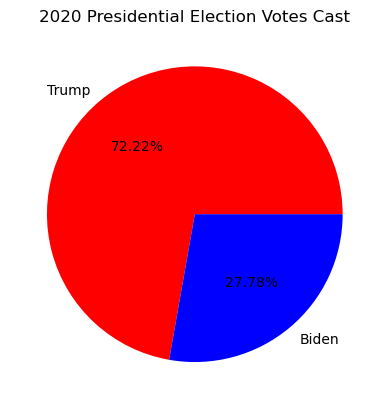

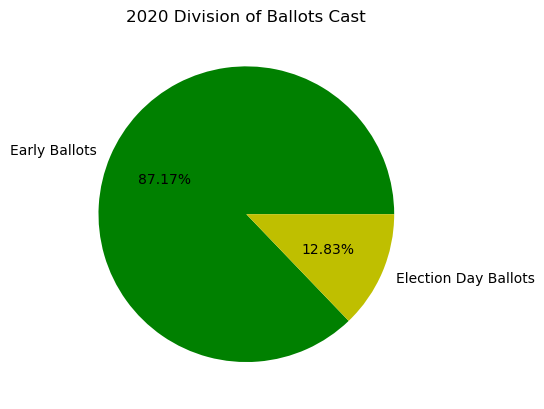

Trump raw Votes =  193382
Biden raw Votes =  74377
Total Votes Cast =  273091


In [16]:
#display(canvas_report_2020_president.head())

plt.title('2020 Presidential Election Votes Cast')
mylabels = ['Trump', 'Biden']
mycolors = ['r', 'b']
autopct = '%1.2f%%'
y = [canvas_report_2020_president['REP\nDonald J. Trump / Michael R. Pence'].sum(), canvas_report_2020_president['DEM\nJoseph R. Biden\n/ Kamala D. Harris'].sum()]
plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2020 Presidential Election Votes Cast.png')
plt.show()

plt.title('2020 Division of Ballots Cast')
mylabels = ['Early Ballots', 'Election Day Ballots']
mycolors = ['g', 'y']
y = [canvas_report_2020_president['Early Ballots Cast'].sum(), canvas_report_2020_president['Election Ballots Cast'].sum()]
plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2020 Division of Ballots Cast.png')
plt.show()

print('Trump raw Votes = ', canvas_report_2020_president['REP\nDonald J. Trump / Michael R. Pence'].sum())
print('Biden raw Votes = ', canvas_report_2020_president['DEM\nJoseph R. Biden\n/ Kamala D. Harris'].sum())
print('Total Votes Cast = ', canvas_report_2020_president['Total Ballots Cast'].sum())

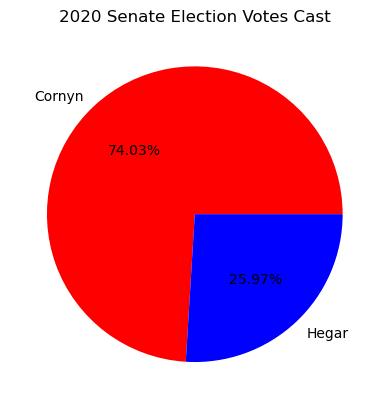

Cornyn raw Votes =  194528
Hegar raw Votes =  68254
Total Votes Cast =  273091


In [17]:
#display(canvas_report_2020_us_senator.head())

plt.title('2020 Senate Election Votes Cast')
mylabels = ['Cornyn', 'Hegar']
mycolors = ['r', 'b']
autopct = '%1.2f%%'
y = [canvas_report_2020_us_senator['REP\nJohn Cornyn'].sum(), canvas_report_2020_us_senator['DEM\nMary "MJ" Hegar'].sum()]
plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2020 Senate Election Votes Cast.png')
plt.show()

print('Cornyn raw Votes = ', canvas_report_2020_us_senator['REP\nJohn Cornyn'].sum())
print('Hegar raw Votes = ', canvas_report_2020_us_senator['DEM\nMary "MJ" Hegar'].sum())
print('Total Votes Cast = ', canvas_report_2020_us_senator['Total Ballots Cast'].sum())

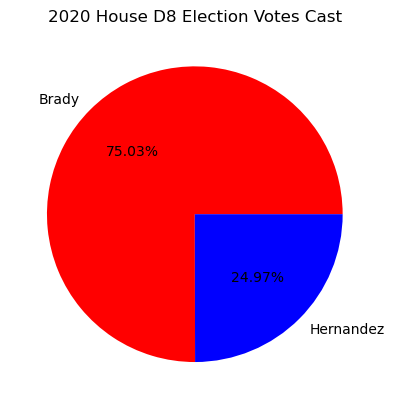

Brady raw Votes =  196032
Hernandez raw Votes =  65242
Total Votes Cast =  271806


In [18]:
#display(canvas_report_2020_us_rep_d8.head())

plt.title('2020 House D8 Election Votes Cast')
mylabels = ['Brady', 'Hernandez']
mycolors = ['r', 'b']
autopct = '%1.2f%%'
y = [canvas_report_2020_us_rep_d8['REP\nKevin Brady'].sum(), canvas_report_2020_us_rep_d8['DEM\nElizabeth Hernandez'].sum()]
plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2020 House D8 Election Votes Cast.png')
plt.show()

print('Brady raw Votes = ', canvas_report_2020_us_rep_d8['REP\nKevin Brady'].sum())
print('Hernandez raw Votes = ', canvas_report_2020_us_rep_d8['DEM\nElizabeth Hernandez'].sum())
print('Total Votes Cast = ', canvas_report_2020_us_rep_d8['Total Ballots Cast'].sum())

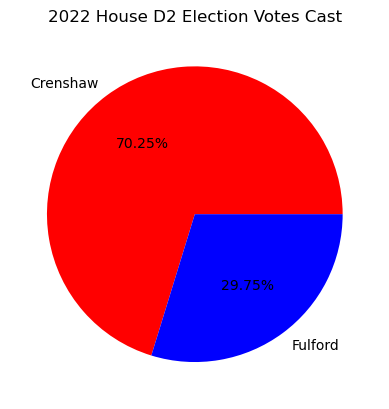

Crenshaw raw Votes =  74109
Fulford raw Votes =  31384
Total Votes Cast =  105493


In [19]:
#display(canvas_report_2022_us_house_d2.head())

plt.title('2022 House D2 Election Votes Cast')
mylabels = ['Crenshaw', 'Fulford']
mycolors = ['r', 'b']
autopct = '%1.2f%%'
y = [canvas_report_2022_us_house_d2['Dan Crenshaw, REP'].sum(), canvas_report_2022_us_house_d2['Robin Fulford, DEM'].sum()]
plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2022 House D2 Election Votes Cast.png')
plt.show()

print('Crenshaw raw Votes = ', canvas_report_2022_us_house_d2['Dan Crenshaw, REP'].sum())
print('Fulford raw Votes = ', canvas_report_2022_us_house_d2['Robin Fulford, DEM'].sum())
print('Total Votes Cast = ', canvas_report_2022_us_house_d2['Cast Votes'].sum())

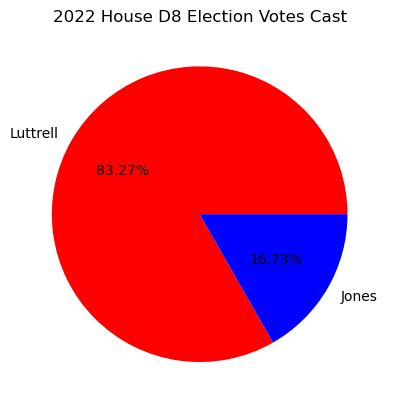

Luttrell raw Votes =  81892
Jones raw Votes =  16456
Total Votes Cast =  99573


In [20]:
#display(canvas_report_2022_us_house_d8.head())

plt.title('2022 House D8 Election Votes Cast')
mylabels = ['Luttrell', 'Jones']
mycolors = ['r', 'b']
autopct = '%1.2f%%'
y = [canvas_report_2022_us_house_d8['Morgan Luttrell, REP'].sum(), canvas_report_2022_us_house_d8['Laura Jones, DEM'].sum()]
plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2022 House D8 Election Votes Cast.png')
plt.show()

print('Luttrell raw Votes = ', canvas_report_2022_us_house_d8['Morgan Luttrell, REP'].sum())
print('Jones raw Votes = ', canvas_report_2022_us_house_d8['Laura Jones, DEM'].sum())
print('Total Votes Cast = ', canvas_report_2022_us_house_d8['Cast Votes'].sum())

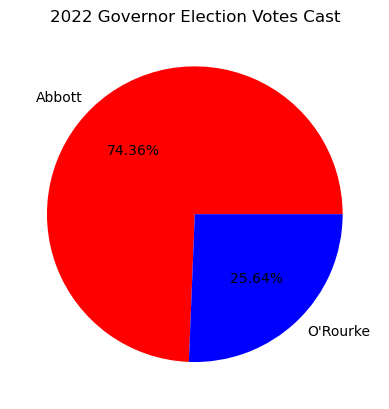

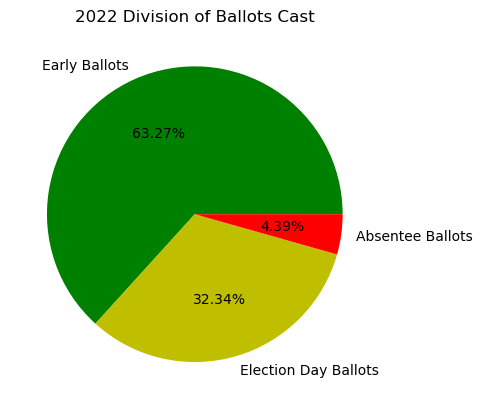

Abbott raw Votes =  152694
O'Rourke raw Votes =  52654
Total Votes Cast =  208055


In [21]:
#display(canvas_report_2022_governor.head())

plt.title('2022 Governor Election Votes Cast')
mylabels = ["Abbott", "O'Rourke"]
mycolors = ['r', 'b']
autopct = '%1.2f%%'
y = [canvas_report_2022_governor['Greg Abbott, REP'].sum(), canvas_report_2022_governor["Beto O'Rourke, DEM"].sum()]
plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2022 Governor Election Votes Cast.png')
plt.show()

plt.title('2022 Division of Ballots Cast')
mylabels = ['Early Ballots', 'Election Day Ballots', 'Absentee Ballots']
mycolors = ['g', 'y', 'r']
y = [canvas_report_2022_governor['Early Voting Ballots Cast'].sum(), canvas_report_2022_governor['Election Day Ballots Cast'].sum(), canvas_report_2022_governor['Absentee Ballots Cast'].sum()]
plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2022 Division of Ballots Cast.png')
plt.show()

print('Abbott raw Votes = ', canvas_report_2022_governor['Greg Abbott, REP'].sum())
print("O'Rourke raw Votes = ", canvas_report_2022_governor["Beto O'Rourke, DEM"].sum())
print('Total Votes Cast = ', canvas_report_2022_governor['Cast Votes'].sum())

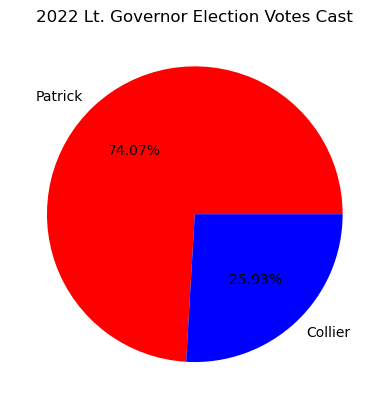

Patrick raw Votes =  150172
Collier raw Votes =  52581
Total Votes Cast =  207381


In [22]:
#display(canvas_report_2022_lt_governor.head())

plt.title('2022 Lt. Governor Election Votes Cast')
mylabels = ["Patrick", "Collier"]
mycolors = ['r', 'b']
autopct = '%1.2f%%'
y = [canvas_report_2022_lt_governor['Dan Patrick, REP'].sum(), canvas_report_2022_lt_governor["Mike Collier, DEM"].sum()]
plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2022 Lt. Governor Election Votes Cast.png')
plt.show()

print('Patrick raw Votes = ', canvas_report_2022_lt_governor['Dan Patrick, REP'].sum())
print("Collier raw Votes = ", canvas_report_2022_lt_governor["Mike Collier, DEM"].sum())
print('Total Votes Cast = ', canvas_report_2022_lt_governor['Cast Votes'].sum())

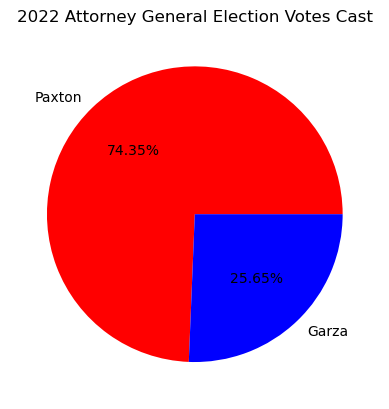

Paxton raw Votes =  149854
Garza raw Votes =  51691
Total Votes Cast =  206850


In [23]:
#display(canvas_report_2022_attorney_general.head())

plt.title('2022 Attorney General Election Votes Cast')
mylabels = ["Paxton", "Garza"]
mycolors = ['r', 'b']
autopct = '%1.2f%%'
y = [canvas_report_2022_attorney_general['Ken Paxton, REP'].sum(), canvas_report_2022_attorney_general["Rochelle Mercedes Garza, DEM"].sum()]
plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2022 Attorney General Election Votes Cast.png')
plt.show()

print('Paxton raw Votes = ', canvas_report_2022_attorney_general['Ken Paxton, REP'].sum())
print("Garza raw Votes = ", canvas_report_2022_attorney_general["Rochelle Mercedes Garza, DEM"].sum())
print('Total Votes Cast = ', canvas_report_2022_attorney_general['Cast Votes'].sum())

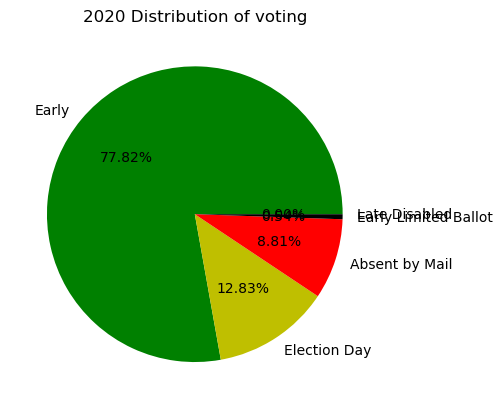

Raw Numbers = 
 E     212532
P      35032
A      24062
L       1486
E3         8
Name: Type, dtype: int64
Total number of voters =  273120
2020 Total number of registered voters =  353276
2020 Turnout percentage =  0.7731065795581925




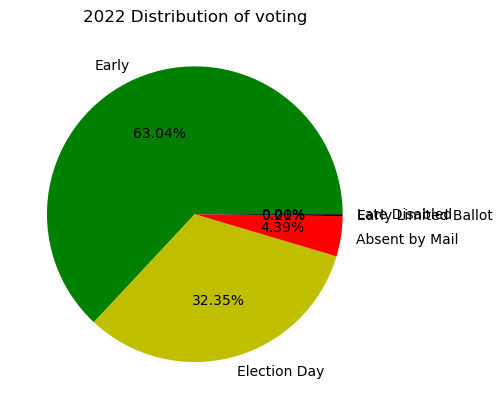

Raw Numbers = 
 E     131619
P      67539
A       9175
L        435
E3         2
Name: Type, dtype: int64
Total number of voters =  208770
2022 Total number of registered voters =  394769
2022 Turnout percentage =  0.5288409170932875

E    -80913
P     32507
A    -14887
L     -1051
E3       -6
Name: Type, dtype: int64


In [24]:
# E = Voted Early In Person
# P = Voted on election day in person????
# A = Voted Absentee by Mail
# L = Voted Early Limited Ballot in person
# E1 = Late, Death in FamilyPerson 
# E3 = Late, Disabled Representative

#display(general_election_2020.head())
#display(reg_voters_2020.head())

plt.title('2020 Distribution of voting')
mylabels = ["Early", "Election Day", "Absent by Mail", "Early Limited Ballot", "Late Disabled"]
mycolors = ['g', 'y', 'r', 'black', 'b']
autopct = '%1.2f%%'
y = general_election_2020['Type'].value_counts()
plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2020 Distribution of voting.png')
plt.show()

print('Raw Numbers = \n', general_election_2020['Type'].value_counts())
print("Total number of voters = ", len(general_election_2020))
print('2020 Total number of registered voters = ', len(reg_voters_2020))
print('2020 Turnout percentage = ', len(general_election_2020)/len(reg_voters_2020))
print()
print()


plt.title('2022 Distribution of voting')
mylabels = ["Early", "Election Day", "Absent by Mail", "Early Limited Ballot", "Late Disabled"]
mycolors = ['g', 'y', 'r', 'black', 'b']
autopct = '%1.2f%%'
z = general_election_2022['Type'].value_counts()
plt.pie(z, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2020 Distribution of voting.png')
plt.show()

print('Raw Numbers = \n', general_election_2022['Type'].value_counts())
print("Total number of voters = ", len(general_election_2022))
print('2022 Total number of registered voters = ', len(reg_voters_2022))
print('2022 Turnout percentage = ', len(general_election_2022)/len(reg_voters_2022))

differences = z-y
print()
print(differences)


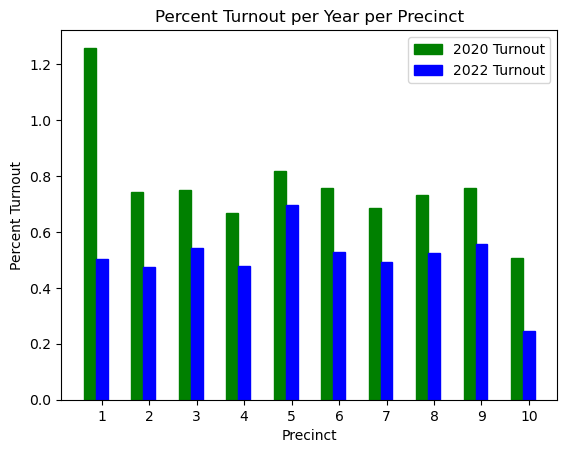

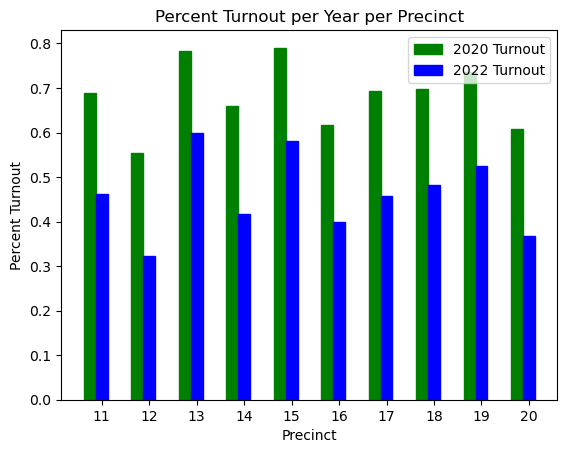

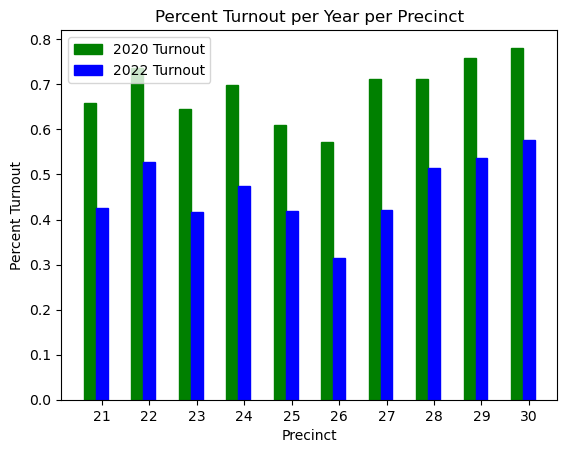

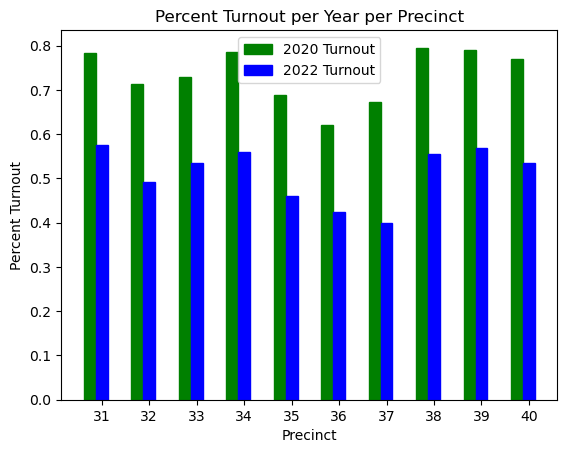

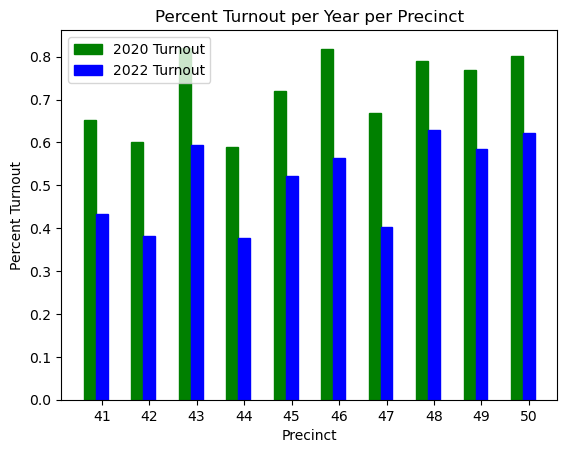

...

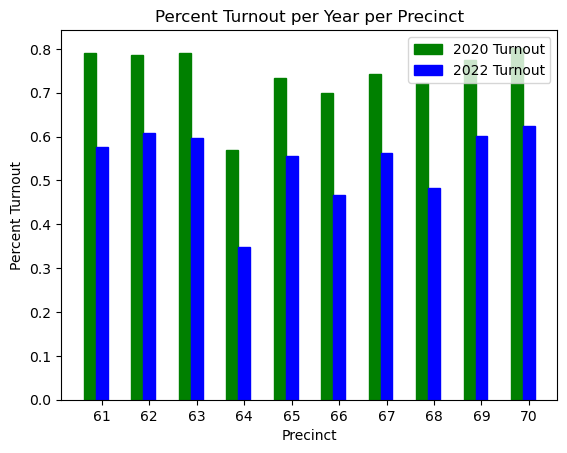

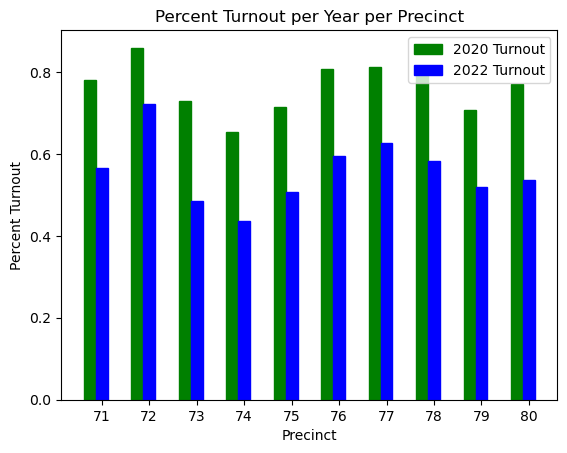

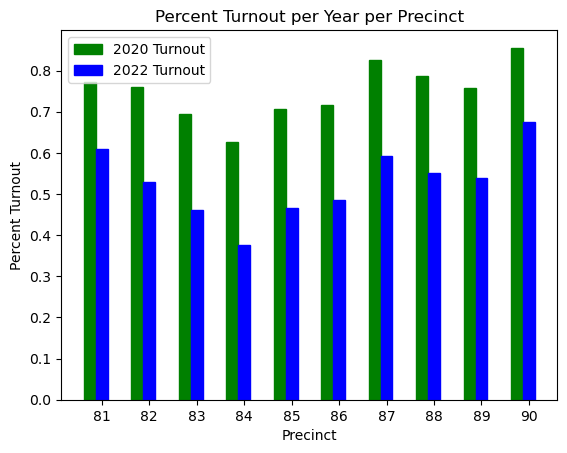

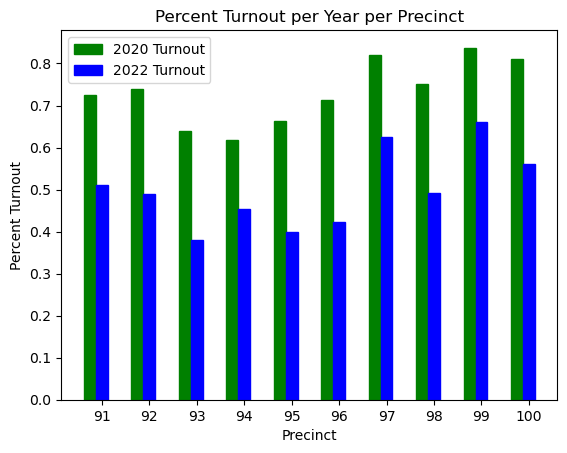

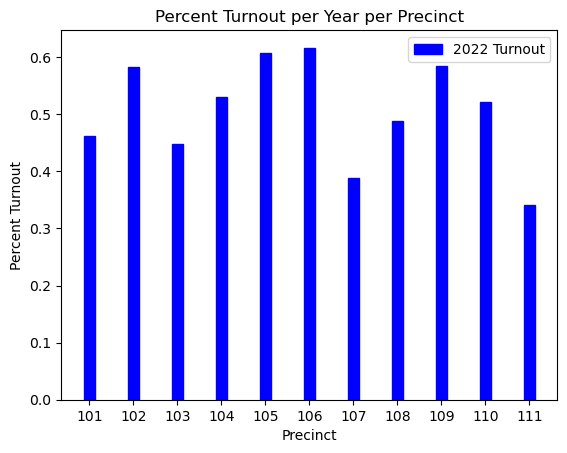

In [25]:
#turnout percent by precinct by year
# display(canvas_report_2020_president.head())
# display(canvas_report_2022_governor.head())


r = np.arange(10)
labels = np.arange(10)+1
width = 0.25
for index in range(0, len(canvas_report_2020_president), 10):
    x_2020 = canvas_report_2020_president['Percent Turnout'][index:index+10]
    x_2022 = canvas_report_2022_governor['Turnout Percentage'][index:index+10]

    plt.xticks(r+width,labels+index)  

    plt.bar(r, x_2020, color = 'g', width = width, edgecolor = 'g', label='2020 Turnout')
    plt.bar(r + width, x_2022, color = 'b', width = width, edgecolor = 'b', label='2022 Turnout')

    plt.xlabel("Precinct")
    plt.ylabel("Percent Turnout")
    plt.title("Percent Turnout per Year per Precinct")
  
    plt.legend()
    file_name = 'Percent Turnout per Year per Precinct' + str(index) + '.png'
    #plt.savefig(file_name)
    plt.show()

r = np.arange(11)
x_2022 = canvas_report_2022_governor['Turnout Percentage'][100:111]    
plt.xticks(r+width,r+index+11)  

plt.bar(r + width, x_2022, color = 'b', width = width, edgecolor = 'b', label='2022 Turnout')

plt.xlabel("Precinct")
plt.ylabel("Percent Turnout")
plt.title("Percent Turnout per Year per Precinct")

plt.legend() 
#plt.savefig('Percent Turnout per Year per Precinct11.png')
plt.show()


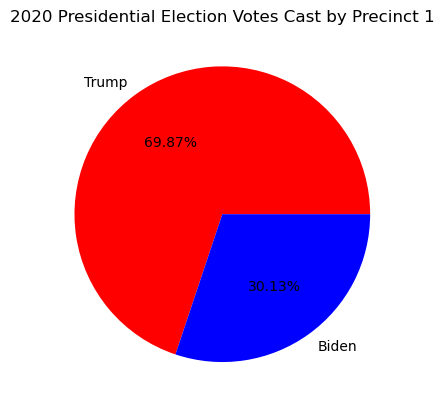

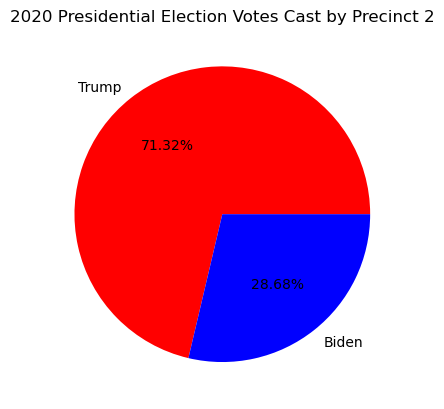

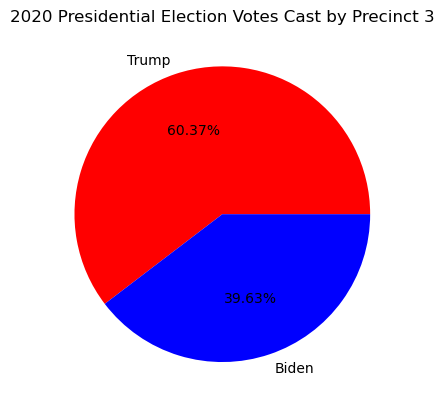

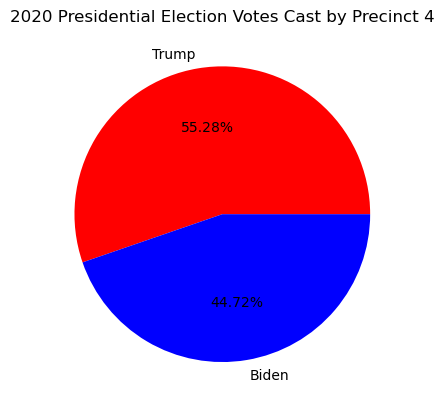

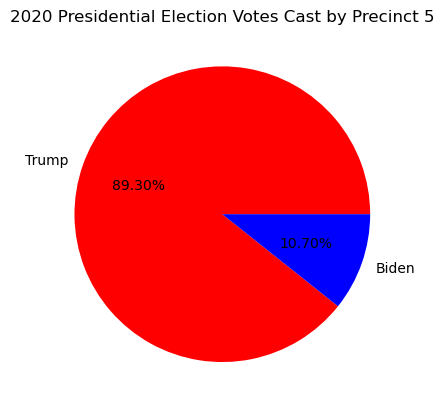

...

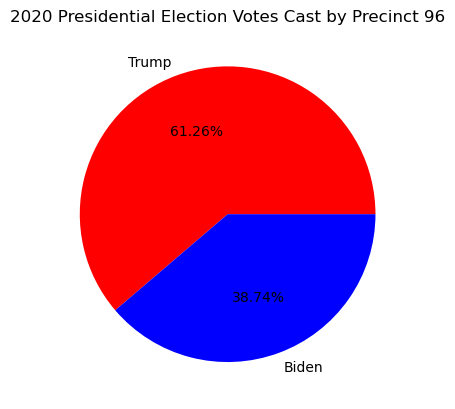

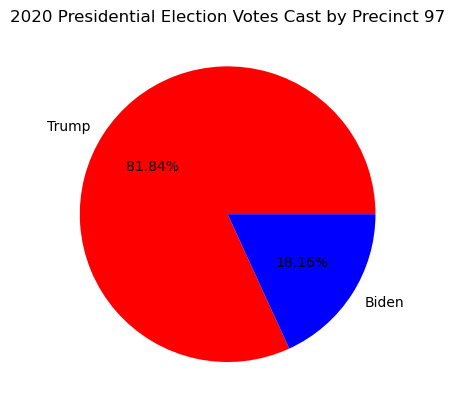

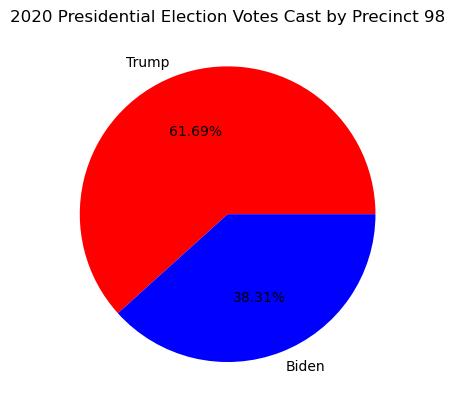

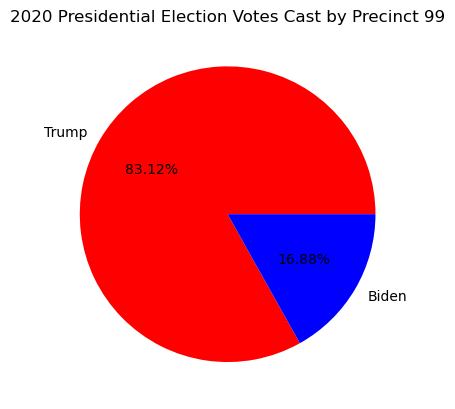

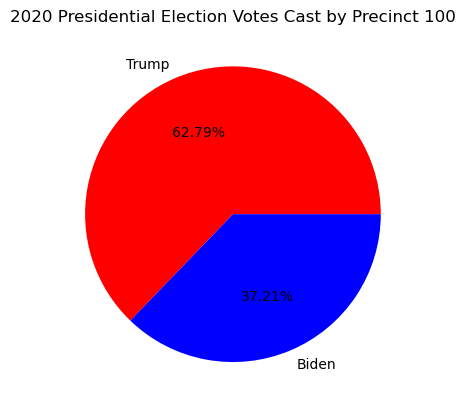

In [26]:
mylabels = ["Trump", "Biden"]
mycolors = ['r', 'b']
autopct = '%1.2f%%'

#pres_election_raw_totals_precinct = []
for index in range(len(canvas_report_2020_president)):
    title = '2020 Presidential Election Votes Cast by Precinct ' + str(index + 1)
    plt.title(title)
    rep = canvas_report_2020_president['REP\nDonald J. Trump / Michael R. Pence'][index]
    dem = canvas_report_2020_president["DEM\nJoseph R. Biden\n/ Kamala D. Harris"][index]
    y = [rep, dem]
    plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
    plt.show()


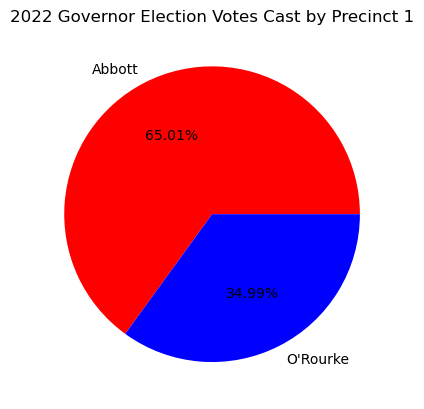

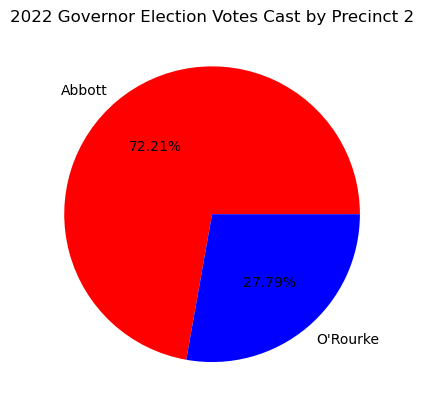

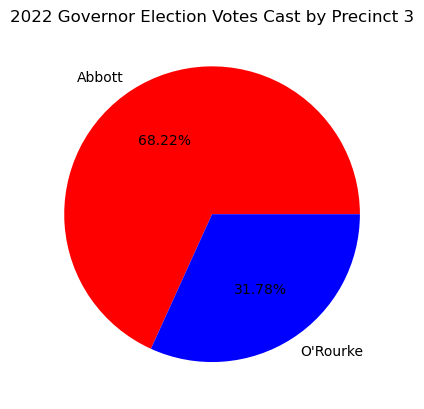

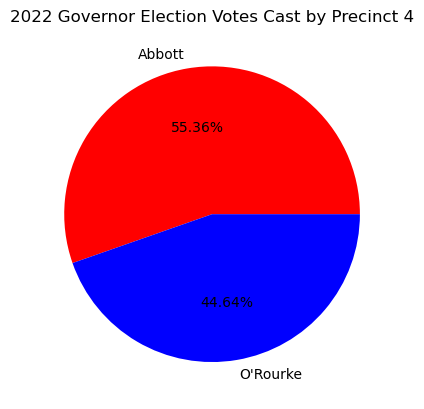

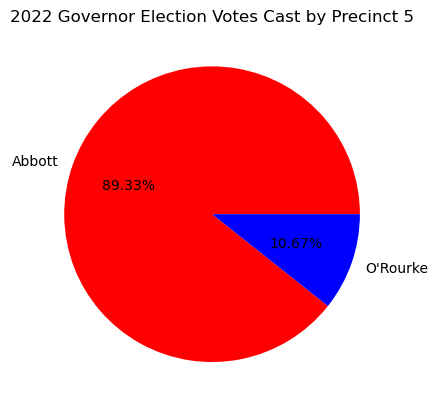

...

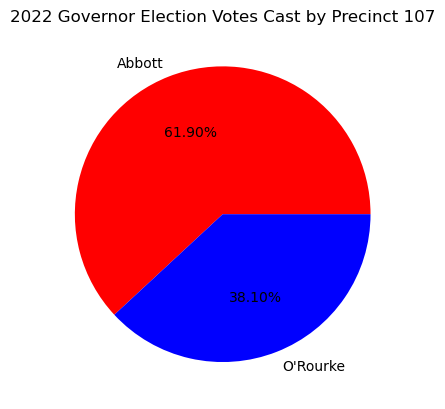

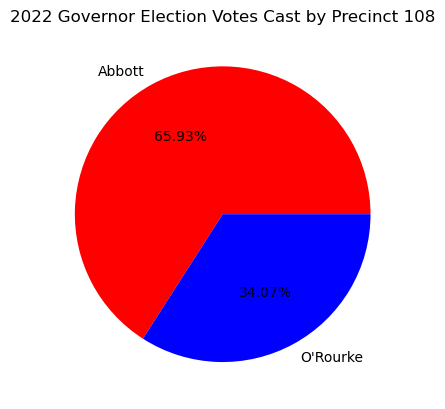

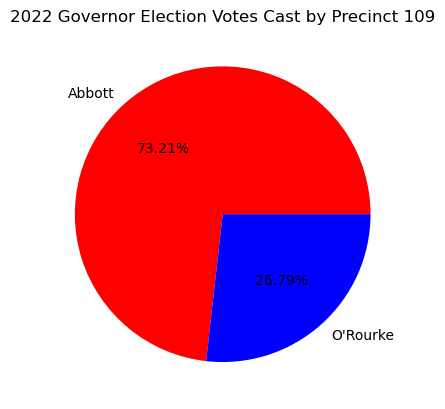

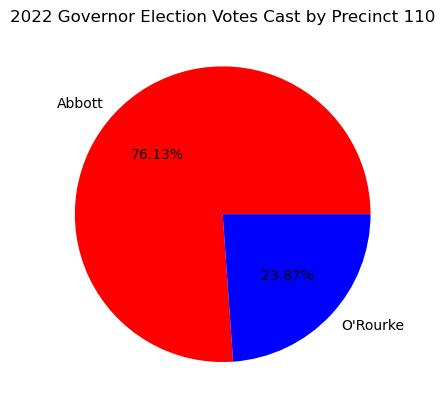

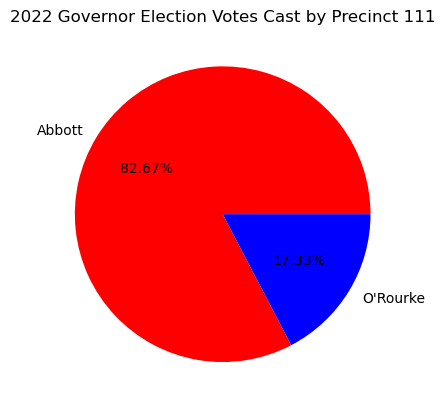

In [27]:
mylabels = ["Abbott", "O'Rourke"]
mycolors = ['r', 'b']
autopct = '%1.2f%%'

for index in range(len(canvas_report_2022_governor)):
    title = '2022 Governor Election Votes Cast by Precinct ' + str(index + 1)
    plt.title(title)
    rep = canvas_report_2022_governor['Greg Abbott, REP'][index]
    dem = canvas_report_2022_governor["Beto O'Rourke, DEM"][index]
    y = [rep, dem]
    plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
    plt.show()
    
    

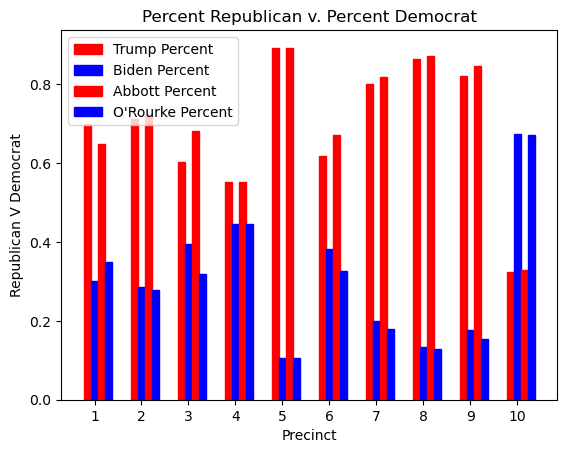

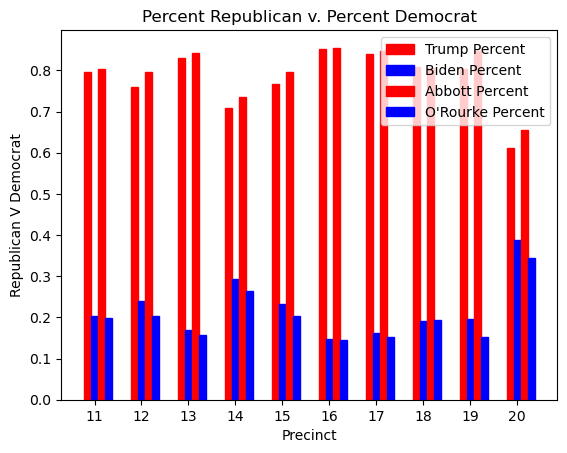

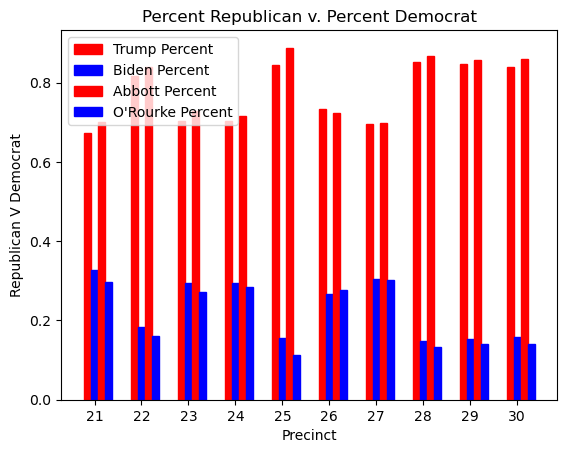

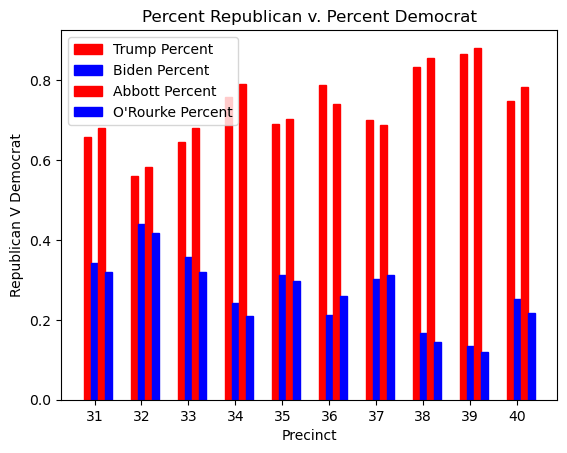

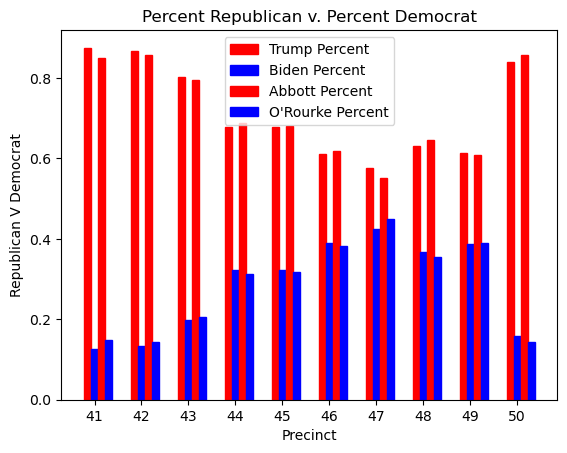

...

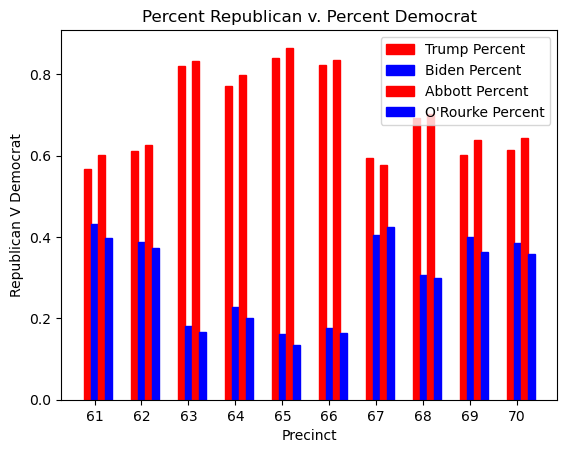

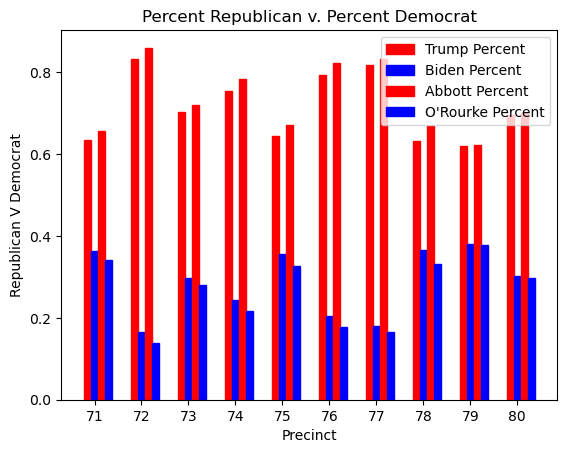

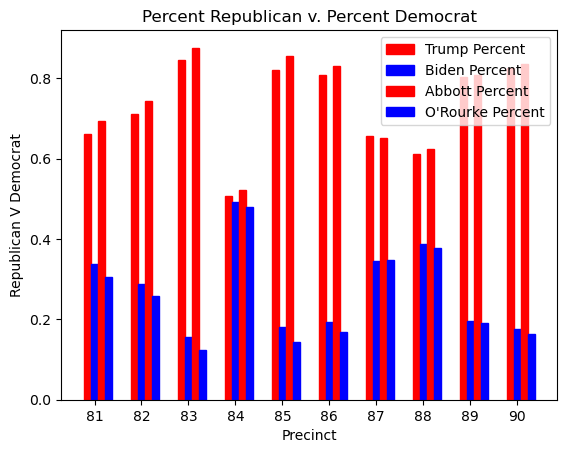

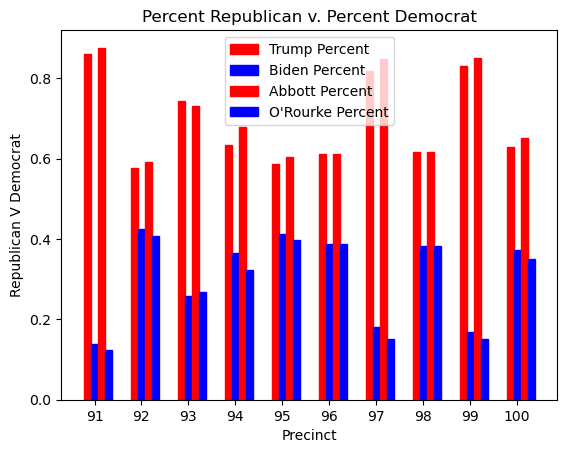

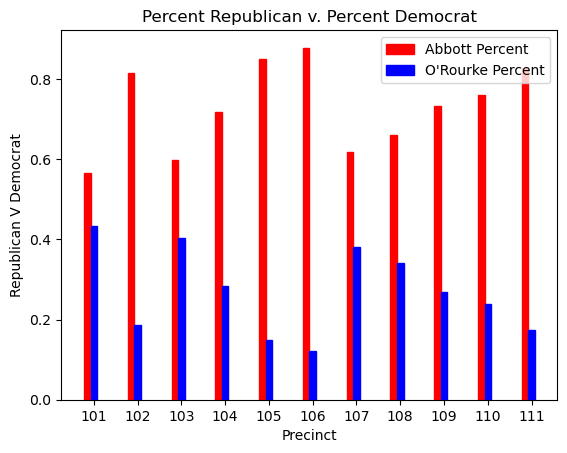

In [28]:

canvas_report_2020_president['perc trump'] = canvas_report_2020_president['REP\nDonald J. Trump / Michael R. Pence']/(canvas_report_2020_president['REP\nDonald J. Trump / Michael R. Pence'] + canvas_report_2020_president['DEM\nJoseph R. Biden\n/ Kamala D. Harris'])
canvas_report_2020_president['perc biden'] = 1-canvas_report_2020_president['perc trump']
#display(canvas_report_2020_president.head())

canvas_report_2022_governor['perc abbott'] = canvas_report_2022_governor['Greg Abbott, REP'] / (canvas_report_2022_governor['Greg Abbott, REP'] + canvas_report_2022_governor["Beto O'Rourke, DEM"])
canvas_report_2022_governor["perc o'rourke"] = 1-canvas_report_2022_governor['perc abbott']
#display(canvas_report_2022_governor.head())

r = np.arange(10)
labels = np.arange(10)+1
width = 0.15
for index in range(0, len(canvas_report_2020_president), 10):
    x_2020 = canvas_report_2020_president['perc trump'][index:index+10]
    y_2020 = canvas_report_2020_president['perc biden'][index:index+10]

    x_2022 = canvas_report_2022_governor['perc abbott'][index:index+10]
    y_2022 = canvas_report_2022_governor["perc o'rourke"][index:index+10]

    plt.xticks(r+width,labels+index)  

    plt.bar(r, x_2020, color = 'r', width = width, edgecolor = 'r', label='Trump Percent')
    plt.bar(r + width, y_2020, color = 'b', width = width, edgecolor = 'b', label='Biden Percent')
    plt.bar(r + 2*width, x_2022, color = 'r', width = width, edgecolor = 'r', label='Abbott Percent')
    plt.bar(r + 3*width, y_2022, color = 'b', width = width, edgecolor = 'b', label="O'Rourke Percent")
    
    plt.xlabel("Precinct")
    plt.ylabel("Republican V Democrat")
    plt.title("Percent Republican v. Percent Democrat")
  
    plt.legend()
    file_name = 'Percent Republican v. Percent Democrat per Year per Precinct' + str(index) + '.png'
    #plt.savefig(file_name)
    plt.show()

r = np.arange(11)
x_2022 = canvas_report_2022_governor['perc abbott'][100:111]
y_2022 = canvas_report_2022_governor["perc o'rourke"][100:111]

plt.xticks(r+width,r+index+11)  

plt.bar(r, x_2022, color = 'r', width = width, edgecolor = 'r', label='Abbott Percent')
plt.bar(r + width, y_2022, color = 'b', width = width, edgecolor = 'b', label="O'Rourke Percent")

plt.xlabel("Precinct")
plt.ylabel("Republican V Democrat")
plt.title("Percent Republican v. Percent Democrat")

plt.legend() 
#plt.savefig('Percent Republican v. Percent Democrat per Year per Precinct11.png')
plt.show()

,Precinct,Early Ballots Cast,Election Ballots Cast,Total Ballots Cast,Registered Voters,Percent Turnout,REP\nDonald J. Trump / Michael R. Pence,DEM\nJoseph R. Biden\n/ Kamala D. Harris,"LIB\nJo Jorgensen / Jeremy ""Spike"" Cohen",GRN\nHowie Hawkins / Angela Walker,...,Todd Cella / Tim Cella,Jesse Cuellar / Jimmy Monreal,Tom Hoefling / Andy Prior,Gloria La Riva / Leonard Peltier,Abram Loeb / Jennifer Jairala,Robert Morrow / Anne Beckett,Kasey Wells / Rachel Wells,Totals,perc trump,perc biden
0,1,2457,215,2672,2123,1.2586,1834,791,23,8,...,0,0,2,0,0,0,0,2660,0.698667,0.301333
1,2,1665,293,1958,2630,0.7445,1365,549,20,6,...,0,0,0,0,0,0,0,1940,0.713166,0.286834
2,3,4298,421,4719,6294,0.7498,2791,1832,49,12,...,0,0,0,0,0,0,0,4684,0.603721,0.396279
3,4,1200,179,1379,2062,0.6688,743,601,18,4,...,0,0,0,0,0,0,0,1368,0.552827,0.447173
4,5,135,113,248,303,0.8185,217,26,3,0,...,0,0,0,0,0,0,0,246,0.893004,0.106996


,Precinct,"Greg Abbott, REP","Beto O'Rourke, DEM","Mark Tippetts, LIB","Delilah Barrios, GRN",Jacqueline Abernathy (W),Mark V Goloby (W),Cast Votes,Undervotes,Overvotes,Early Voting Ballots Cast,Absentee Ballots Cast,Election Day Ballots Cast,Total Ballots Cast,Registered Voters,Turnout Percentage,perc abbott,perc o'rourke,Rep Change,Dem Change
0,1,680,366,7,2,0,0,1055,3,0,744,25,289,1058,2110,0.5014,0.650096,0.349904,-0.048571,0.048571
1,2,1008,388,13,1,1,1,1412,5,0,826,77,514,1417,2991,0.4738,0.722063,0.277937,0.008897,-0.008897
2,3,1556,725,23,5,0,0,2309,12,0,1574,83,664,2321,4280,0.5423,0.682157,0.317843,0.078436,-0.078436
3,4,506,408,20,2,0,0,936,6,0,559,69,314,942,1976,0.4767,0.553611,0.446389,0.000783,-0.000783
4,5,201,24,4,1,0,0,230,1,0,80,3,148,231,331,0.6979,0.893333,0.106667,0.000329,-0.000329


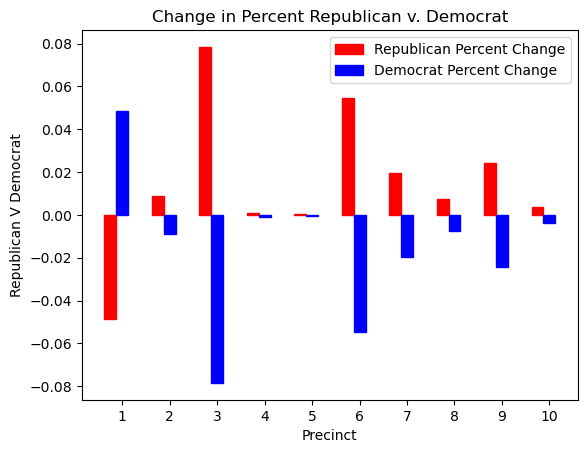

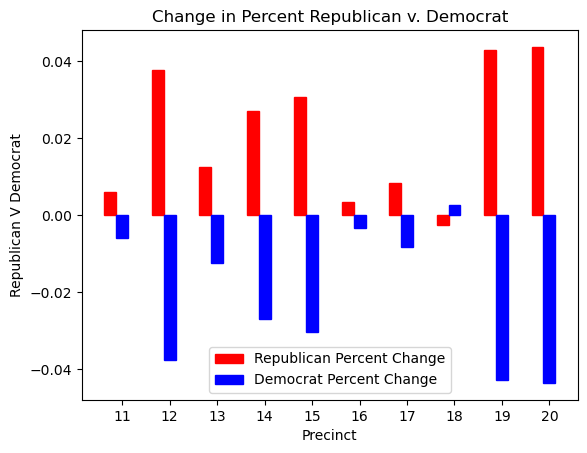

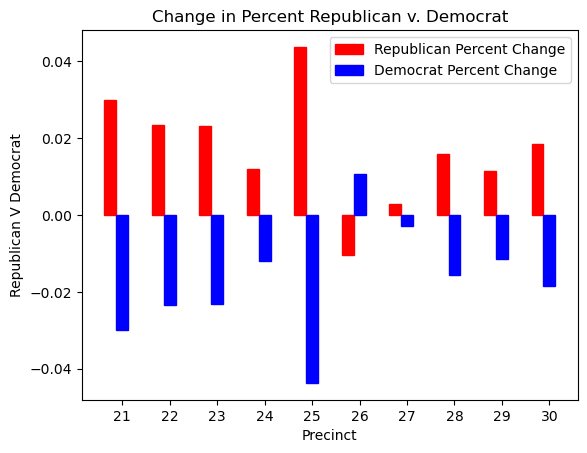

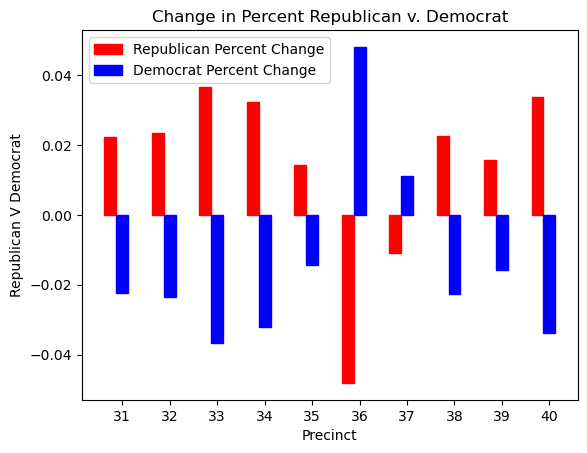

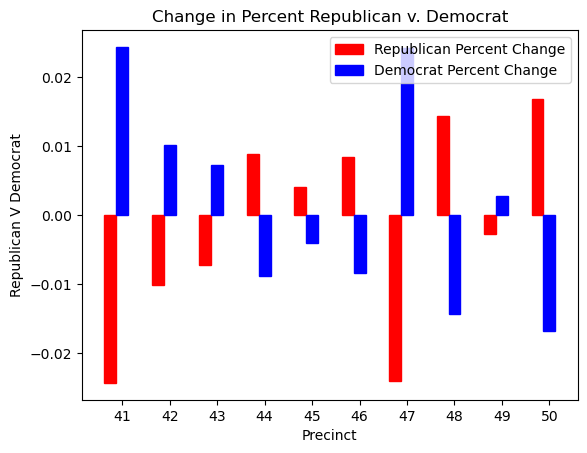

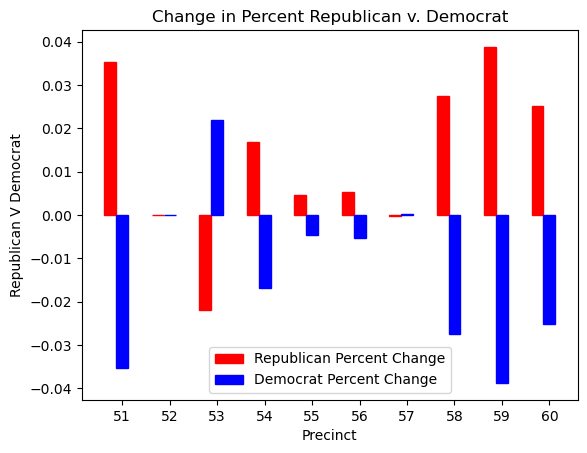

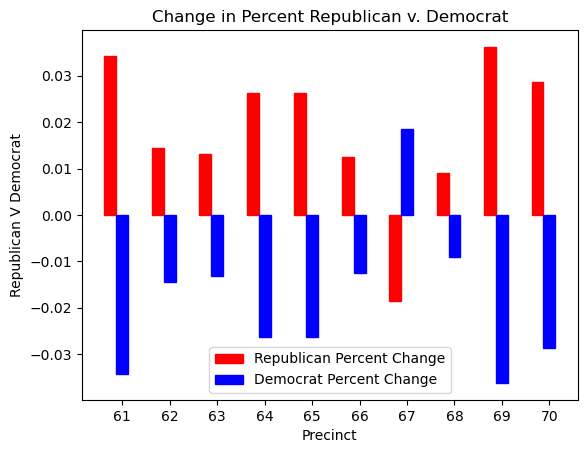

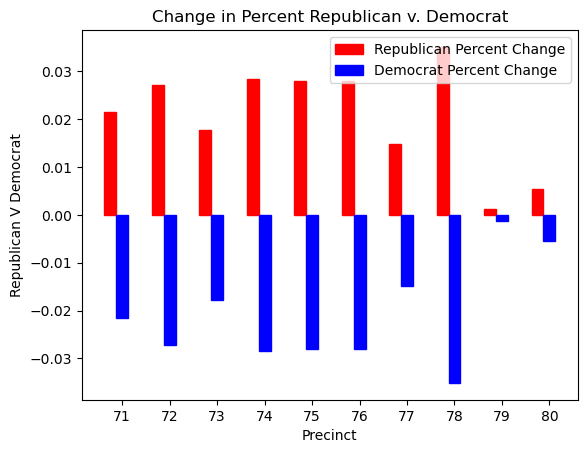

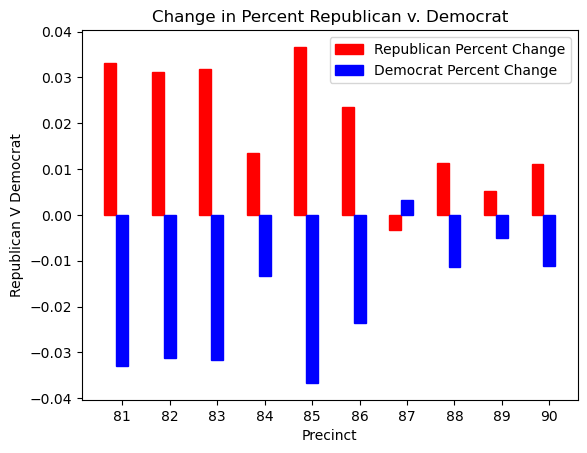

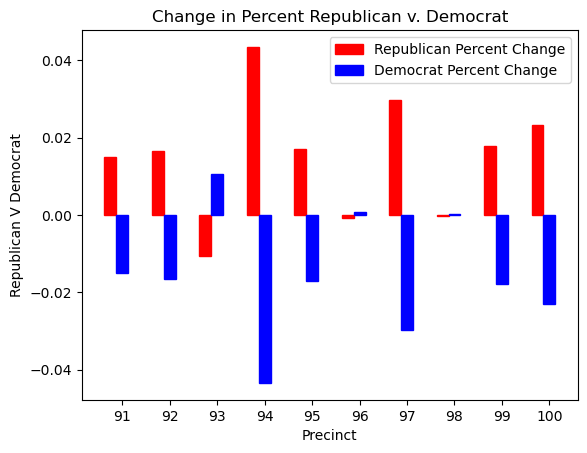

In [29]:


canvas_report_2022_governor['Rep Change'] = canvas_report_2022_governor['perc abbott'] - canvas_report_2020_president['perc trump']
canvas_report_2022_governor['Dem Change'] = canvas_report_2022_governor["perc o'rourke"] - canvas_report_2020_president['perc biden']

display(canvas_report_2020_president.head())
display(canvas_report_2022_governor.head())

r = np.arange(10)
labels = np.arange(10)+1
width = 0.25
for index in range(0, len(canvas_report_2020_president), 10):
    x_2022 = canvas_report_2022_governor['Rep Change'][index:index+10]
    y_2022 = canvas_report_2022_governor['Dem Change'][index:index+10]

    plt.xticks(r+width,labels+index)  

    plt.bar(r, x_2022, color = 'r', width = width, edgecolor = 'r', label='Republican Percent Change')
    plt.bar(r + width, y_2022, color = 'b', width = width, edgecolor = 'b', label='Democrat Percent Change')
    
    plt.xlabel("Precinct")
    plt.ylabel("Republican V Democrat")
    plt.title("Change in Percent Republican v. Democrat")
  
    plt.legend()
    file_name = 'Change in Percent Republican v. Percent Democrat' + str(index) + '.png'
    #plt.savefig(file_name)
    plt.show()


In [30]:
#display(canvas_report_2022_governor.head())

biggest_rep_change = canvas_report_2022_governor['Rep Change'].nlargest(n=10).index
biggest_dem_change = canvas_report_2022_governor['Dem Change'].nlargest(n=10).index

#display(canvas_report_2022_governor['Rep Change'].nlargest(n=10)*100)
#display(canvas_report_2022_governor['Dem Change'].nlargest(n=10)*100)

display(canvas_report_2022_governor.iloc[biggest_rep_change, :][['Precinct', 'Rep Change']]) 
display(canvas_report_2022_governor.iloc[biggest_dem_change, :][['Precinct', 'Dem Change']]) 


,Precinct,Rep Change
2,3,0.078436
5,6,0.054577
24,25,0.043684
19,20,0.043608
93,94,0.043423
18,19,0.042762
58,59,0.038770
11,12,0.037569
84,85,0.036672
32,33,0.036564


,Precinct,Dem Change
0,1,0.048571
35,36,0.048132
40,41,0.024334
46,47,0.024127
52,53,0.021831
66,67,0.018616
36,37,0.011016
92,93,0.010690
25,26,0.010535
41,42,0.010097


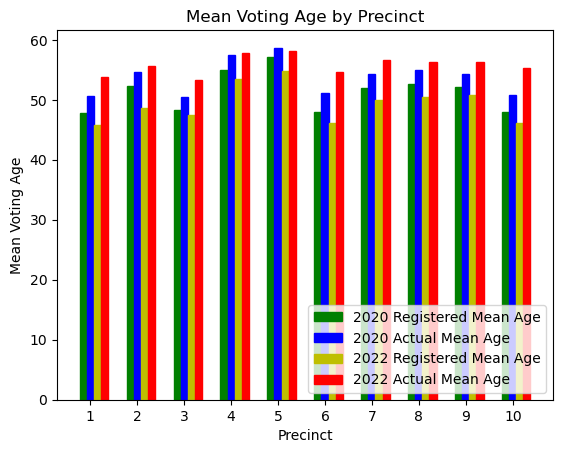

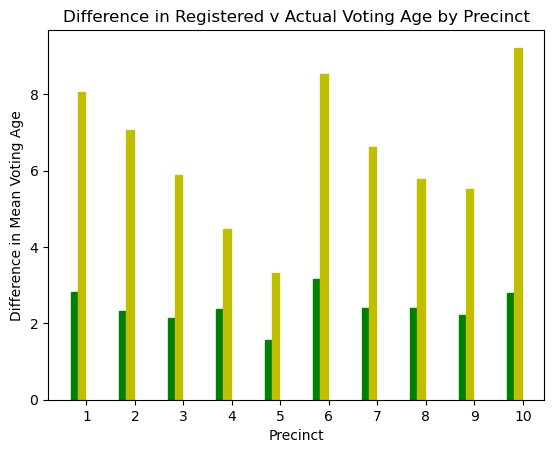

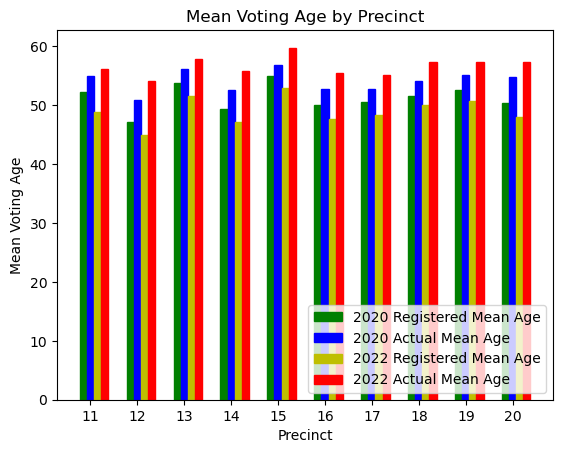

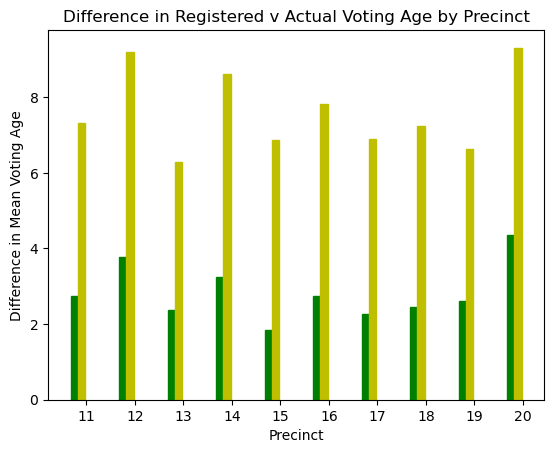

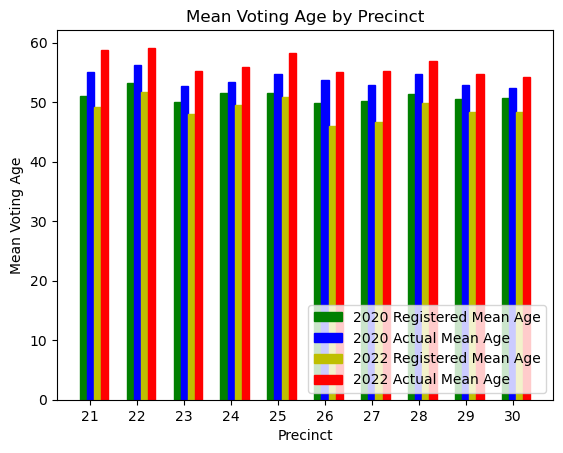

...

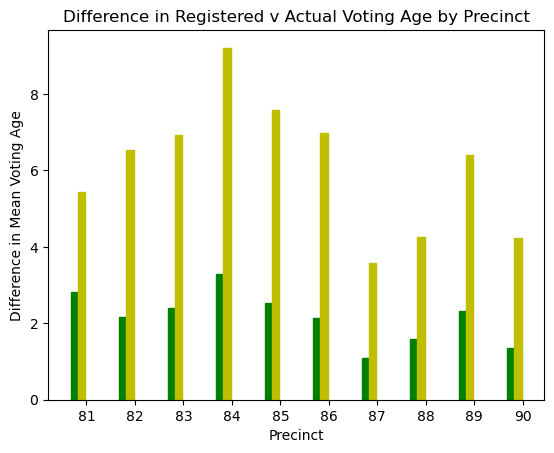

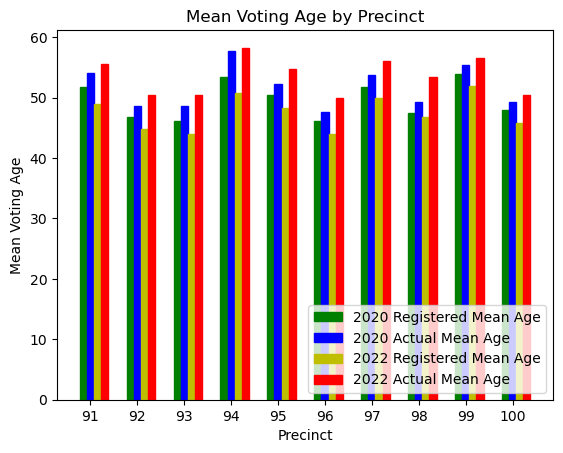

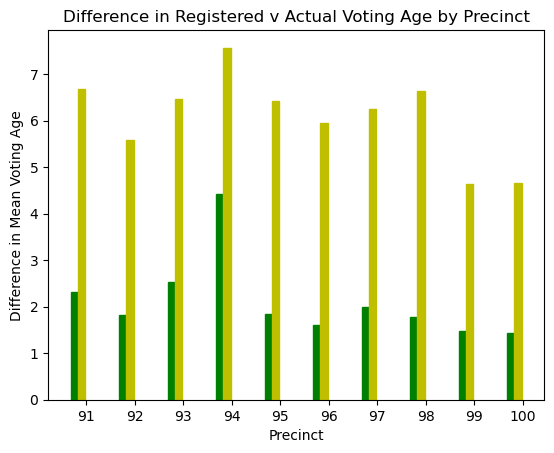

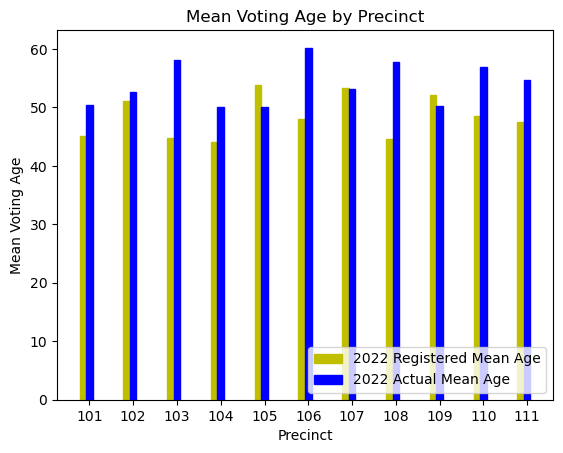

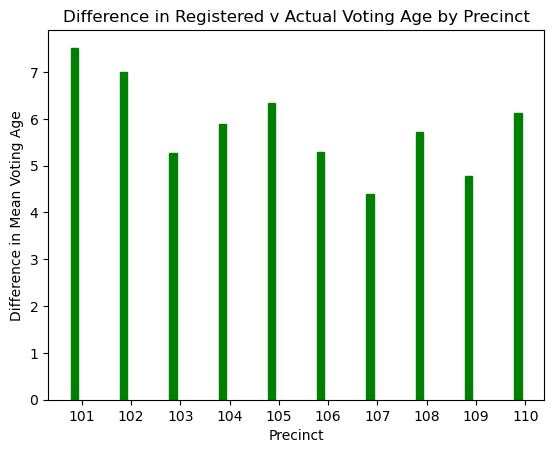

'2020 Difference in age between registered voters and actual voters ='

0    2.583996
dtype: float64

'2022 Difference in age between registered voters and actual voters ='

0    6.810551
dtype: float64

In [31]:
#display(reg_voters_2020.head())
#display(reg_voters_2022.head())

temp_voters_2020 = pd.merge(left=general_election_2020, right=reg_voters_2020, how='left', left_on='VUID', right_on='VUID')
#display(temp_voters_2020.head())

r = np.arange(10)
labels = np.arange(10)+1
width = 0.15


all_2020_mean_diff = pd.DataFrame()
all_2022_mean_diff = pd.DataFrame()
for index in range(0, len(canvas_report_2020_president), 10):
    plt.xlabel("Precinct")
    plt.ylabel("Mean Voting Age")
    plt.title("Mean Voting Age by Precinct")
    plt.xticks(r+width,labels+index)
    
    reg_voters_2020_mean_age = reg_voters_2020.groupby('Voting_Precinct')['Age'].mean()[index:index+10]
    act_voters_2020_mean_age = temp_voters_2020.groupby('Precinct')['Age'].mean()[index:index+10]
    reg_voters_2022_mean_age = reg_voters_2022.groupby('Voting_Precinct')['Age'].mean()[index:index+10]
    act_voters_2022_mean_age = temp_voters_2022.groupby('Precinct')['Age'].mean()[index:index+10]
    
    diff_2020_voter_mean_age = act_voters_2020_mean_age - reg_voters_2020_mean_age
    all_2020_mean_diff = pd.concat([all_2020_mean_diff, diff_2020_voter_mean_age], axis=0)
    diff_2022_voter_mean_age = act_voters_2022_mean_age - reg_voters_2022_mean_age
    all_2022_mean_diff = pd.concat([all_2022_mean_diff, diff_2022_voter_mean_age], axis=0)
    
    
    plt.bar(r, reg_voters_2020_mean_age, color = 'g', width = width, edgecolor = 'g', label='2020 Registered Mean Age')
    plt.bar(r+width, act_voters_2020_mean_age, color = 'b', width = width, edgecolor = 'b', label='2020 Actual Mean Age')
    plt.bar(r+2*width, reg_voters_2022_mean_age, color = 'y', width = width, edgecolor = 'y', label='2022 Registered Mean Age')
    plt.bar(r+3*width, act_voters_2022_mean_age, color = 'r', width = width, edgecolor = 'r', label='2022 Actual Mean Age')
    
    plt.legend(loc=4)
    file_name = 'Mean age by precinct' + str(index) + '.png'
    #plt.savefig(file_name)
    plt.show()

    plt.xlabel("Precinct")
    plt.ylabel("Difference in Mean Voting Age")
    plt.title("Difference in Registered v Actual Voting Age by Precinct")
    plt.xticks(r+width+.1,labels+index)
    plt.bar(r, diff_2020_voter_mean_age, color = 'g', width = width, edgecolor = 'g', label='2020 Registered v Actual Age Difference')
    plt.bar(r+width, diff_2022_voter_mean_age, color = 'y', width = width, edgecolor = 'y', label='2022 Registered v Actual Age Difference')
    plt.show()
    
r = np.arange(11)
reg_voters_2022_mean_age = reg_voters_2022.groupby('Voting_Precinct')['Age'].mean()[100:111]
act_voters_2022_mean_age = temp_voters_2022.groupby('Voting_Precinct')['Age'].mean()[100:110]
diff_2022_voter_mean_age = act_voters_2022_mean_age - reg_voters_2022_mean_age
all_2022_mean_diff = pd.concat([all_2022_mean_diff, diff_2022_voter_mean_age], axis=0)


plt.bar(r, reg_voters_2022_mean_age, color = 'y', width = width, edgecolor = 'y', label='2022 Registered Mean Age')
plt.bar(r+width, act_voters_2022_mean_age, color = 'b', width = width, edgecolor = 'b', label='2022 Actual Mean Age')

plt.xlabel("Precinct")
plt.ylabel("Mean Voting Age")
plt.title("Mean Voting Age by Precinct")
plt.xticks(r+width,r+index+11)

plt.legend(loc=4) 
#plt.savefig('Mean age by precinct110.png')
plt.show()


r = np.arange(12)-1
plt.xlabel("Precinct")
plt.ylabel("Difference in Mean Voting Age")
plt.title("Difference in Registered v Actual Voting Age by Precinct")
plt.xticks(r+width,r+index+11)
plt.bar(r, diff_2022_voter_mean_age, color = 'g', width = width, edgecolor = 'g', label='2022 Registered v Actual Age Difference')
plt.show()


display('2020 Difference in age between registered voters and actual voters =', all_2020_mean_diff.mean())
display('2022 Difference in age between registered voters and actual voters =', all_2022_mean_diff.mean())



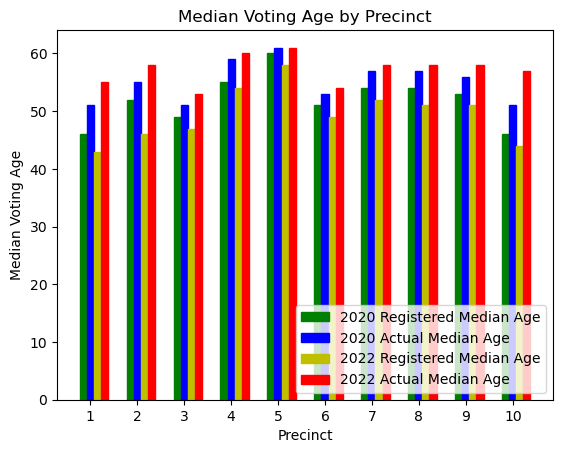

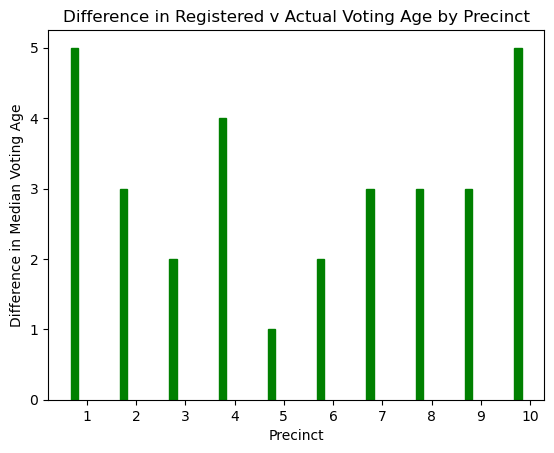

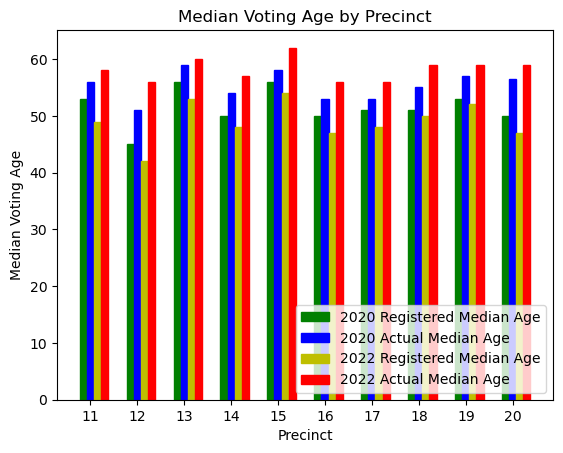

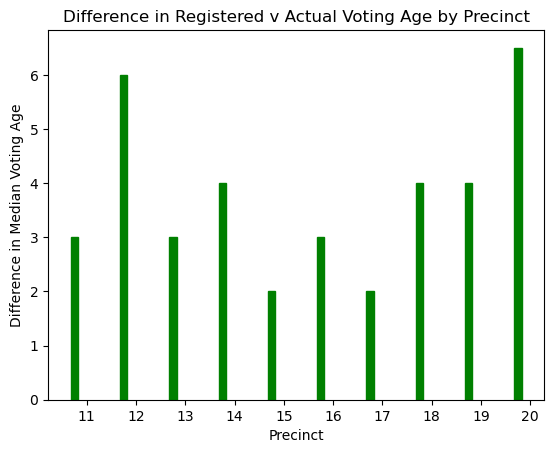

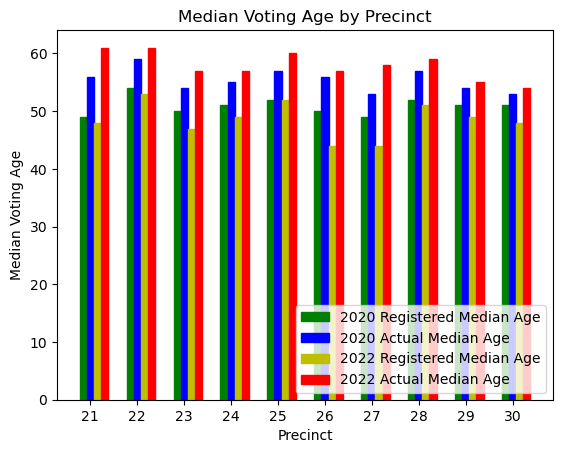

...

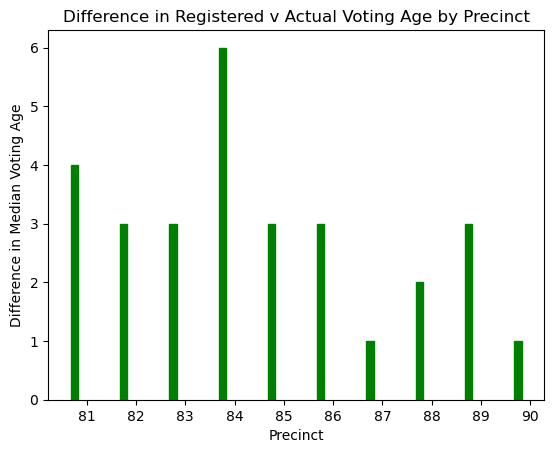

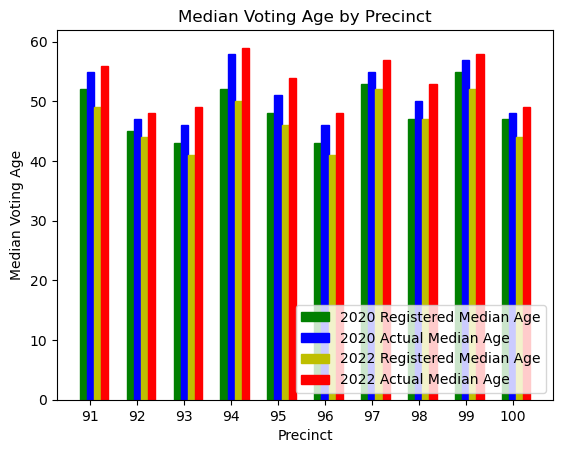

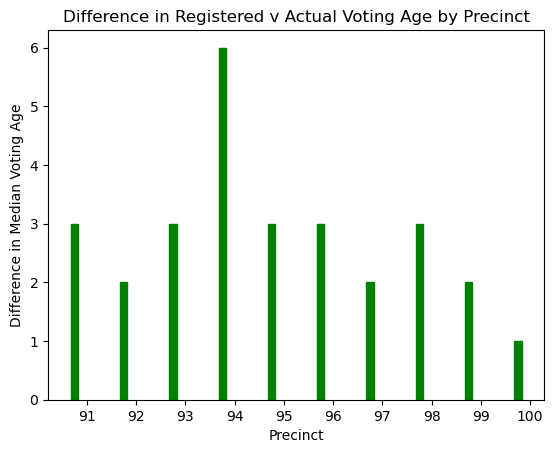

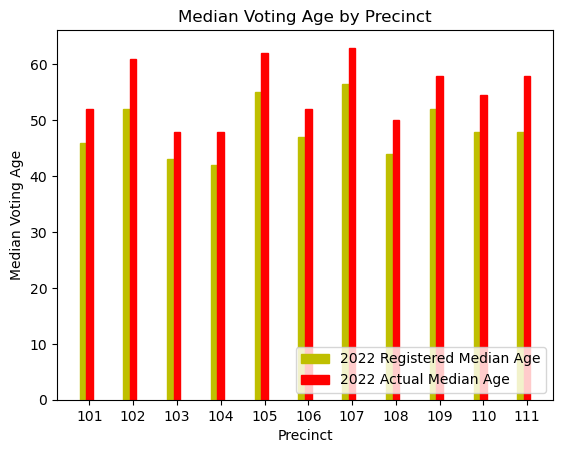

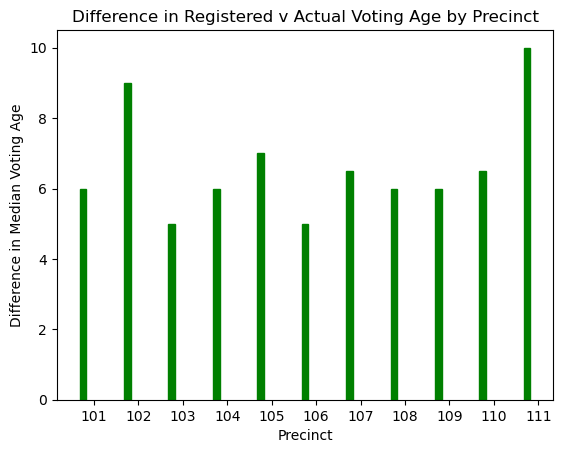

'2020 Difference in age between registered voters and actual voters ='

0    3.395
dtype: float64

'2022 Difference in age between registered voters and actual voters ='

0    8.018018
dtype: float64

In [32]:
#display(reg_voters_2020.head())
#display(reg_voters_2022.head())

temp_voters_2020 = pd.merge(left=general_election_2020, right=reg_voters_2020, how='left', left_on='VUID', right_on='VUID')
#display(temp_voters_2020.head())

r = np.arange(10)
labels = np.arange(10)+1
width = 0.15


all_2020_median_diff = pd.DataFrame()
all_2022_median_diff = pd.DataFrame()
for index in range(0, len(canvas_report_2020_president), 10):
    plt.xlabel("Precinct")
    plt.ylabel("Median Voting Age")
    plt.title("Median Voting Age by Precinct")
    plt.xticks(r+width,labels+index)
    
    reg_voters_2020_mean_age = reg_voters_2020.groupby('Voting_Precinct')['Age'].median()[index:index+10]
    act_voters_2020_mean_age = temp_voters_2020.groupby('Precinct')['Age'].median()[index:index+10]
    reg_voters_2022_mean_age = reg_voters_2022.groupby('Voting_Precinct')['Age'].median()[index:index+10]
    act_voters_2022_mean_age = temp_voters_2022.groupby('Precinct')['Age'].median()[index:index+10]
    
    diff_2020_voter_median_age = act_voters_2020_mean_age - reg_voters_2020_mean_age
    all_2020_median_diff = pd.concat([all_2020_median_diff, diff_2020_voter_median_age], axis=0)
    diff_2022_voter_median_age = act_voters_2022_mean_age - reg_voters_2022_mean_age
    all_2022_median_diff = pd.concat([all_2022_median_diff, diff_2022_voter_median_age], axis=0)
    
    
    plt.bar(r, reg_voters_2020_mean_age, color = 'g', width = width, edgecolor = 'g', label='2020 Registered Median Age')
    plt.bar(r+width, act_voters_2020_mean_age, color = 'b', width = width, edgecolor = 'b', label='2020 Actual Median Age')
    plt.bar(r+2*width, reg_voters_2022_mean_age, color = 'y', width = width, edgecolor = 'y', label='2022 Registered Median Age')
    plt.bar(r+3*width, act_voters_2022_mean_age, color = 'r', width = width, edgecolor = 'r', label='2022 Actual Median Age')
    plt.legend(loc=4)
    file_name = 'Median age by precinct' + str(index) + '.png'
    #plt.savefig(file_name)
    plt.show()

    plt.xlabel("Precinct")
    plt.ylabel("Difference in Median Voting Age")
    plt.title("Difference in Registered v Actual Voting Age by Precinct")
    plt.xticks(r+width+.1,labels+index)
    plt.bar(r, diff_2020_voter_median_age, color = 'g', width = width, edgecolor = 'g', label='2020 Registered v Actual Age Difference')
    plt.show()

r = np.arange(11)
reg_voters_2022_mean_age = reg_voters_2022.groupby('Voting_Precinct')['Age'].median()[100:111]
act_voters_2022_mean_age = temp_voters_2022.groupby('Precinct')['Age'].median()[100:111]

diff_2022_voter_median_age = act_voters_2022_mean_age - reg_voters_2022_mean_age
all_2022_median_diff = pd.concat([all_2022_median_diff, diff_2022_voter_median_age], axis=0)
    
plt.bar(r, reg_voters_2022_mean_age, color = 'y', width = width, edgecolor = 'y', label='2022 Registered Median Age')
plt.bar(r+width, act_voters_2022_mean_age, color = 'r', width = width, edgecolor = 'r', label='2022 Actual Median Age')
#plt.bar(r + width, y_2022, color = 'b', width = width, edgecolor = 'b', label="O'Rourke Percent")

plt.xlabel("Precinct")
plt.ylabel("Median Voting Age")
plt.title("Median Voting Age by Precinct")
plt.xticks(r+width,r+index+11)

plt.legend(loc=4) 
#plt.savefig('Median age by precinct110.png')
plt.show() 


r = np.arange(11)
plt.xlabel("Precinct")
plt.ylabel("Difference in Median Voting Age")
plt.title("Difference in Registered v Actual Voting Age by Precinct")
plt.xticks(r+width+.1, r+index+11)
plt.bar(r, diff_2022_voter_median_age, color = 'g', width = width, edgecolor = 'g', label='2022 Registered v Actual Age Difference')
plt.show()


display('2020 Difference in age between registered voters and actual voters =', all_2020_median_diff.mean())
display('2022 Difference in age between registered voters and actual voters =', all_2022_median_diff.mean())

In [33]:
#display(all_2020_mean_diff.head())

biggest_age_change = all_2020_mean_diff[0].nlargest(n=10).index
smallest_age_change = all_2020_mean_diff[0].nsmallest(n=10).index

display(all_2020_mean_diff[0].nlargest(n=10))
display(biggest_age_change)

display(all_2020_mean_diff[0].nsmallest(n=10))
display(smallest_age_change)


biggest_age_change = all_2020_median_diff[0].nlargest(n=10).index
smallest_age_change = all_2020_median_diff[0].nsmallest(n=10).index

display(all_2020_median_diff[0].nlargest(n=10))
display(biggest_age_change)

display(all_2020_median_diff[0].nsmallest(n=10))
display(smallest_age_change)

51    5.142013
75    4.722960
94    4.417388
20    4.346052
44    4.144625
21    4.002730
26    3.982520
52    3.892127
12    3.786293
35    3.632945
Name: 0, dtype: float64

Int64Index([51, 75, 94, 20, 44, 21, 26, 52, 12, 35], dtype='int64')

46     0.976065
87     1.095950
90     1.361005
100    1.426278
99     1.468445
5      1.555672
88     1.596583
96     1.610631
30     1.630958
43     1.714084
Name: 0, dtype: float64

Int64Index([46, 87, 90, 100, 99, 5, 88, 96, 30, 43], dtype='int64')

75    9.0
51    8.0
21    7.0
44    7.0
20    6.5
12    6.0
26    6.0
32    6.0
52    6.0
84    6.0
Name: 0, dtype: float64

Int64Index([75, 51, 21, 44, 20, 12, 26, 32, 52, 84], dtype='int64')

5      1.0
46     1.0
71     1.0
72     1.0
87     1.0
90     1.0
100    1.0
3      2.0
6      2.0
15     2.0
Name: 0, dtype: float64

Int64Index([5, 46, 71, 72, 87, 90, 100, 3, 6, 15], dtype='int64')

In [34]:
biggest_age_change = all_2022_mean_diff[0].nlargest(n=10).index
smallest_age_change = all_2022_mean_diff[0].nsmallest(n=10).index

display(all_2022_mean_diff[0].nlargest(n=10))
display(biggest_age_change)

display(all_2022_mean_diff[0].nsmallest(n=10))
display(smallest_age_change)


biggest_age_change = all_2022_median_diff[0].nlargest(n=10).index
smallest_age_change = all_2022_median_diff[0].nsmallest(n=10).index

display(all_2022_median_diff[0].nlargest(n=10))
display(biggest_age_change)

display(all_2022_median_diff[0].nsmallest(n=10))
display(smallest_age_change)

54.0    10.559165
52.0     9.909452
51.0     9.692271
75.0     9.649532
64.0     9.497426
21.0     9.446675
44.0     9.408506
20.0     9.307639
10.0     9.217893
84.0     9.208530
Name: 0, dtype: float64

Float64Index([54.0, 52.0, 51.0, 75.0, 64.0, 21.0, 44.0, 20.0, 10.0, 84.0], dtype='float64')

5.0      3.309996
87.0     3.566229
46.0     4.082471
90.0     4.231480
88.0     4.263453
107.0    4.387363
4.0      4.460646
48.0     4.497040
99.0     4.633245
100.0    4.659777
Name: 0, dtype: float64

Float64Index([5.0, 87.0, 46.0, 90.0, 88.0, 107.0, 4.0, 48.0, 99.0, 100.0], dtype='float64')

51    15.0
12    14.0
27    14.0
44    14.0
75    14.0
10    13.0
21    13.0
26    13.0
52    13.0
54    13.0
Name: 0, dtype: float64

Int64Index([51, 12, 27, 44, 75, 10, 21, 26, 52, 54], dtype='int64')

5     3.0
72    3.0
87    3.0
88    4.0
92    4.0
6     5.0
46    5.0
48    5.0
50    5.0
57    5.0
Name: 0, dtype: float64

Int64Index([5, 72, 87, 88, 92, 6, 46, 48, 50, 57], dtype='int64')

In [35]:
reg_voters_2020_copy = reg_voters_2020.copy()
reg_voters_2022_copy = reg_voters_2022.copy()

#display(reg_voters_2020_copy.head())
#display(reg_voters_2022_copy.head())

#display(general_election_2020.head())
#display(general_election_2022.head())

reg_voters_2020_copy = census_ln(reg_voters_2020_copy, 'LastName')
reg_voters_2020_copy = census_ln(reg_voters_2020_copy, 'FirstName')
reg_voters_2020_copy = census_ln(reg_voters_2020_copy, 'Middle_Name')

reg_voters_2022_copy = census_ln(reg_voters_2022_copy, 'LastName')
reg_voters_2022_copy = census_ln(reg_voters_2022_copy, 'FirstName')
reg_voters_2022_copy = census_ln(reg_voters_2022_copy, 'Middle_Name')


reg_voters_2020_copy = reg_voters_2020_copy.replace(to_replace = '(S)',value = 0)
reg_voters_2020_copy = reg_voters_2020_copy.fillna(0)
reg_voters_2020_copy['pctwhite_x'] = reg_voters_2020_copy['pctwhite_x'].astype(float)
reg_voters_2020_copy['pctwhite_y'] = reg_voters_2020_copy['pctwhite_y'].astype(float)
reg_voters_2020_copy['pctwhite'] = reg_voters_2020_copy['pctwhite'].astype(float)
reg_voters_2020_copy['pctblack_x'] = reg_voters_2020_copy['pctblack_x'].astype(float)
reg_voters_2020_copy['pctblack_y'] = reg_voters_2020_copy['pctblack_y'].astype(float)
reg_voters_2020_copy['pctblack'] = reg_voters_2020_copy['pctblack'].astype(float)
reg_voters_2020_copy['pctapi_x'] = reg_voters_2020_copy['pctapi_x'].astype(float)
reg_voters_2020_copy['pctapi_y'] = reg_voters_2020_copy['pctapi_y'].astype(float)
reg_voters_2020_copy['pctapi'] = reg_voters_2020_copy['pctapi'].astype(float)
reg_voters_2020_copy['pctaian_x'] = reg_voters_2020_copy['pctaian_x'].astype(float)
reg_voters_2020_copy['pctaian_y'] = reg_voters_2020_copy['pctaian_y'].astype(float)
reg_voters_2020_copy['pctaian'] = reg_voters_2020_copy['pctaian'].astype(float)
reg_voters_2020_copy['pct2prace_x'] = reg_voters_2020_copy['pct2prace_x'].astype(float)
reg_voters_2020_copy['pct2prace_y'] = reg_voters_2020_copy['pct2prace_y'].astype(float)
reg_voters_2020_copy['pct2prace'] = reg_voters_2020_copy['pct2prace'].astype(float)
reg_voters_2020_copy['pcthispanic_x'] = reg_voters_2020_copy['pcthispanic_x'].astype(float)
reg_voters_2020_copy['pcthispanic_y'] = reg_voters_2020_copy['pcthispanic_y'].astype(float)
reg_voters_2020_copy['pcthispanic'] = reg_voters_2020_copy['pcthispanic'].astype(float)

reg_voters_2020_copy['avgwhite'] = reg_voters_2020_copy[['pctwhite_x', 'pctwhite_y', 'pctwhite']].mean(axis=1)
reg_voters_2020_copy['avgblack'] = reg_voters_2020_copy[['pctblack_x', 'pctblack_y', 'pctblack']].mean(axis=1)
reg_voters_2020_copy['avgapi'] = reg_voters_2020_copy[['pctapi_x', 'pctapi_y', 'pctapi']].mean(axis=1)
reg_voters_2020_copy['avgaian'] = reg_voters_2020_copy[['pctaian_x', 'pctaian_y', 'pctaian']].mean(axis=1)
reg_voters_2020_copy['avg2prace'] = reg_voters_2020_copy[['pct2prace_x', 'pct2prace_y', 'pct2prace']].mean(axis=1)
reg_voters_2020_copy['avghispanic'] = reg_voters_2020_copy[['pcthispanic_x', 'pcthispanic_y', 'pcthispanic']].mean(axis=1)

del reg_voters_2020_copy['pctwhite_x'] 
del reg_voters_2020_copy['pctwhite_y'] 
del reg_voters_2020_copy['pctwhite'] 
del reg_voters_2020_copy['pctblack_x'] 
del reg_voters_2020_copy['pctblack_y'] 
del reg_voters_2020_copy['pctblack'] 
del reg_voters_2020_copy['pctapi_x'] 
del reg_voters_2020_copy['pctapi_y'] 
del reg_voters_2020_copy['pctapi'] 
del reg_voters_2020_copy['pctaian_x'] 
del reg_voters_2020_copy['pctaian_y'] 
del reg_voters_2020_copy['pctaian'] 
del reg_voters_2020_copy['pct2prace_x'] 
del reg_voters_2020_copy['pct2prace_y'] 
del reg_voters_2020_copy['pct2prace'] 
del reg_voters_2020_copy['pcthispanic_x'] 
del reg_voters_2020_copy['pcthispanic_y'] 
del reg_voters_2020_copy['pcthispanic']
del reg_voters_2020_copy['avgapi']
del reg_voters_2020_copy['avg2prace']

reg_voters_2020_copy[['avgwhite', 'avgblack', 'avgaian', 'avghispanic']] = reg_voters_2020_copy[['avgwhite', 'avgblack', 'avgaian', 'avghispanic']].div(reg_voters_2020_copy[['avgwhite', 'avgblack', 'avgaian', 'avghispanic']].sum(axis=1), axis=0)


reg_voters_2022_copy = reg_voters_2022_copy.replace(to_replace = '(S)',value = 0)
reg_voters_2022_copy = reg_voters_2022_copy.fillna(0)
reg_voters_2022_copy['pctwhite_x'] = reg_voters_2022_copy['pctwhite_x'].astype(float)
reg_voters_2022_copy['pctwhite_y'] = reg_voters_2022_copy['pctwhite_y'].astype(float)
reg_voters_2022_copy['pctwhite'] = reg_voters_2022_copy['pctwhite'].astype(float)
reg_voters_2022_copy['pctblack_x'] = reg_voters_2022_copy['pctblack_x'].astype(float)
reg_voters_2022_copy['pctblack_y'] = reg_voters_2022_copy['pctblack_y'].astype(float)
reg_voters_2022_copy['pctblack'] = reg_voters_2022_copy['pctblack'].astype(float)
reg_voters_2022_copy['pctapi_x'] = reg_voters_2022_copy['pctapi_x'].astype(float)
reg_voters_2022_copy['pctapi_y'] = reg_voters_2022_copy['pctapi_y'].astype(float)
reg_voters_2022_copy['pctapi'] = reg_voters_2022_copy['pctapi'].astype(float)
reg_voters_2022_copy['pctaian_x'] = reg_voters_2022_copy['pctaian_x'].astype(float)
reg_voters_2022_copy['pctaian_y'] = reg_voters_2022_copy['pctaian_y'].astype(float)
reg_voters_2022_copy['pctaian'] = reg_voters_2022_copy['pctaian'].astype(float)
reg_voters_2022_copy['pct2prace_x'] = reg_voters_2022_copy['pct2prace_x'].astype(float)
reg_voters_2022_copy['pct2prace_y'] = reg_voters_2022_copy['pct2prace_y'].astype(float)
reg_voters_2022_copy['pct2prace'] = reg_voters_2022_copy['pct2prace'].astype(float)
reg_voters_2022_copy['pcthispanic_x'] = reg_voters_2022_copy['pcthispanic_x'].astype(float)
reg_voters_2022_copy['pcthispanic_y'] = reg_voters_2022_copy['pcthispanic_y'].astype(float)
reg_voters_2022_copy['pcthispanic'] = reg_voters_2022_copy['pcthispanic'].astype(float)

reg_voters_2022_copy['avgwhite'] = reg_voters_2022_copy[['pctwhite_x', 'pctwhite_y', 'pctwhite']].mean(axis=1)
reg_voters_2022_copy['avgblack'] = reg_voters_2022_copy[['pctblack_x', 'pctblack_y', 'pctblack']].mean(axis=1)
reg_voters_2022_copy['avgapi'] = reg_voters_2022_copy[['pctapi_x', 'pctapi_y', 'pctapi']].mean(axis=1)
reg_voters_2022_copy['avgaian'] = reg_voters_2022_copy[['pctaian_x', 'pctaian_y', 'pctaian']].mean(axis=1)
reg_voters_2022_copy['avg2prace'] = reg_voters_2022_copy[['pct2prace_x', 'pct2prace_y', 'pct2prace']].mean(axis=1)
reg_voters_2022_copy['avghispanic'] = reg_voters_2022_copy[['pcthispanic_x', 'pcthispanic_y', 'pcthispanic']].mean(axis=1)

del reg_voters_2022_copy['pctwhite_x'] 
del reg_voters_2022_copy['pctwhite_y'] 
del reg_voters_2022_copy['pctwhite'] 
del reg_voters_2022_copy['pctblack_x'] 
del reg_voters_2022_copy['pctblack_y'] 
del reg_voters_2022_copy['pctblack'] 
del reg_voters_2022_copy['pctapi_x'] 
del reg_voters_2022_copy['pctapi_y'] 
del reg_voters_2022_copy['pctapi'] 
del reg_voters_2022_copy['pctaian_x'] 
del reg_voters_2022_copy['pctaian_y'] 
del reg_voters_2022_copy['pctaian'] 
del reg_voters_2022_copy['pct2prace_x'] 
del reg_voters_2022_copy['pct2prace_y'] 
del reg_voters_2022_copy['pct2prace'] 
del reg_voters_2022_copy['pcthispanic_x'] 
del reg_voters_2022_copy['pcthispanic_y'] 
del reg_voters_2022_copy['pcthispanic']
del reg_voters_2022_copy['avgapi']
del reg_voters_2022_copy['avg2prace']

reg_voters_2022_copy[['avgwhite', 'avgblack', 'avgaian', 'avghispanic']] = reg_voters_2022_copy[['avgwhite', 'avgblack', 'avgaian', 'avghispanic']].div(reg_voters_2022_copy[['avgwhite', 'avgblack', 'avgaian', 'avghispanic']].sum(axis=1), axis=0)


display(reg_voters_2020_copy.head())
display(reg_voters_2022_copy.head())


,VUID,LastName,FirstName,Middle_Name,House_Number,Residence_Street,Residence_City,Residence_State,Residence_ZipCode,Sex,Voting_Precinct,BirthDate,Congressional_District,Age,avgwhite,avgblack,avgaian,avghispanic
0,2137050070,HUSKEY,MCKENZIE,LEE,41902.0,FM 1774,MAGNOLIA,TX,77354,M,91,12/24/1998,8.0,24,0.767628,0.200564,0.013671,0.018137
1,1205301627,AAB,LAMTIUR,TOBING,6.0,WATERTREE DR,THE WOODLANDS,TX,77380,F,45,02/12/1957,8.0,65,1.000000,0.000000,0.000000,0.000000
2,1217295870,AAB,LAURA,LEIGH,6.0,WATERTREE DR,THE WOODLANDS,TX,77380,F,45,01/06/1997,8.0,26,0.846343,0.070260,0.001698,0.081698
3,1166720378,AAB,RANDOLPH,JAMES,6.0,WATERTREE DR,THE WOODLANDS,TX,77380,M,45,01/25/1956,8.0,67,0.717573,0.259627,0.011022,0.011779
4,1126164519,AALUND,MARGARET,MACHELL,22885.0,FRASER DR,PORTER,TX,77365,F,14,11/04/1951,8.0,71,0.912198,0.060137,0.000000,0.027665


,VUID,LastName,FirstName,Middle_Name,House_Number,Residence_Street,Residence_City,Residence_State,Residence_ZipCode,Sex,Voting_Precinct,BirthDate,Congressional_District,Age,avgwhite,avgblack,avgaian,avghispanic
0,2176069448,BOUTTE,JONATHAN,ALLEN,138.0,SPRING PINES DR,SPRING,TX,77386,M,35,01/15/1988,2,35,0.580053,0.340552,0.037397,0.041998
1,2157648312,HELMBRECHT,AMBER,NICOLE,18695.0,PINE SHADOWS CIR,CONROE,TX,77302,F,26,11/03/1998,2,24,0.876835,0.068698,0.007722,0.046745
2,2169781628,AAB,ADAM,GERDASH,6.0,WATERTREE DR,THE WOODLANDS,TX,77380,M,45,10/02/1995,2,27,0.918262,0.056017,0.002262,0.023459
3,1205301627,AAB,LAMTIUR,TOBING,6.0,WATERTREE DR,THE WOODLANDS,TX,77380,F,45,02/12/1957,2,65,1.000000,0.000000,0.000000,0.000000
4,1217295870,AAB,LAURA,LEIGH,6.0,WATERTREE DR,THE WOODLANDS,TX,77380,F,45,01/06/1997,2,26,0.846343,0.070260,0.001698,0.081698


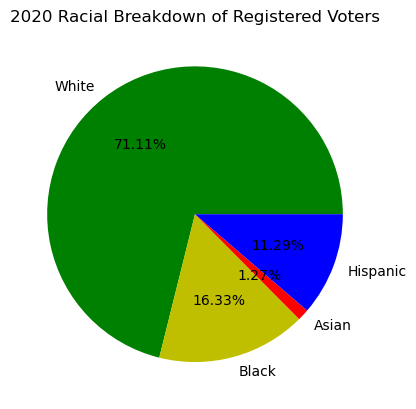

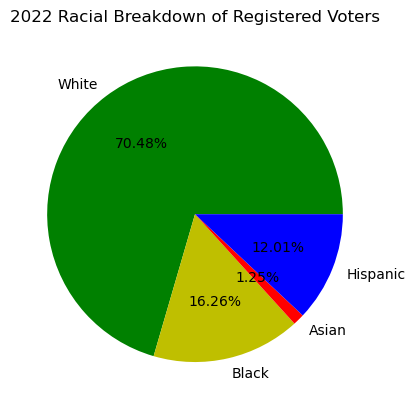

In [36]:

plt.title('2020 Racial Breakdown of Registered Voters')
mylabels = ['White', 'Black', 'Asian', 'Hispanic']
mycolors = ['g', 'y', 'r', 'b']
autopct = '%1.2f%%'
y = [reg_voters_2020_copy['avgwhite'].mean(), reg_voters_2020_copy['avgblack'].mean(), 
     reg_voters_2020_copy['avgaian'].mean(), reg_voters_2020_copy['avghispanic'].mean()]

plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2020 Racial Breakdown of Registered Voters.png')
plt.show()




plt.title('2022 Racial Breakdown of Registered Voters')
mylabels = ['White', 'Black', 'Asian', 'Hispanic']
mycolors = ['g', 'y', 'r', 'b']
autopct = '%1.2f%%'
y = [reg_voters_2022_copy['avgwhite'].mean(), reg_voters_2022_copy['avgblack'].mean(), 
     reg_voters_2022_copy['avgaian'].mean(), reg_voters_2022_copy['avghispanic'].mean()]

plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2022 Racial Breakdown of Registered Voters.png')
plt.show()


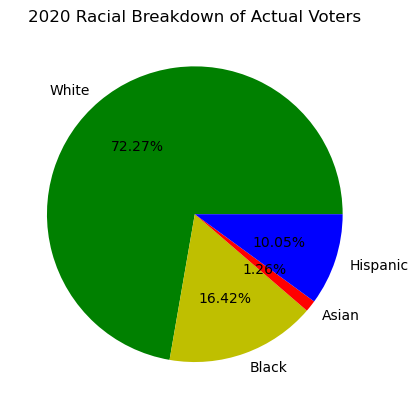

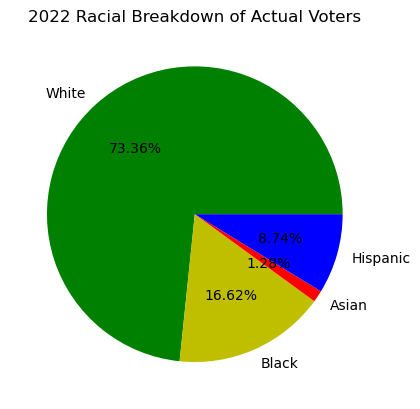

In [37]:
#display(general_election_2020.head())
#display(general_election_2022.head())
temp_voters_2020 = pd.merge(left=general_election_2020, right=reg_voters_2020_copy, how='left', left_on='VUID', right_on='VUID')
temp_voters_2022 = pd.merge(left=general_election_2022, right=reg_voters_2022_copy, how='left', left_on='VUID', right_on='VUID')

#display(temp_voters_2020.head())
#display(temp_voters_2022.head())


plt.title('2020 Racial Breakdown of Actual Voters')
mylabels = ['White', 'Black', 'Asian', 'Hispanic']
mycolors = ['g', 'y', 'r', 'b']
autopct = '%1.2f%%'
y = [temp_voters_2020['avgwhite'].mean(), temp_voters_2020['avgblack'].mean(), 
     temp_voters_2020['avgaian'].mean(), temp_voters_2020['avghispanic'].mean()]

plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2020 Racial Breakdown of Actual Voters.png')
plt.show()


plt.title('2022 Racial Breakdown of Actual Voters')
mylabels = ['White', 'Black', 'Asian', 'Hispanic']
mycolors = ['g', 'y', 'r', 'b']
autopct = '%1.2f%%'
y = [temp_voters_2022['avgwhite'].mean(), temp_voters_2022['avgblack'].mean(), 
     temp_voters_2022['avgaian'].mean(), temp_voters_2022['avghispanic'].mean()]

plt.pie(y, labels = mylabels, colors = mycolors, autopct = autopct)
#plt.savefig('2022 Racial Breakdown of Actual Voters.png')
plt.show()

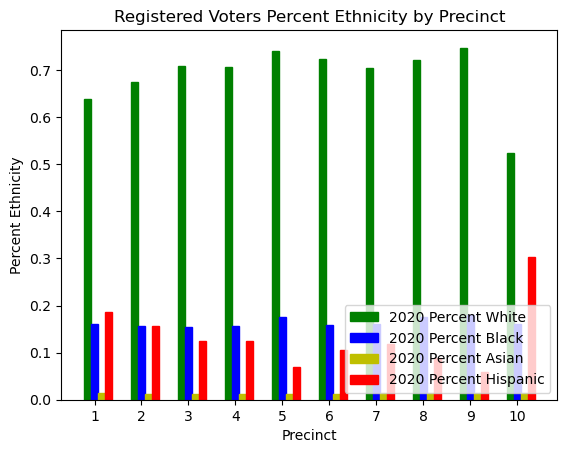

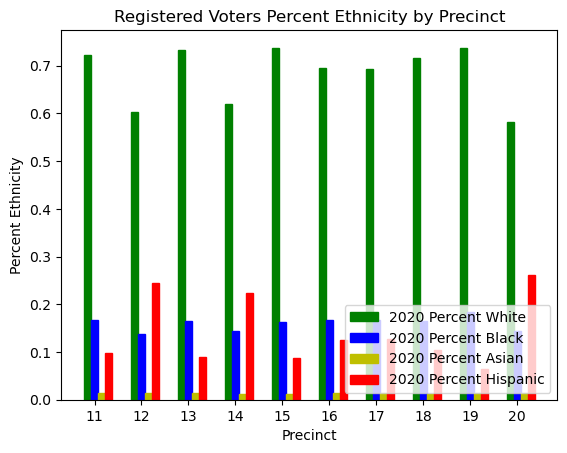

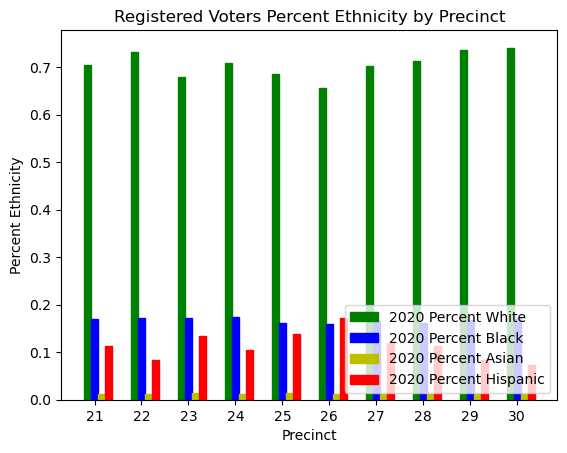

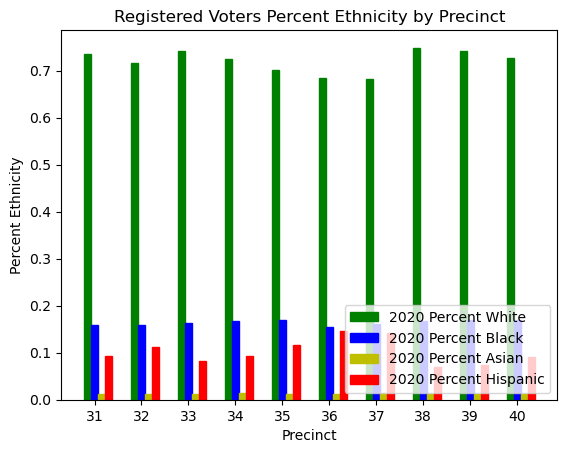

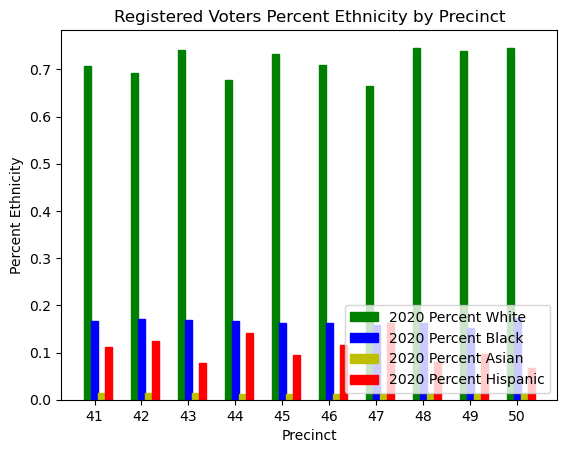

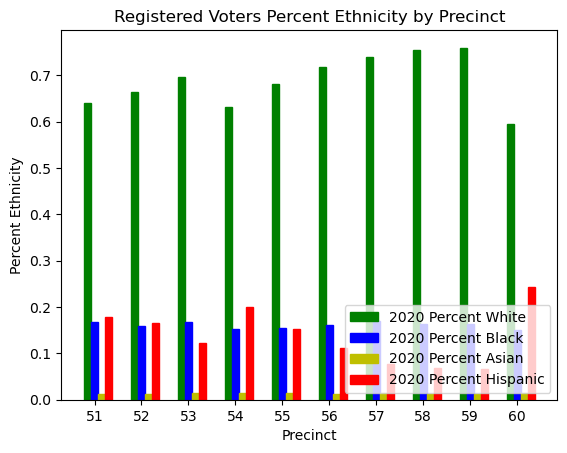

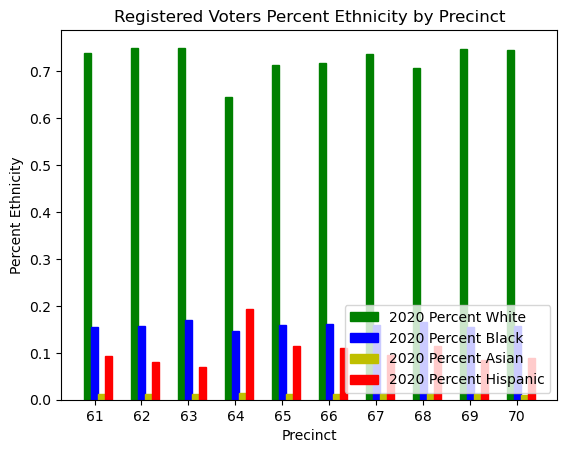

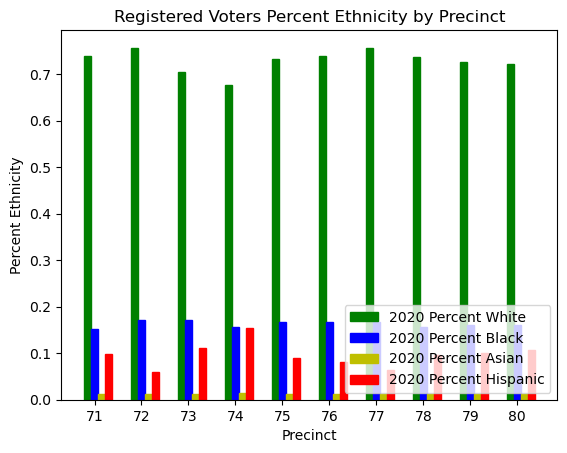

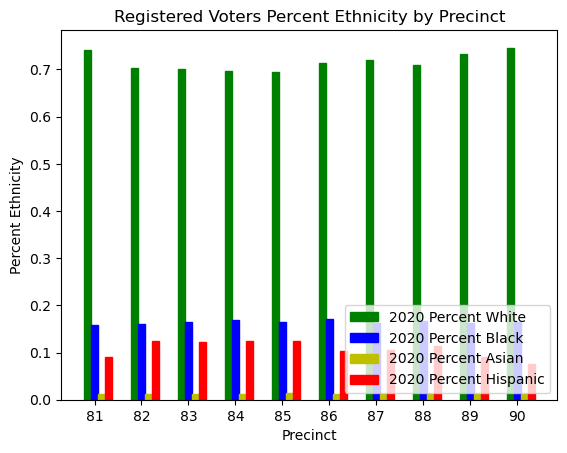

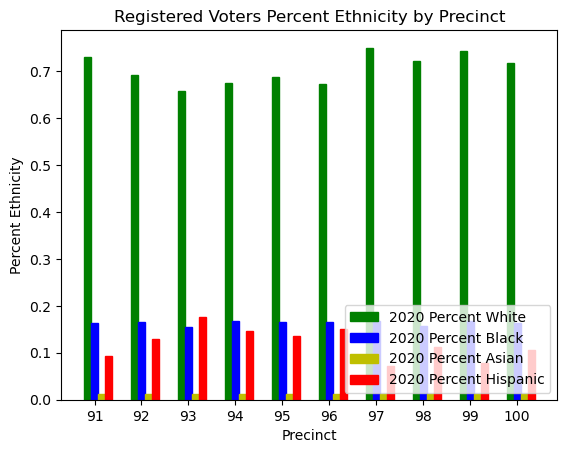

In [38]:
#display(reg_voters_2020_copy.head())

r = np.arange(10)
labels = np.arange(10)+1
width = 0.15


for index in range(0, 100, 10):
    plt.xlabel("Precinct")
    plt.ylabel("Percent Ethnicity")
    plt.title("Registered Voters Percent Ethnicity by Precinct")
    plt.xticks(r+width,labels+index)
    
    
    reg_voters_2020_mean_white = reg_voters_2020_copy.groupby('Voting_Precinct')['avgwhite'].mean()[index:index+10]
    reg_voters_2020_mean_black = reg_voters_2020_copy.groupby('Voting_Precinct')['avgblack'].mean()[index:index+10]
    reg_voters_2020_mean_asian = reg_voters_2020_copy.groupby('Voting_Precinct')['avgaian'].mean()[index:index+10]
    reg_voters_2020_mean_hispanic = reg_voters_2020_copy.groupby('Voting_Precinct')['avghispanic'].mean()[index:index+10]
    

    plt.bar(r, reg_voters_2020_mean_white, color = 'g', width = width, edgecolor = 'g', label='2020 Percent White')
    plt.bar(r+width, reg_voters_2020_mean_black, color = 'b', width = width, edgecolor = 'b', label='2020 Percent Black')
    plt.bar(r+2*width, reg_voters_2020_mean_asian, color = 'y', width = width, edgecolor = 'y', label='2020 Percent Asian')
    plt.bar(r+3*width, reg_voters_2020_mean_hispanic, color = 'r', width = width, edgecolor = 'r', label='2020 Percent Hispanic')
    plt.legend(loc=4)
    file_name = 'Registered Voters Percent Ethnicity by Precinct' + str(index) + '.png'
    #plt.savefig(file_name)
    plt.show()

    

    
    
    

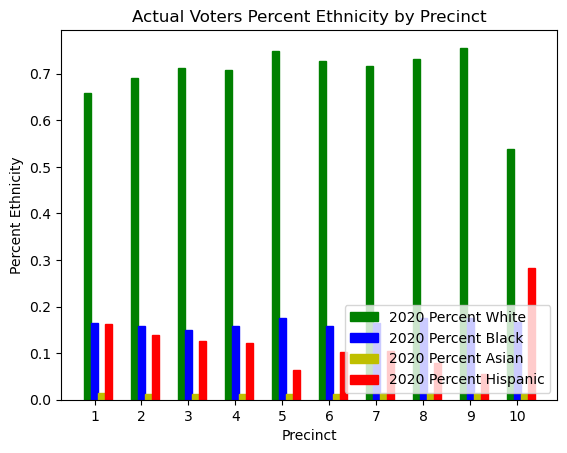

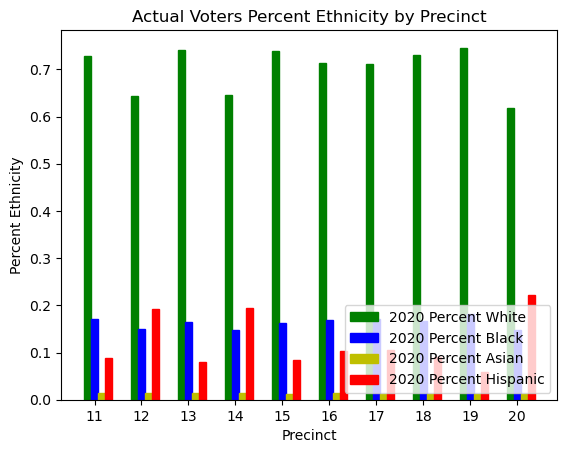

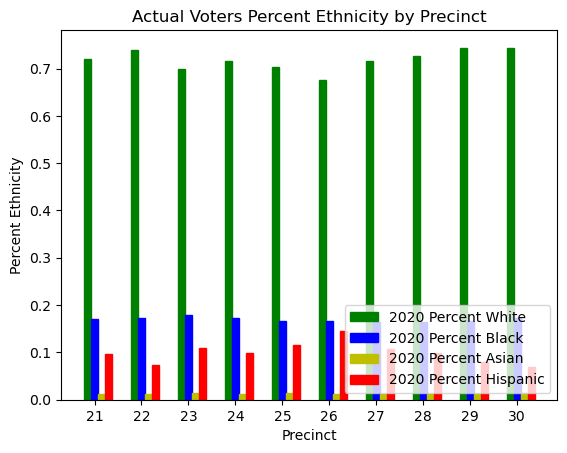

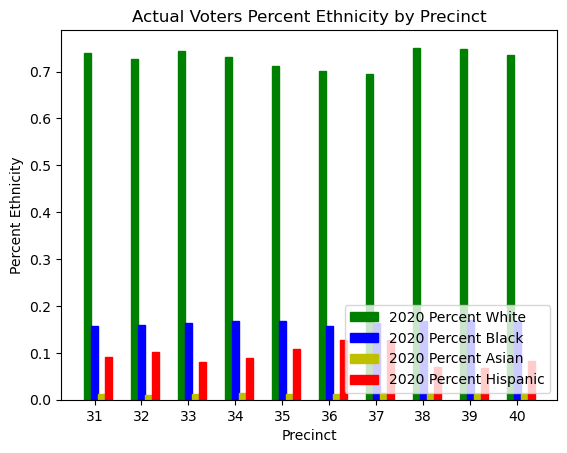

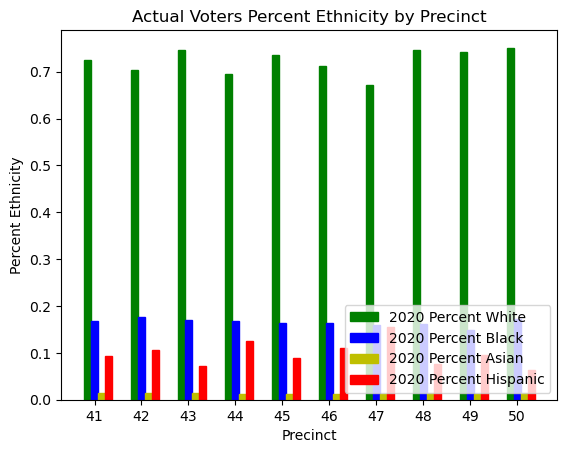

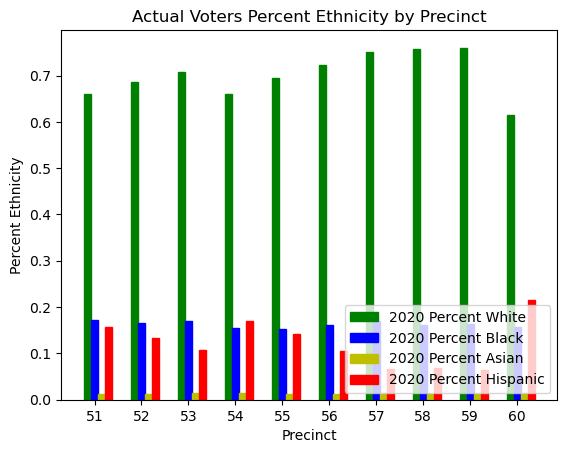

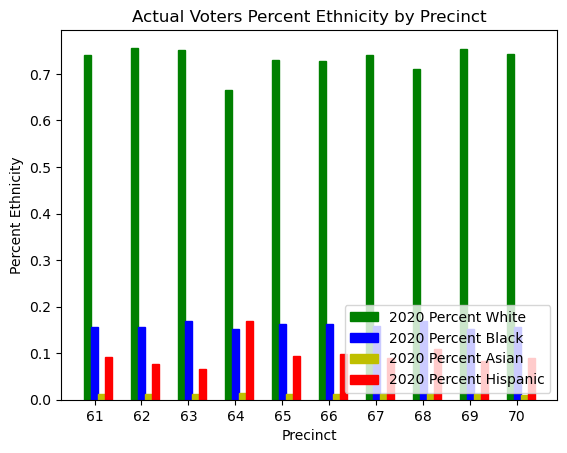

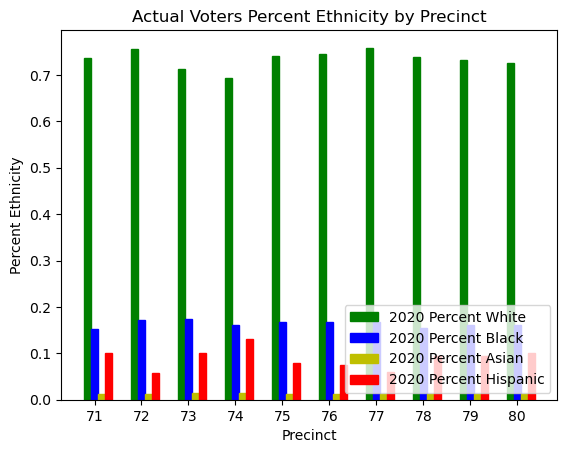

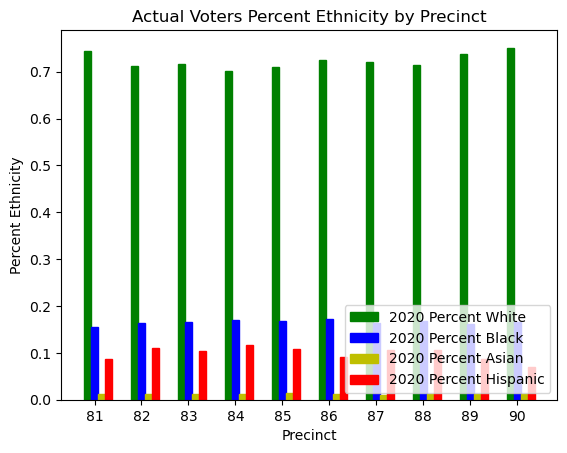

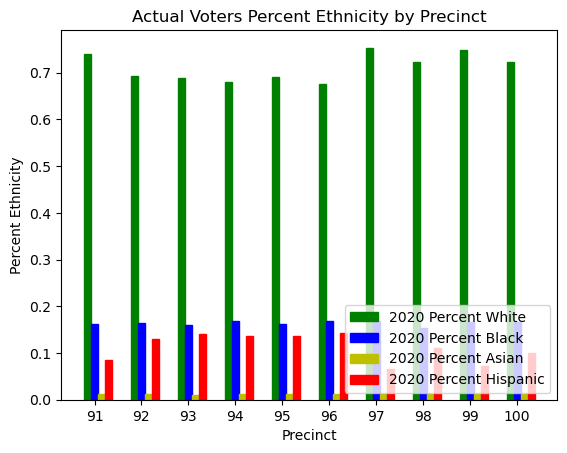

In [39]:
#display(temp_voters_2020.head())

r = np.arange(10)
labels = np.arange(10)+1
width = 0.15


for index in range(0, 100, 10):
    plt.xlabel("Precinct")
    plt.ylabel("Percent Ethnicity")
    plt.title("Actual Voters Percent Ethnicity by Precinct")
    plt.xticks(r+width,labels+index)
    
    act_voters_2020_mean_white = temp_voters_2020.groupby('Voting_Precinct')['avgwhite'].mean()[index+1:index+10]
    act_voters_2020_mean_black = temp_voters_2020.groupby('Voting_Precinct')['avgblack'].mean()[index+1:index+10]
    act_voters_2020_mean_asian = temp_voters_2020.groupby('Voting_Precinct')['avgaian'].mean()[index+1:index+10]
    act_voters_2020_mean_hispanic = temp_voters_2020.groupby('Voting_Precinct')['avghispanic'].mean()[index+1:index+10]
    

    plt.bar(r, act_voters_2020_mean_white, color = 'g', width = width, edgecolor = 'g', label='2020 Percent White')
    plt.bar(r+width, act_voters_2020_mean_black, color = 'b', width = width, edgecolor = 'b', label='2020 Percent Black')
    plt.bar(r+2*width, act_voters_2020_mean_asian, color = 'y', width = width, edgecolor = 'y', label='2020 Percent Asian')
    plt.bar(r+3*width, act_voters_2020_mean_hispanic, color = 'r', width = width, edgecolor = 'r', label='2020 Percent Hispanic')
    plt.legend(loc=4)
    file_name = 'Actual Voters Percent Ethnicity by Precinct' + str(index) + '.png'
    #plt.savefig(file_name)
    plt.show()
    
    

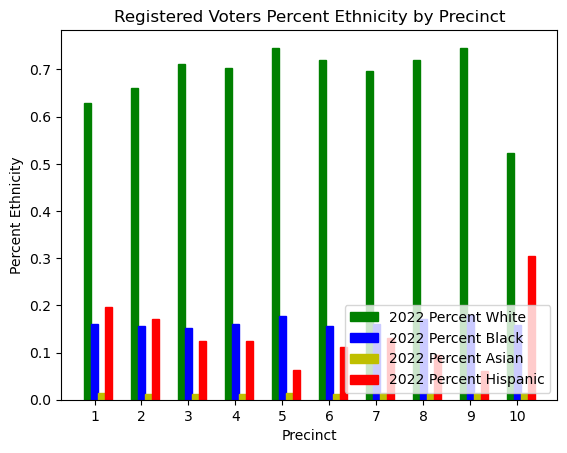

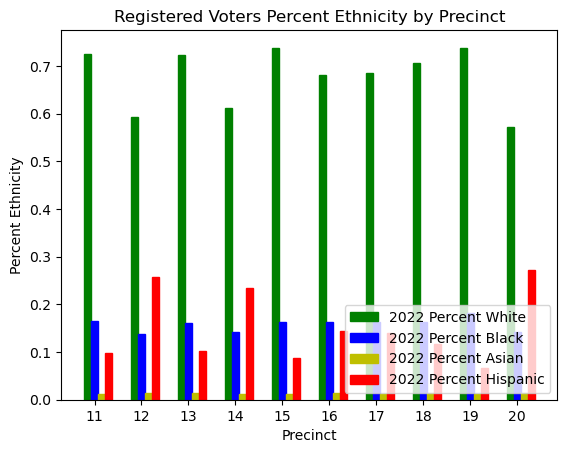

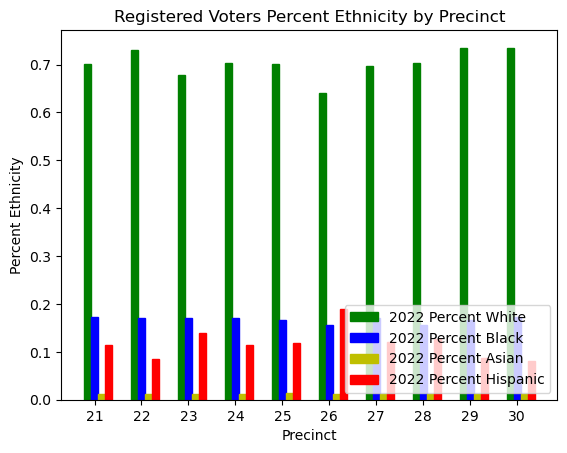

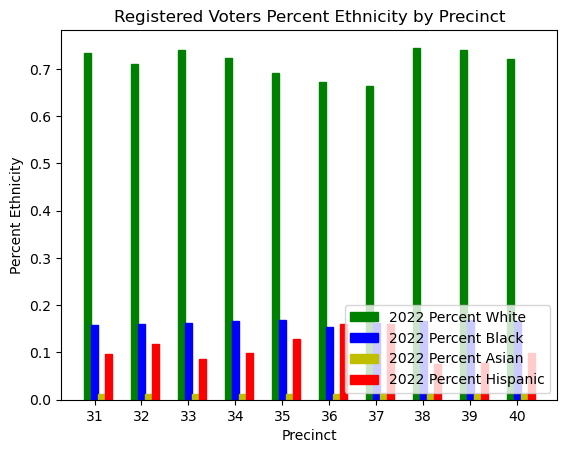

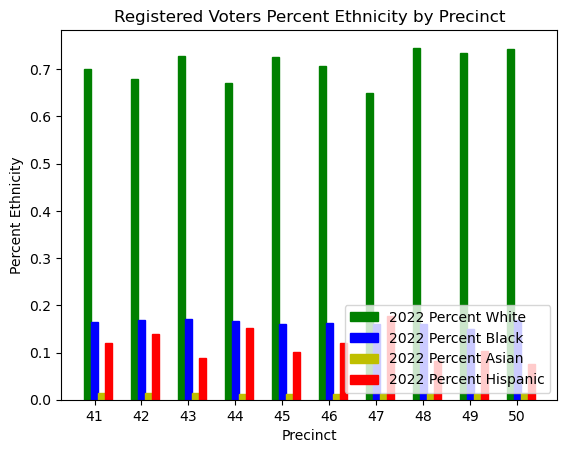

...

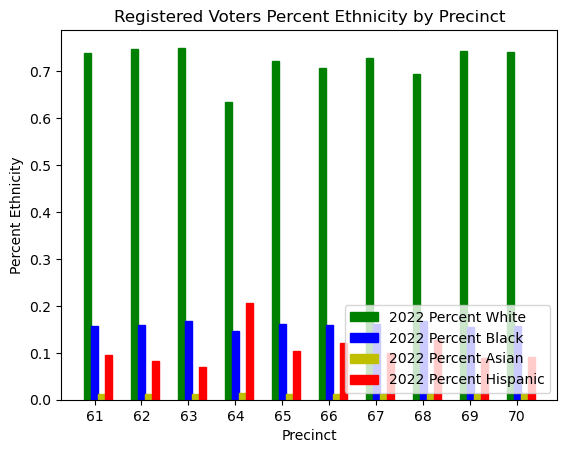

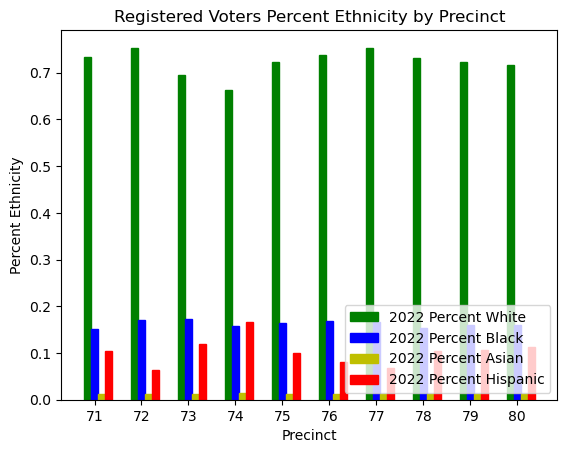

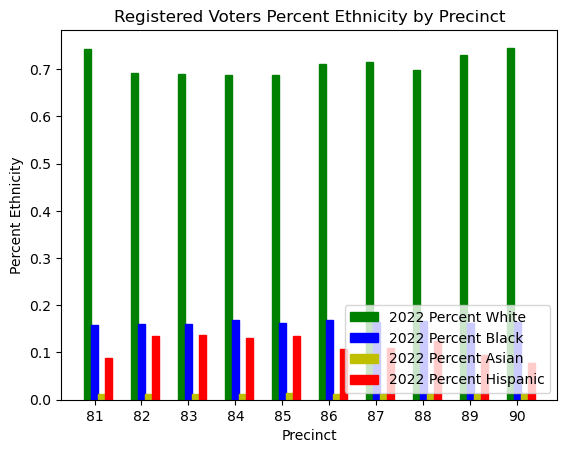

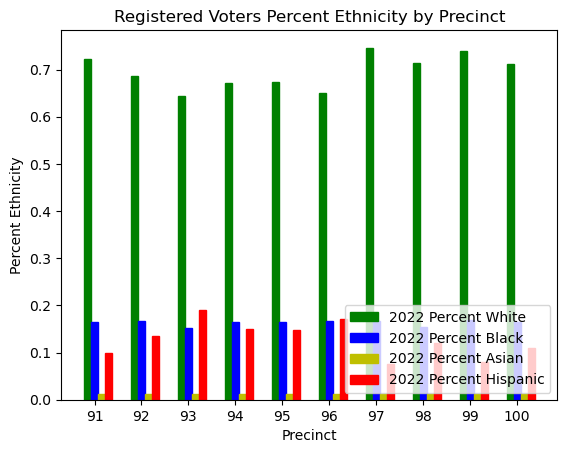

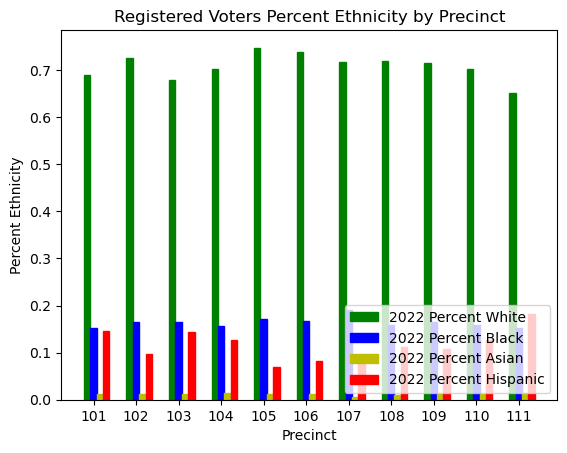

In [40]:
#display(reg_voters_2022_copy.head())

r = np.arange(10)
labels = np.arange(10)+1
width = 0.15


for index in range(0, 100, 10):
    plt.xlabel("Precinct")
    plt.ylabel("Percent Ethnicity")
    plt.title("Registered Voters Percent Ethnicity by Precinct")
    plt.xticks(r+width,labels+index)
    
    reg_voters_2022_mean_white = reg_voters_2022_copy.groupby('Voting_Precinct')['avgwhite'].mean()[index:index+10]
    reg_voters_2022_mean_black = reg_voters_2022_copy.groupby('Voting_Precinct')['avgblack'].mean()[index:index+10]
    reg_voters_2022_mean_asian = reg_voters_2022_copy.groupby('Voting_Precinct')['avgaian'].mean()[index:index+10]
    reg_voters_2022_mean_hispanic = reg_voters_2022_copy.groupby('Voting_Precinct')['avghispanic'].mean()[index:index+10]
    
    plt.bar(r, reg_voters_2022_mean_white, color = 'g', width = width, edgecolor = 'g', label='2022 Percent White')
    plt.bar(r+width, reg_voters_2022_mean_black, color = 'b', width = width, edgecolor = 'b', label='2022 Percent Black')
    plt.bar(r+2*width, reg_voters_2022_mean_asian, color = 'y', width = width, edgecolor = 'y', label='2022 Percent Asian')
    plt.bar(r+3*width, reg_voters_2022_mean_hispanic, color = 'r', width = width, edgecolor = 'r', label='2022 Percent Hispanic')
    plt.legend(loc=4)
    file_name = 'Registered Voters Percent Ethnicity by Precinct' + str(index) + '.png'
    #plt.savefig(file_name)
    plt.show()


r = np.arange(11)

plt.xlabel("Precinct")
plt.ylabel("Percent Ethnicity")
plt.title("Registered Voters Percent Ethnicity by Precinct")
plt.xticks(r+width, r+index+11)
    
reg_voters_2022_mean_white = reg_voters_2022_copy.groupby('Voting_Precinct')['avgwhite'].mean()[100:112]
reg_voters_2022_mean_black = reg_voters_2022_copy.groupby('Voting_Precinct')['avgblack'].mean()[100:112]
reg_voters_2022_mean_asian = reg_voters_2022_copy.groupby('Voting_Precinct')['avgaian'].mean()[100:112]
reg_voters_2022_mean_hispanic = reg_voters_2022_copy.groupby('Voting_Precinct')['avghispanic'].mean()[100:112]

plt.bar(r, reg_voters_2022_mean_white, color = 'g', width = width, edgecolor = 'g', label='2022 Percent White')
plt.bar(r+width, reg_voters_2022_mean_black, color = 'b', width = width, edgecolor = 'b', label='2022 Percent Black')
plt.bar(r+2*width, reg_voters_2022_mean_asian, color = 'y', width = width, edgecolor = 'y', label='2022 Percent Asian')
plt.bar(r+3*width, reg_voters_2022_mean_hispanic, color = 'r', width = width, edgecolor = 'r', label='2022 Percent Hispanic')
plt.legend(loc=4)
file_name = 'Registered Voters Percent Ethnicity by Precinct12.png'
#plt.savefig(file_name)
plt.show()   

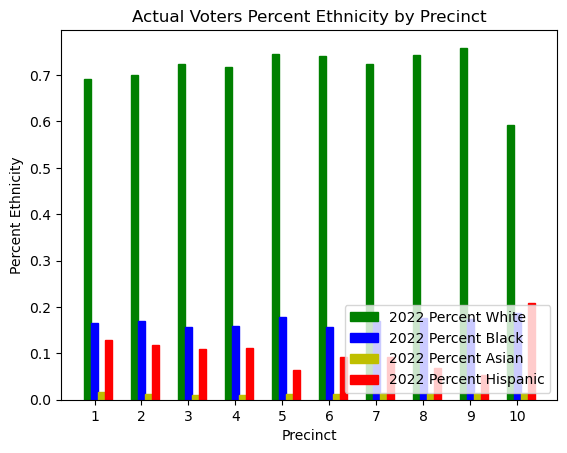

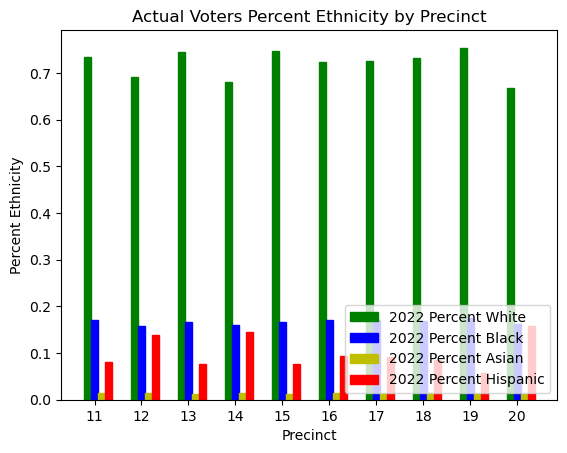

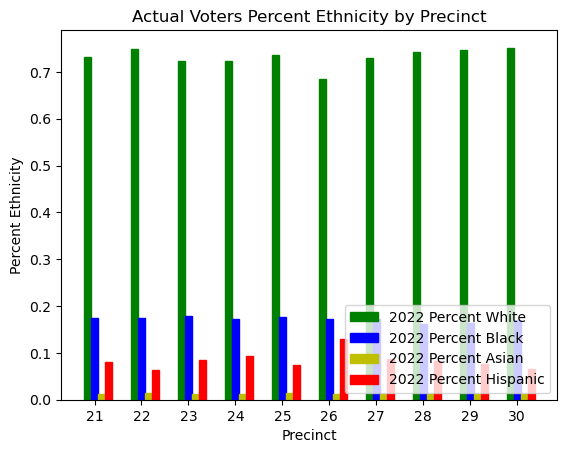

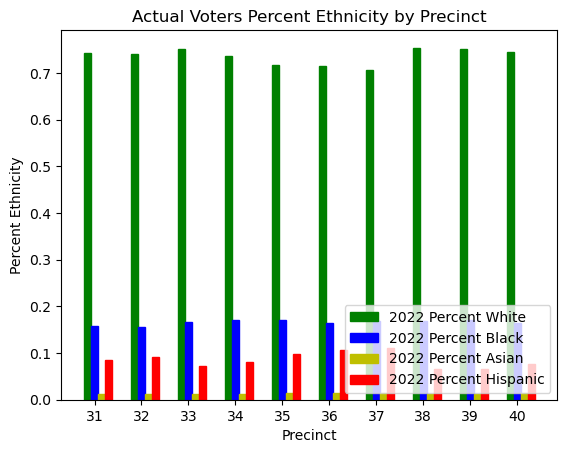

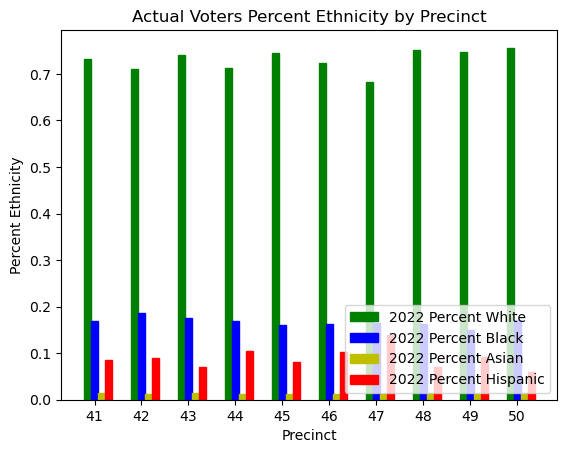

...

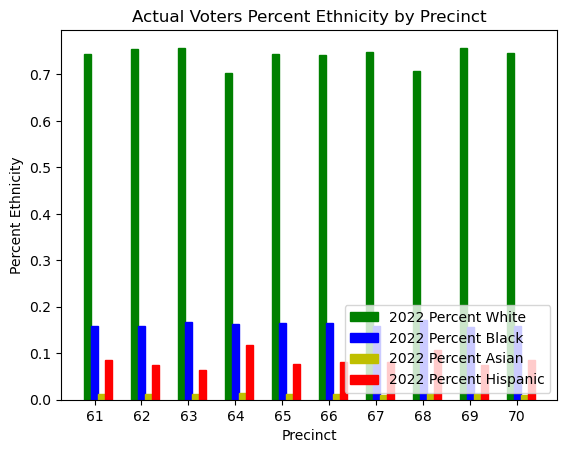

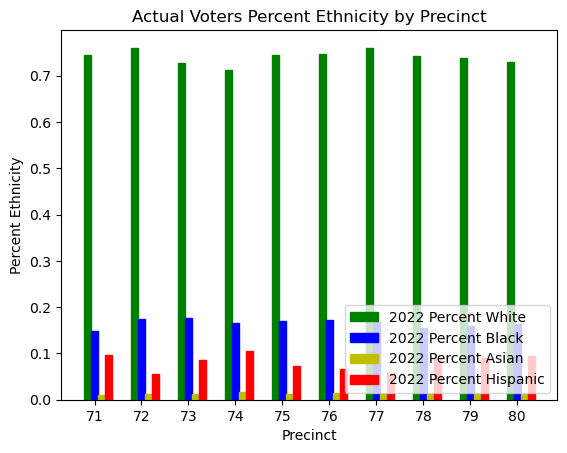

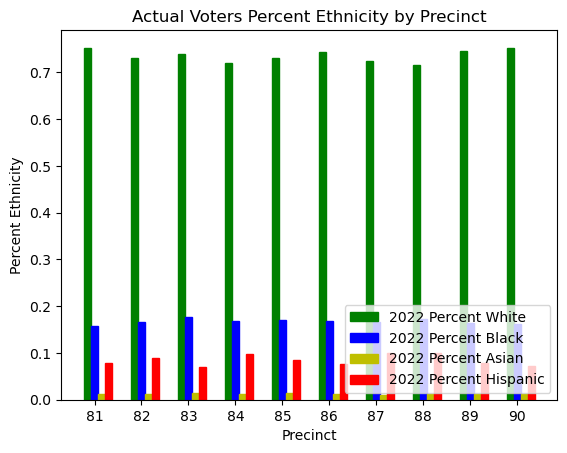

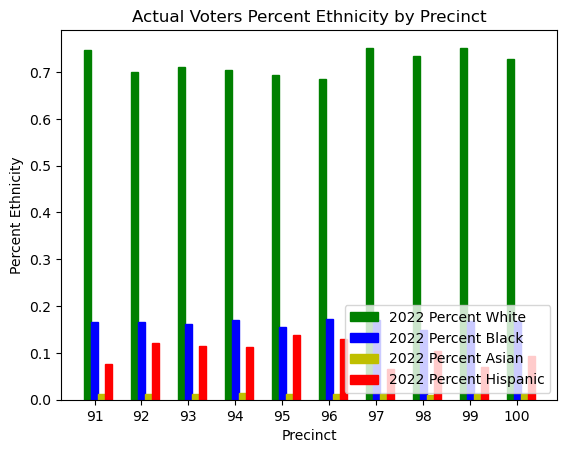

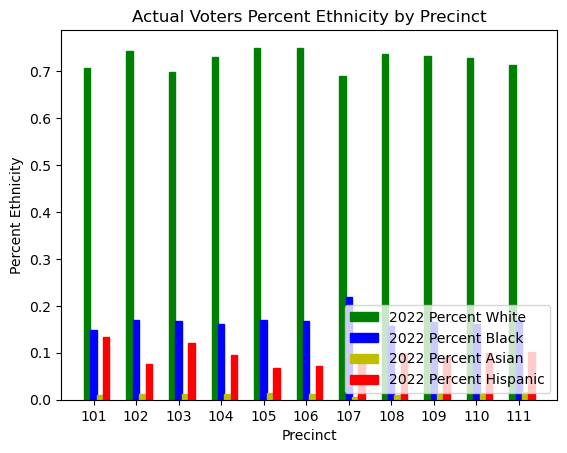

In [41]:
#display(temp_voters_2022.head())

r = np.arange(10)
labels = np.arange(10)+1
width = 0.15


for index in range(0, 100, 10):
    plt.xlabel("Precinct")
    plt.ylabel("Percent Ethnicity")
    plt.title("Actual Voters Percent Ethnicity by Precinct")
    plt.xticks(r+width,labels+index)
    
    act_voters_2022_mean_white = temp_voters_2022.groupby('Voting_Precinct')['avgwhite'].mean()[index+1:index+10]
    act_voters_2022_mean_black = temp_voters_2022.groupby('Voting_Precinct')['avgblack'].mean()[index+1:index+10]
    act_voters_2022_mean_asian = temp_voters_2022.groupby('Voting_Precinct')['avgaian'].mean()[index+1:index+10]
    act_voters_2022_mean_hispanic = temp_voters_2022.groupby('Voting_Precinct')['avghispanic'].mean()[index+1:index+10]
    
    plt.bar(r, act_voters_2022_mean_white, color = 'g', width = width, edgecolor = 'g', label='2022 Percent White')
    plt.bar(r+width, act_voters_2022_mean_black, color = 'b', width = width, edgecolor = 'b', label='2022 Percent Black')
    plt.bar(r+2*width, act_voters_2022_mean_asian, color = 'y', width = width, edgecolor = 'y', label='2022 Percent Asian')
    plt.bar(r+3*width, act_voters_2022_mean_hispanic, color = 'r', width = width, edgecolor = 'r', label='2022 Percent Hispanic')
    plt.legend(loc=4)
    file_name = 'Actual Voters Percent Ethnicity by Precinct' + str(index) + '.png'
    #plt.savefig(file_name)
    plt.show()


r = np.arange(11)

plt.xlabel("Precinct")
plt.ylabel("Percent Ethnicity")
plt.title("Actual Voters Percent Ethnicity by Precinct")
plt.xticks(r+width, r+index+11)
    
act_voters_2022_mean_white = temp_voters_2022.groupby('Voting_Precinct')['avgwhite'].mean()[101:111]
act_voters_2022_mean_black = temp_voters_2022.groupby('Voting_Precinct')['avgblack'].mean()[101:111]
act_voters_2022_mean_asian = temp_voters_2022.groupby('Voting_Precinct')['avgaian'].mean()[101:111]
act_voters_2022_mean_hispanic = temp_voters_2022.groupby('Voting_Precinct')['avghispanic'].mean()[101:111]

plt.bar(r, act_voters_2022_mean_white, color = 'g', width = width, edgecolor = 'g', label='2022 Percent White')
plt.bar(r+width, act_voters_2022_mean_black, color = 'b', width = width, edgecolor = 'b', label='2022 Percent Black')
plt.bar(r+2*width, act_voters_2022_mean_asian, color = 'y', width = width, edgecolor = 'y', label='2022 Percent Asian')
plt.bar(r+3*width, act_voters_2022_mean_hispanic, color = 'r', width = width, edgecolor = 'r', label='2022 Percent Hispanic')
plt.legend(loc=4)
file_name = 'Actual Voters Percent Ethnicity by Precinct 12.png'
#plt.savefig(file_name)
plt.show()


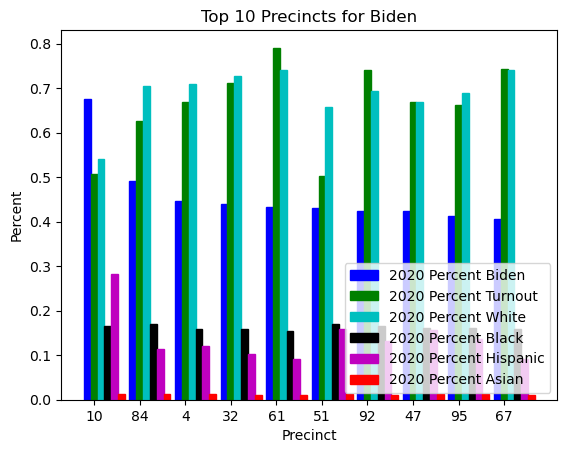

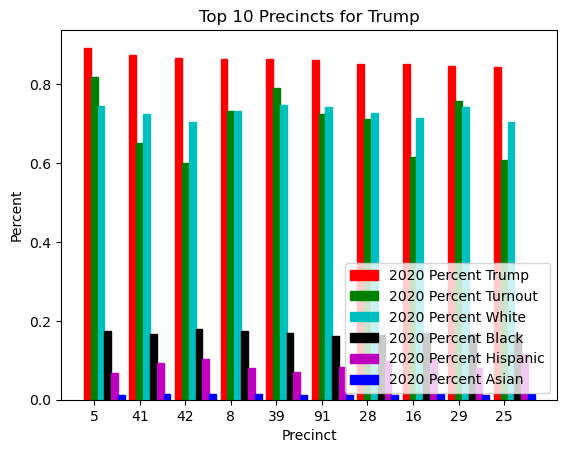

'Biden 2020 Precincts'

,avgwhite,avgblack,avgaian,avghispanic,Age
Precinct,,,,,
10,0.539849,0.165919,0.012643,0.281589,50.750385
84,0.703783,0.169562,0.012236,0.114418,49.667473
4,0.709902,0.158013,0.012021,0.120064,57.424536
32,0.726560,0.159514,0.011278,0.102648,55.362023
61,0.741637,0.155395,0.011565,0.091402,53.371078
51,0.657168,0.170995,0.012342,0.159495,54.536019
92,0.692370,0.164981,0.011020,0.131629,48.573260
47,0.669464,0.160446,0.013189,0.156902,48.967219
95,0.689184,0.161748,0.011792,0.137277,52.274265


'Trump 2020 Precincts'

,avgwhite,avgblack,avgaian,avghispanic,Age
Precinct,,,,,
5,0.745379,0.174193,0.012742,0.067685,58.680672
41,0.725988,0.167255,0.013743,0.093015,53.341607
42,0.703310,0.178866,0.013392,0.104433,53.353398
8,0.731759,0.174602,0.013563,0.080076,54.981481
39,0.747671,0.170504,0.012662,0.069163,54.023823
91,0.742091,0.162660,0.012673,0.082576,54.109453
28,0.727022,0.163350,0.012362,0.097266,54.748172
16,0.714124,0.169236,0.013837,0.102803,52.743760
29,0.741898,0.165684,0.012499,0.079918,52.908437


In [42]:
#display(canvas_report_2020_president.head())
#display(canvas_report_2022_governor.head())


ten_best_2020 = canvas_report_2020_president['perc biden'].nlargest(n=10).index
ten_worst_2020 = canvas_report_2020_president['perc trump'].nlargest(n=10).index

avg_reg_voters_2020 = reg_voters_2020_copy.groupby('Voting_Precinct')[['avgwhite', 'avgblack', 'avgaian', 'avghispanic', 'Age']].mean()
avg_act_voters_2020 = temp_voters_2020.groupby('Precinct')[['avgwhite', 'avgblack', 'avgaian', 'avghispanic', 'Age']].mean()
avg_reg_voters_2020_race = avg_reg_voters_2020.iloc[ten_best_2020]
avg_act_voters_2020_race = avg_act_voters_2020.iloc[ten_best_2020]
avg_reg_voters_2020_race_trump = avg_reg_voters_2020.iloc[ten_worst_2020]
avg_act_voters_2020_race_trump = avg_act_voters_2020.iloc[ten_worst_2020]

width = 0.15
r = np.arange(10)

labels = canvas_report_2020_president.iloc[ten_best_2020, :]['Precinct']
plt.xlabel("Precinct")
plt.ylabel("Percent")
plt.title("Top 10 Precincts for Biden")
plt.xticks(r+width,labels)
   
plt.bar(r, canvas_report_2020_president.iloc[ten_best_2020, :]['perc biden'], color = 'b', width = width, edgecolor = 'b', label='2020 Percent Biden')
plt.bar(r+width, canvas_report_2020_president.iloc[ten_best_2020, :]['Percent Turnout'], color = 'g', width = width, edgecolor = 'g', label='2020 Percent Turnout')
plt.bar(r+2*width,avg_act_voters_2020_race['avgwhite'] , color = 'c', width = width, edgecolor = 'c', label='2020 Percent White')
plt.bar(r+3*width,avg_act_voters_2020_race['avgblack'] , color = 'k', width = width, edgecolor = 'k', label='2020 Percent Black')
plt.bar(r+4*width,avg_act_voters_2020_race['avghispanic'] , color = 'm', width = width, edgecolor = 'm', label='2020 Percent Hispanic')
plt.bar(r+5*width,avg_act_voters_2020_race['avgaian'] , color = 'r', width = width, edgecolor = 'r', label='2020 Percent Asian')

plt.legend(loc=4)
file_name = 'Top 10 Precincts for Biden.png'
#plt.savefig(file_name)
plt.show()


labels = canvas_report_2020_president.iloc[ten_worst_2020, :]['Precinct']
plt.xlabel("Precinct")
plt.ylabel("Percent")
plt.title("Top 10 Precincts for Trump")
plt.xticks(r+width,labels)
   
plt.bar(r, canvas_report_2020_president.iloc[ten_worst_2020, :]['perc trump'], color = 'r', width = width, edgecolor = 'r', label='2020 Percent Trump')
plt.bar(r+width, canvas_report_2020_president.iloc[ten_worst_2020, :]['Percent Turnout'], color = 'g', width = width, edgecolor = 'g', label='2020 Percent Turnout')
plt.bar(r+2*width,avg_act_voters_2020_race_trump['avgwhite'] , color = 'c', width = width, edgecolor = 'c', label='2020 Percent White')
plt.bar(r+3*width,avg_act_voters_2020_race_trump['avgblack'] , color = 'k', width = width, edgecolor = 'k', label='2020 Percent Black')
plt.bar(r+4*width,avg_act_voters_2020_race_trump['avghispanic'] , color = 'm', width = width, edgecolor = 'm', label='2020 Percent Hispanic')
plt.bar(r+5*width,avg_act_voters_2020_race_trump['avgaian'] , color = 'b', width = width, edgecolor = 'b', label='2020 Percent Asian')
plt.legend(loc=4)
file_name = 'Top 10 Precincts for Trump.png'
#plt.savefig(file_name)
plt.show()


display('Biden 2020 Precincts', avg_act_voters_2020_race)
display('Trump 2020 Precincts', avg_act_voters_2020_race_trump)


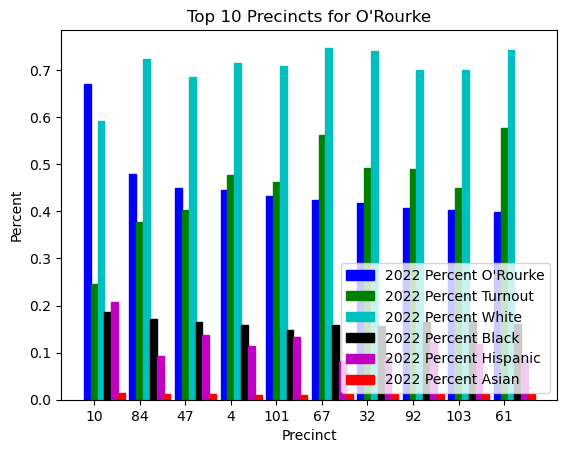

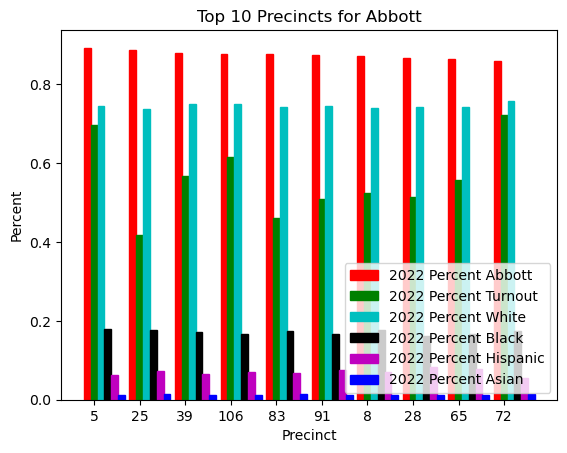

"O'Rourke 2022 Precincts"

,avgwhite,avgblack,avgaian,avghispanic,Age
Precinct,,,,,
10,0.591535,0.186265,0.013993,0.208208,55.308081
84,0.722857,0.170786,0.012598,0.093758,53.624625
47,0.685028,0.164452,0.012999,0.137521,50.677005
4,0.716123,0.158229,0.011040,0.114609,57.870542
101,0.708015,0.148625,0.010875,0.132485,52.485036
67,0.747571,0.159294,0.011439,0.081696,58.839352
32,0.740771,0.157338,0.011520,0.090371,57.783003
92,0.700221,0.166092,0.011988,0.121698,50.450690
103,0.700678,0.167901,0.012412,0.119009,50.075366


'Abbott 2022 Precincts'

,avgwhite,avgblack,avgaian,avghispanic,Age
Precinct,,,,,
5,0.745491,0.179097,0.012462,0.062950,58.091346
25,0.736967,0.175819,0.014861,0.072353,58.303523
39,0.750722,0.171031,0.012539,0.065709,56.451206
106,0.751641,0.166508,0.011803,0.070048,53.044304
83,0.741850,0.174984,0.014888,0.068277,57.377001
91,0.746125,0.166188,0.012643,0.075043,55.538789
8,0.740683,0.176064,0.013014,0.070240,56.315068
28,0.743197,0.162201,0.012719,0.081883,56.988142
65,0.743163,0.165855,0.013029,0.077953,56.413080


In [43]:

ten_best_2022 = canvas_report_2022_governor["perc o'rourke"].nlargest(n=10).index
ten_worst_2022 = canvas_report_2022_governor["perc abbott"].nlargest(n=10).index


avg_reg_voters_2022 = reg_voters_2022_copy.groupby('Voting_Precinct')[['avgwhite', 'avgblack', 'avgaian', 'avghispanic', 'Age']].mean()
avg_act_voters_2022 = temp_voters_2022.groupby('Precinct')[['avgwhite', 'avgblack', 'avgaian', 'avghispanic', 'Age']].mean()
avg_reg_voters_2022_race = avg_reg_voters_2022.iloc[ten_best_2022]
avg_act_voters_2022_race = avg_act_voters_2022.iloc[ten_best_2022]
avg_reg_voters_2022_race_abbott = avg_reg_voters_2022.iloc[ten_worst_2022]
avg_act_voters_2022_race_abbott = avg_act_voters_2022.iloc[ten_worst_2022]

width = 0.15
r = np.arange(10)

labels = canvas_report_2022_governor.iloc[ten_best_2022, :]['Precinct']
plt.xlabel("Precinct")
plt.ylabel("Percent")
plt.title("Top 10 Precincts for O'Rourke")
plt.xticks(r+width,labels)
   
plt.bar(r, canvas_report_2022_governor.iloc[ten_best_2022, :]["perc o'rourke"], color = 'b', width = width, edgecolor = 'b', label="2022 Percent O'Rourke")
plt.bar(r+width, canvas_report_2022_governor.iloc[ten_best_2022, :]['Turnout Percentage'], color = 'g', width = width, edgecolor = 'g', label='2022 Percent Turnout')
plt.bar(r+2*width,avg_act_voters_2022_race['avgwhite'] , color = 'c', width = width, edgecolor = 'c', label='2022 Percent White')
plt.bar(r+3*width,avg_act_voters_2022_race['avgblack'] , color = 'k', width = width, edgecolor = 'k', label='2022 Percent Black')
plt.bar(r+4*width,avg_act_voters_2022_race['avghispanic'] , color = 'm', width = width, edgecolor = 'm', label='2022 Percent Hispanic')
plt.bar(r+5*width,avg_act_voters_2022_race['avgaian'] , color = 'r', width = width, edgecolor = 'r', label='2022 Percent Asian')

plt.legend(loc=4)
file_name = 'Top 10 Precincts for orourke.png'
#plt.savefig(file_name)
plt.show()


labels = canvas_report_2022_governor.iloc[ten_worst_2022, :]['Precinct']
plt.xlabel("Precinct")
plt.ylabel("Percent")
plt.title("Top 10 Precincts for Abbott")
plt.xticks(r+width,labels)
   
plt.bar(r, canvas_report_2022_governor.iloc[ten_worst_2022, :]['perc abbott'], color = 'r', width = width, edgecolor = 'r', label='2022 Percent Abbott')
plt.bar(r+width, canvas_report_2022_governor.iloc[ten_worst_2022, :]['Turnout Percentage'], color = 'g', width = width, edgecolor = 'g', label='2022 Percent Turnout')
plt.bar(r+2*width,avg_act_voters_2022_race_abbott['avgwhite'] , color = 'c', width = width, edgecolor = 'c', label='2022 Percent White')
plt.bar(r+3*width,avg_act_voters_2022_race_abbott['avgblack'] , color = 'k', width = width, edgecolor = 'k', label='2022 Percent Black')
plt.bar(r+4*width,avg_act_voters_2022_race_abbott['avghispanic'] , color = 'm', width = width, edgecolor = 'm', label='2022 Percent Hispanic')
plt.bar(r+5*width,avg_act_voters_2022_race_abbott['avgaian'] , color = 'b', width = width, edgecolor = 'b', label='2022 Percent Asian')
plt.legend(loc=4)
file_name = 'Top 10 Precincts for Abbott.png'
#plt.savefig(file_name)
plt.show()


display("O'Rourke 2022 Precincts", avg_act_voters_2022_race)
display('Abbott 2022 Precincts', avg_act_voters_2022_race_abbott)

In [44]:
#display(canvas_report_2020_president.head())
#display(canvas_report_2022_governor.head())

merged_data_2020 = pd.merge(left=avg_act_voters_2020, right=canvas_report_2020_president[['Precinct', "Percent Turnout", "perc biden", 'perc trump']], how='left', left_on='Precinct', right_on='Precinct')
merged_data_2022 = pd.merge(left=avg_act_voters_2022, right=canvas_report_2022_governor[['Precinct', 'Turnout Percentage', 'Rep Change', 'Dem Change', "perc o'rourke", 'perc abbott']], how='left', left_on='Precinct', right_on='Precinct')

#display(avg_act_voters_2020.head())
#display(avg_act_voters_2022.head())
#display(merged_data_2020.head())
#display(merged_data_2022.head())

display(merged_data_2020.corr(method='pearson'))
#display(merged_data_2020.corr(method='kendall'))
#display(merged_data_2020.corr(method='spearman'))

display(merged_data_2022.corr(method='pearson'))
#display(merged_data_2022.corr(method='kendall'))
#display(merged_data_2022.corr(method='spearman'))



,Precinct,avgwhite,avgblack,avgaian,avghispanic,Age,Percent Turnout,perc biden,perc trump
Precinct,1.000000,0.168452,-0.081463,-0.344490,-0.136111,-0.119280,0.096476,0.123211,-0.123211
avgwhite,0.168452,1.000000,0.219029,-0.194800,-0.981850,0.472569,0.557601,-0.402938,0.402938
avgblack,-0.081463,0.219029,1.000000,0.288311,-0.398871,0.199805,0.060125,-0.425091,0.425091
avgaian,-0.344490,-0.194800,0.288311,1.000000,0.107224,0.174891,-0.126053,-0.490087,0.490087
avghispanic,-0.136111,-0.981850,-0.398871,0.107224,1.000000,-0.488135,-0.535606,0.471393,-0.471393
Age,-0.119280,0.472569,0.199805,0.174891,-0.488135,1.000000,0.166736,-0.278955,0.278955
Percent Turnout,0.096476,0.557601,0.060125,-0.126053,-0.535606,0.166736,1.000000,-0.123676,0.123676
perc biden,0.123211,-0.402938,-0.425091,-0.490087,0.471393,-0.278955,-0.123676,1.000000,-1.000000
perc trump,-0.123211,0.402938,0.425091,0.490087,-0.471393,0.278955,0.123676,-1.000000,1.000000


,Precinct,avgwhite,avgblack,avgaian,avghispanic,Age,Turnout Percentage,Rep Change,Dem Change,perc o'rourke,perc abbott
Precinct,1.000000,0.102918,-0.099163,-0.286361,-0.056558,-0.210240,0.157459,0.033307,-0.033307,0.101708,-0.101708
avgwhite,0.102918,1.000000,-0.204681,-0.148762,-0.941332,0.414637,0.790724,0.213265,-0.213265,-0.502675,0.502675
avgblack,-0.099163,-0.204681,1.000000,0.060644,-0.133959,0.175582,-0.225598,-0.117865,0.117865,-0.228781,0.228781
avgaian,-0.286361,-0.148762,0.060644,1.000000,0.079919,0.182472,-0.235576,-0.126881,0.126881,-0.377166,0.377166
avghispanic,-0.056558,-0.941332,-0.133959,0.079919,1.000000,-0.491136,-0.716687,-0.179830,0.179830,0.608771,-0.608771
Age,-0.210240,0.414637,0.175582,0.182472,-0.491136,1.000000,0.288077,0.259066,-0.259066,-0.300146,0.300146
Turnout Percentage,0.157459,0.790724,-0.225598,-0.235576,-0.716687,0.288077,1.000000,0.165474,-0.165474,-0.264638,0.264638
Rep Change,0.033307,0.213265,-0.117865,-0.126881,-0.179830,0.259066,0.165474,1.000000,-1.000000,-0.092572,0.092572
Dem Change,-0.033307,-0.213265,0.117865,0.126881,0.179830,-0.259066,-0.165474,-1.000000,1.000000,0.092572,-0.092572
perc o'rourke,0.101708,-0.502675,-0.228781,-0.377166,0.608771,-0.300146,-0.264638,-0.092572,0.092572,1.000000,-1.000000


In [45]:
#display(canvas_report_2020_us_senator.head())
#display(canvas_report_2022_lt_governor.head())
#display(canvas_report_2022_attorney_general.head())

canvas_report_2020_us_senator['perc cornyn'] = canvas_report_2020_us_senator['REP\nJohn Cornyn']/canvas_report_2020_us_senator['Total Ballots Cast']
canvas_report_2020_us_senator['perc hegar'] = canvas_report_2020_us_senator['DEM\nMary "MJ" Hegar']/canvas_report_2020_us_senator['Total Ballots Cast']
canvas_report_2022_lt_governor['perc patrick'] = canvas_report_2022_lt_governor['Dan Patrick, REP']/canvas_report_2022_lt_governor['Cast Votes']
canvas_report_2022_lt_governor['perc collier'] = canvas_report_2022_lt_governor['Mike Collier, DEM']/canvas_report_2022_lt_governor['Cast Votes']
canvas_report_2022_attorney_general['perc paxton'] = canvas_report_2022_attorney_general['Ken Paxton, REP']/canvas_report_2022_attorney_general['Cast Votes']
canvas_report_2022_attorney_general['perc garza'] = canvas_report_2022_attorney_general['Rochelle Mercedes Garza, DEM']/canvas_report_2022_attorney_general['Cast Votes']

merged_data_2020_senate = pd.merge(left=avg_act_voters_2020, right=canvas_report_2020_us_senator[['Precinct', "Percent Turnout", "perc cornyn", 'perc hegar']], how='left', left_on='Precinct', right_on='Precinct')
merged_data_2022_lt_governor = pd.merge(left=avg_act_voters_2022, right=canvas_report_2022_lt_governor[['Precinct', 'Turnout Percentage', "perc patrick", 'perc collier']], how='left', left_on='Precinct', right_on='Precinct')
merged_data_2022_attorney_general = pd.merge(left=avg_act_voters_2022, right=canvas_report_2022_attorney_general[['Precinct', 'Turnout Percentage', "perc paxton", 'perc garza']], how='left', left_on='Precinct', right_on='Precinct')


display(canvas_report_2020_us_senator.head())
display(canvas_report_2022_lt_governor.head())
display(canvas_report_2022_attorney_general.head())


display(merged_data_2020_senate.head())
display(merged_data_2022_lt_governor.head())
display(merged_data_2022_attorney_general.head())


display(merged_data_2020_senate.corr(method='pearson'))
display(merged_data_2022_lt_governor.corr(method='pearson'))
display(merged_data_2022_attorney_general.corr(method='pearson'))





,Precinct,Early Ballots Cast,Election Ballots Cast,Total Ballots Cast,Registered Voters,Percent Turnout,REP\nJohn Cornyn,"DEM\nMary ""MJ"" Hegar",LIB\nKerry Douglas McKennon,GRN\nDavid B. Collins,Ricardo Turullols-Bonilla,Totals,perc cornyn,perc hegar
0,1,2457,215,2672,2123,1.2586,1797,722,73,16,0,2608,0.672530,0.270210
1,2,1665,293,1958,2630,0.7445,1365,513,37,5,0,1920,0.697140,0.262002
2,3,4298,421,4719,6294,0.7498,2871,1705,72,14,0,4662,0.608392,0.361305
3,4,1200,179,1379,2062,0.6688,743,564,28,11,0,1346,0.538796,0.408992
4,5,135,113,248,303,0.8185,214,27,4,0,0,245,0.862903,0.108871


,Precinct,"Dan Patrick, REP","Mike Collier, DEM","Shanna Steele, LIB",Cast Votes,Undervotes,Overvotes,Early Voting Ballots Cast,Absentee Ballots Cast,Election Day Ballots Cast,Total Ballots Cast,Registered Voters,Turnout Percentage,perc patrick,perc collier
0,1,665,353,30,1048,10,0,744,25,289,1058,2110,0.5014,0.634542,0.336832
1,2,991,378,34,1403,14,0,826,77,514,1417,2991,0.4738,0.706344,0.269423
2,3,1530,720,59,2309,12,0,1574,83,664,2321,4280,0.5423,0.662625,0.311823
3,4,498,392,41,931,11,0,559,69,314,942,1976,0.4767,0.534909,0.421053
4,5,197,28,5,230,1,0,80,3,148,231,331,0.6979,0.856522,0.121739


,Precinct,"Ken Paxton, REP","Rochelle Mercedes Garza, DEM","Mark Ash, LIB",Cast Votes,Undervotes,Overvotes,Early Voting Ballots Cast,Absentee Ballots Cast,Election Day Ballots Cast,Total Ballots Cast,Registered Voters,Turnout Percentage,perc paxton,perc garza
0,1,676,351,18,1045,13,0,744,25,289,1058,2110,0.5014,0.646890,0.335885
1,2,991,380,33,1404,13,0,826,77,514,1417,2991,0.4738,0.705840,0.270655
2,3,1535,711,53,2299,22,0,1574,83,664,2321,4280,0.5423,0.667682,0.309265
3,4,497,396,35,928,14,0,559,69,314,942,1976,0.4767,0.535560,0.426724
4,5,198,26,6,230,1,0,80,3,148,231,331,0.6979,0.860870,0.113043


,Precinct,avgwhite,avgblack,avgaian,avghispanic,Age,Percent Turnout,perc cornyn,perc hegar
0,1,0.659121,0.164419,0.014644,0.161815,50.589975,1.2586,0.672530,0.270210
1,2,0.690416,0.158281,0.013166,0.138137,54.598051,0.7445,0.697140,0.262002
2,3,0.711197,0.149720,0.011520,0.127563,50.453540,0.7498,0.608392,0.361305
3,4,0.709902,0.158013,0.012021,0.120064,57.424536,0.6688,0.538796,0.408992
4,5,0.745379,0.174193,0.012742,0.067685,58.680672,0.8185,0.862903,0.108871


,Precinct,avgwhite,avgblack,avgaian,avghispanic,Age,Turnout Percentage,perc patrick,perc collier
0,1,0.692526,0.163831,0.016655,0.126988,53.810642,0.5014,0.634542,0.336832
1,2,0.701184,0.170147,0.012318,0.116350,55.670874,0.4738,0.706344,0.269423
2,3,0.722179,0.156118,0.010886,0.110817,53.329787,0.5423,0.662625,0.311823
3,4,0.716123,0.158229,0.011040,0.114609,57.870542,0.4767,0.534909,0.421053
4,5,0.745491,0.179097,0.012462,0.062950,58.091346,0.6979,0.856522,0.121739


,Precinct,avgwhite,avgblack,avgaian,avghispanic,Age,Turnout Percentage,perc paxton,perc garza
0,1,0.692526,0.163831,0.016655,0.126988,53.810642,0.5014,0.646890,0.335885
1,2,0.701184,0.170147,0.012318,0.116350,55.670874,0.4738,0.705840,0.270655
2,3,0.722179,0.156118,0.010886,0.110817,53.329787,0.5423,0.667682,0.309265
3,4,0.716123,0.158229,0.011040,0.114609,57.870542,0.4767,0.535560,0.426724
4,5,0.745491,0.179097,0.012462,0.062950,58.091346,0.6979,0.860870,0.113043


,Precinct,avgwhite,avgblack,avgaian,avghispanic,Age,Percent Turnout,perc cornyn,perc hegar
Precinct,1.000000,0.168452,-0.081463,-0.344490,-0.136111,-0.119280,0.096476,-0.080235,0.113043
avgwhite,0.168452,1.000000,0.219029,-0.194800,-0.981850,0.472569,0.557601,0.521918,-0.443236
avgblack,-0.081463,0.219029,1.000000,0.288311,-0.398871,0.199805,0.060125,0.395324,-0.410631
avgaian,-0.344490,-0.194800,0.288311,1.000000,0.107224,0.174891,-0.126053,0.418787,-0.469325
avghispanic,-0.136111,-0.981850,-0.398871,0.107224,1.000000,-0.488135,-0.535606,-0.576752,0.506350
Age,-0.119280,0.472569,0.199805,0.174891,-0.488135,1.000000,0.166736,0.325497,-0.303259
Percent Turnout,0.096476,0.557601,0.060125,-0.126053,-0.535606,0.166736,1.000000,0.227799,-0.163174
perc cornyn,-0.080235,0.521918,0.395324,0.418787,-0.576752,0.325497,0.227799,1.000000,-0.993019
perc hegar,0.113043,-0.443236,-0.410631,-0.469325,0.506350,-0.303259,-0.163174,-0.993019,1.000000


,Precinct,avgwhite,avgblack,avgaian,avghispanic,Age,Turnout Percentage,perc patrick,perc collier
Precinct,1.000000,0.102918,-0.099163,-0.286361,-0.056558,-0.210240,0.157459,-0.094822,0.099593
avgwhite,0.102918,1.000000,-0.204681,-0.148762,-0.941332,0.414637,0.790724,0.467235,-0.458362
avgblack,-0.099163,-0.204681,1.000000,0.060644,-0.133959,0.175582,-0.225598,0.269548,-0.254564
avgaian,-0.286361,-0.148762,0.060644,1.000000,0.079919,0.182472,-0.235576,0.360891,-0.374214
avghispanic,-0.056558,-0.941332,-0.133959,0.079919,1.000000,-0.491136,-0.716687,-0.585682,0.572241
Age,-0.210240,0.414637,0.175582,0.182472,-0.491136,1.000000,0.288077,0.280341,-0.268636
Turnout Percentage,0.157459,0.790724,-0.225598,-0.235576,-0.716687,0.288077,1.000000,0.225003,-0.211299
perc patrick,-0.094822,0.467235,0.269548,0.360891,-0.585682,0.280341,0.225003,1.000000,-0.998784
perc collier,0.099593,-0.458362,-0.254564,-0.374214,0.572241,-0.268636,-0.211299,-0.998784,1.000000


,Precinct,avgwhite,avgblack,avgaian,avghispanic,Age,Turnout Percentage,perc paxton,perc garza
Precinct,1.000000,0.102918,-0.099163,-0.286361,-0.056558,-0.210240,0.157459,-0.094595,0.085642
avgwhite,0.102918,1.000000,-0.204681,-0.148762,-0.941332,0.414637,0.790724,0.467565,-0.477639
avgblack,-0.099163,-0.204681,1.000000,0.060644,-0.133959,0.175582,-0.225598,0.241468,-0.250056
avgaian,-0.286361,-0.148762,0.060644,1.000000,0.079919,0.182472,-0.235576,0.378267,-0.368378
avghispanic,-0.056558,-0.941332,-0.133959,0.079919,1.000000,-0.491136,-0.716687,-0.577376,0.590045
Age,-0.210240,0.414637,0.175582,0.182472,-0.491136,1.000000,0.288077,0.264491,-0.273699
Turnout Percentage,0.157459,0.790724,-0.225598,-0.235576,-0.716687,0.288077,1.000000,0.229519,-0.231113
perc paxton,-0.094595,0.467565,0.241468,0.378267,-0.577376,0.264491,0.229519,1.000000,-0.998554
perc garza,0.085642,-0.477639,-0.250056,-0.368378,0.590045,-0.273699,-0.231113,-0.998554,1.000000
